In [7]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import seaborn as sns
from sklearn.linear_model import LinearRegression
from statsmodels.formula.api import ols
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

## Анализ повторяющихся данных (только о те каналы и рекламодатели, которые присутствовали на рынке непрерывно в течение всего анализируемого периода с 2020 по 2023 год)

In [2]:
df1 = pd.read_excel('Повторяющиеся данные.xlsx')

periods = {
    '1 полугодие 2020': (0, 18),
    '2 полугодие 2020': (18, 36), 
    '1 полугодие 2021': (36, 54),
    '2 полугодие 2021': (54, 72),
    '1 полугодие 2022': (72, 90),
    '2 полугодие 2022': (90, 108),
    '1 полугодие 2023': (108, 126),
    '2 полугодие 2023': (126, 144)
}

column_names_1 = ['Канал', 'Рекламодатель', 'Rtg(000)[Сумма]', 'Rtg%[Сумма]', 'AvReach(000)', 
    'AvReach%', 'CumReach(000)', 'CumReach%', 'StandRtg%[Сумма]', 'Universe(000)', 
    'Sample', 'ATV[Сумма]', 'ATVReach[Сумма]', 'TAud', 'Quantity', 
    'Duration[Сумма]', 'ConsolidatedCostRUB', 'CostByGRPRUB']

all_data = []

period_order = [
    '1 полугодие 2020',
    '2 полугодие 2020', 
    '1 полугодие 2021',
    '2 полугодие 2021',
    '1 полугодие 2022',
    '2 полугодие 2022',
    '1 полугодие 2023',
    '2 полугодие 2023'
]

for period_name in period_order:  
    start_col, end_col = periods[period_name]
    period_data = df1.iloc[2:, start_col:end_col].copy()
    period_data.columns = column_names_1
    
    period_data['Период'] = period_name
    
    period_data = period_data.dropna(subset=['Канал', 'Рекламодатель'])
    
    all_data.append(period_data)

final_df1 = pd.concat(all_data, ignore_index=True)

final_df1['Период'] = pd.Categorical(
    final_df1['Период'], 
    categories=period_order,
    ordered=True
)

final_df1 = final_df1.sort_values('Период')

num_columns = ['Rtg(000)[Сумма]', 'Rtg%[Сумма]', 'AvReach(000)', 
    'AvReach%', 'CumReach(000)', 'CumReach%', 'StandRtg%[Сумма]', 'Universe(000)', 
    'Sample', 'ATV[Сумма]', 'ATVReach[Сумма]', 'TAud', 'Quantity', 
    'Duration[Сумма]', 'ConsolidatedCostRUB', 'CostByGRPRUB']

for col in num_columns:
    final_df1[col] = pd.to_numeric(final_df1[col], errors='coerce')

final_df1.head()

,Канал,Рекламодатель,Rtg(000)[Сумма],Rtg%[Сумма],AvReach(000),AvReach%,CumReach(000),CumReach%,StandRtg%[Сумма],Universe(000),Sample,ATV[Сумма],ATVReach[Сумма],TAud,Quantity,Duration[Сумма],ConsolidatedCostRUB,CostByGRPRUB,Период
0,2X2 (СЕТЕВОЕ ВЕЩАНИЕ),DAMATE,83430.34132,61.16872,75.02410,0.05501,11234.43974,8.23677,50.29036,136393.79300,15452.21649,0.61169,7.42630,83430.34132,1112,18530,0.000000e+00,0.000000e+00,1 полугодие 2020
1525,СПАС (СЕТЕВОЕ ВЕЩАНИЕ),ЭКСМО,27800.50324,20.38253,88.81950,0.06512,13680.73249,10.03032,34.92651,136393.79299,15533.35593,0.20383,2.03209,27800.50324,313,11099,1.224534e+06,1.224534e+06,1 полугодие 2020
1524,СПАС (СЕТЕВОЕ ВЕЩАНИЕ),СТУДИО МОДЕРНА,668937.87693,490.44598,121.73257,0.08925,53197.56830,39.00292,3989.12174,136393.79300,15360.90000,4.90446,12.57460,668937.87693,5495,891221,1.207563e+08,1.207563e+08,1 полугодие 2020
1523,СПАС (СЕТЕВОЕ ВЕЩАНИЕ),РУССКАЯ ПРАВОСЛАВНАЯ ЦЕРКОВЬ,52825.36989,38.73004,108.23983,0.07936,20018.73970,14.67716,109.23823,136393.79300,15577.26923,0.38730,2.63880,52825.36989,488,25939,4.084953e+06,4.084953e+06,1 полугодие 2020
1522,СПАС (СЕТЕВОЕ ВЕЩАНИЕ),ПОМОГИ СПАСТИ ЖИЗНЬ,49585.09637,36.35436,116.93576,0.08573,16960.97434,12.43530,109.06309,136393.79299,15590.46552,0.36354,2.92348,49585.09637,424,25440,3.396695e+06,3.396695e+06,1 полугодие 2020


## Обработка пропусков 

In [3]:
final_df1.isnull().sum().sort_values(ascending=False)

TAud                   1
StandRtg%[Сумма]       1
Канал                  0
Sample                 0
CostByGRPRUB           0
ConsolidatedCostRUB    0
Duration[Сумма]        0
Quantity               0
ATVReach[Сумма]        0
ATV[Сумма]             0
Universe(000)          0
Рекламодатель          0
CumReach%              0
CumReach(000)          0
AvReach%               0
AvReach(000)           0
Rtg%[Сумма]            0
Rtg(000)[Сумма]        0
Период                 0
dtype: int64

In [4]:
final_df1[final_df1['StandRtg%[Сумма]'].isnull()].head()

,Канал,Рекламодатель,Rtg(000)[Сумма],Rtg%[Сумма],AvReach(000),AvReach%,CumReach(000),CumReach%,StandRtg%[Сумма],Universe(000),Sample,ATV[Сумма],ATVReach[Сумма],TAud,Quantity,Duration[Сумма],ConsolidatedCostRUB,CostByGRPRUB,Период
10457,МУЖСКОЙ РЕКЛАМНЫЙ КАНАЛ (СЕТЕВОЕ ВЕЩАНИЕ),АЛЬФАСТРАХОВАНИЕ,0.0,0.0,0.0,0.0,0.0,0.0,NaN,136595.06596,17344.0,0.0,0.0,NaN,1,20,0.0,0.0,1 полугодие 2022


In [5]:
final_df1 = final_df1.dropna(subset=['StandRtg%[Сумма]', 'TAud'])
final_df1.isnull().sum().sort_values(ascending=False)

Канал                  0
Sample                 0
CostByGRPRUB           0
ConsolidatedCostRUB    0
Duration[Сумма]        0
Quantity               0
TAud                   0
ATVReach[Сумма]        0
ATV[Сумма]             0
Universe(000)          0
Рекламодатель          0
StandRtg%[Сумма]       0
CumReach%              0
CumReach(000)          0
AvReach%               0
AvReach(000)           0
Rtg%[Сумма]            0
Rtg(000)[Сумма]        0
Период                 0
dtype: int64

## Выбросы

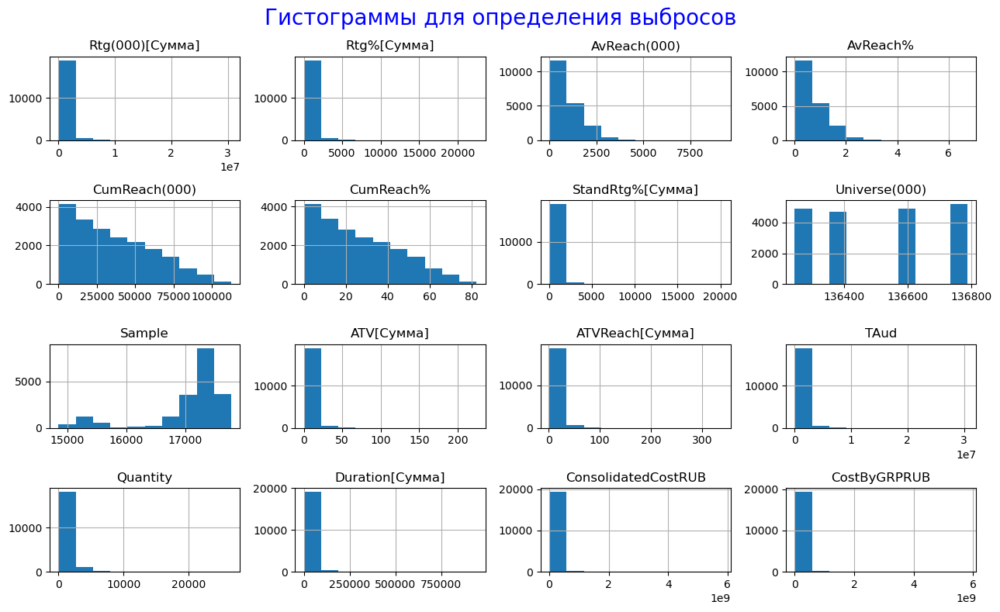

In [6]:
final_df1.hist(figsize=(13,8))
plt.suptitle('Гистограммы для определения выбросов', size = 20, color = 'blue')
plt.tight_layout();
plt.savefig('graph1.png', dpi=300, bbox_inches='tight')

 Большинство признаков имеют сильно скошенное распределение, так как основная масса значений сосредоточена в левой части графика (близко к нулю), а справа видны редкие, но очень большие значения. Следовательно, выбросы точно присутствуют у переменных Rtg(000)(Сумма), Rtg%[Сумма], AvReach(000), CumReach(000), StandRtg%[Сумма], ATV[Сумма], ATVReach[Сумма], Quantity, Duration[Сумма], ConsolidatedCostRUB, CostByGRPRUB.
Выбросов скорее всего нет у AvReach%, CumReach%, Universe(000), Sample, TAud. Таким образом, выбросы необходимо убрать.

Также построим графики boxplots для каждой переменной, чтобы посмотреть однородны ли наши данные и еще раз проанализировать выбросы.

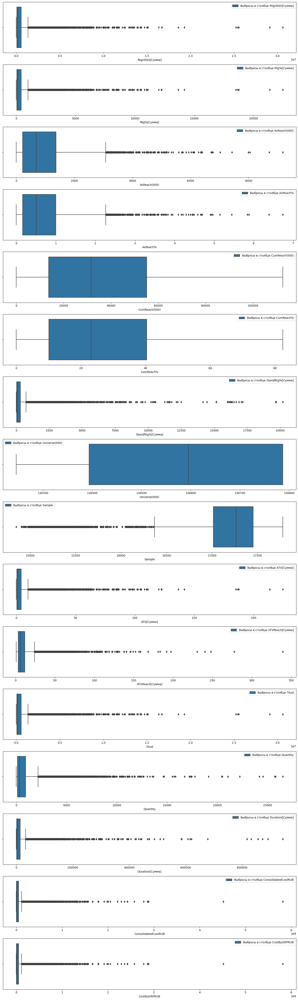

In [7]:
fig, axs = plt.subplots(16, 1, figsize=(15, 50), sharey=False)

columns = ["Rtg(000)[Сумма]",
    "Rtg%[Сумма]",
    "AvReach(000)",
    "AvReach%",
    "CumReach(000)",
    "CumReach%",
    "StandRtg%[Сумма]",
    "Universe(000)",
    "Sample",
    "ATV[Сумма]",
    "ATVReach[Сумма]",
    "TAud",
    "Quantity",
    "Duration[Сумма]",
    "ConsolidatedCostRUB",
    "CostByGRPRUB"]

for i, col in enumerate(columns):
    sns.boxplot(data=final_df1, x=col, ax=axs[i])
    axs[i].legend([f'Выбросы в столбце {col}'])

plt.tight_layout()
fig.savefig('graph2.png',dpi=300, bbox_inches='tight')
plt.show()

 В первую очередь заметим, что ящики несимметричны - усики имеют разную длину, что указывает на наличие выбросов и асимметрии в данных. Что можно еще заметить - это сильно сжатые ящики, что указывает, что в данных нет значительной вариации или разброса и дисперсия скорее всего низкая.Также, у нас есть достаточно много выбросов, так как ящик содержит точки за пределами усов, эчто говорит о наличии экстремальных значений в данных.

Чтобы избавиться от выбросов, которые исказят в будущем анализ и модель, мы будет использовать метод межквартильного размаха для переменных Rtg(000), Rtg(000)(Сумма), Rtg%[Сумма], AvReach(000), CumReach(000), StandRtg%[Сумма], ATV[Сумма], ATVReach[Сумма], Quantity, Duration[Сумма], ConsolidatedCostRUB, CostByGRPRUB[Сумма]:

1) Вычислим первый и третий квантиль для переменной с помощью функции quantile

2) Вычислим межквартильного размаха (IQR) путем вычитания первого квантиля из третьего

3) Определим нижнюю и верхнюю границы для определения выбросов, которые не входят в данный диапазон

In [8]:
columns_to_clean = ['Rtg(000)[Сумма]', 'Rtg(000)[Сумма]', 'Rtg%[Сумма]', 'AvReach(000)', 
    'CumReach(000)', 'StandRtg%[Сумма]', 'ATV[Сумма]', 'ATVReach[Сумма]', 
    'Quantity', 'Duration[Сумма]', 'ConsolidatedCostRUB', 'CostByGRPRUB']

final_df1_clean = final_df1.copy()
for column in columns_to_clean:
    q_1 = final_df1_clean[column].quantile(0.25)
    q_3 = final_df1_clean[column].quantile(0.75)
    IQR = q_3 - q_1
    low = q_1 - 1.5 * IQR
    up = q_3 + 1.5 * IQR
    
    final_df1_clean = final_df1_clean[(final_df1_clean[column] >= low) & (final_df1_clean[column] <= up)]

print(f"Исходный размер: {final_df1.shape}")
print(f"Новый размер: {final_df1_clean.shape}")
final_df1_clean.head()

Исходный размер: (19640, 19)
Новый размер: (9779, 19)


,Канал,Рекламодатель,Rtg(000)[Сумма],Rtg%[Сумма],AvReach(000),AvReach%,CumReach(000),CumReach%,StandRtg%[Сумма],Universe(000),Sample,ATV[Сумма],ATVReach[Сумма],TAud,Quantity,Duration[Сумма],ConsolidatedCostRUB,CostByGRPRUB,Период
1521,СПАС (СЕТЕВОЕ ВЕЩАНИЕ),ПОМОГАТЬ ЛЕГКО (БЛАГОТВОРИТЕЛЬНЫЙ ФОНД),8403.14420,6.16094,83.19945,0.06100,5294.09779,3.88148,6.16094,136393.79300,15726.88000,0.06161,1.58727,8403.14420,101,2020,2.294100e+05,2.294100e+05,1 полугодие 2020
1520,СПАС (СЕТЕВОЕ ВЕЩАНИЕ),ПОДАРОК АНГЕЛУ,14464.16612,10.60471,160.71296,0.11783,7916.07004,5.80383,8.50971,136393.79302,15586.63333,0.10605,1.82719,14464.16612,90,1390,3.947231e+05,3.947231e+05,1 полугодие 2020
1519,СПАС (СЕТЕВОЕ ВЕЩАНИЕ),МИР ГЛАЗАМИ РЕБЕНКА (БЛАГОТВОРИТЕЛЬНЫЙ ФОНД),36473.41251,26.74126,120.37430,0.08825,15788.08975,11.57537,33.54565,136393.79300,15386.75926,0.26741,2.31019,36473.41251,303,7715,1.216291e+06,1.216291e+06,1 полугодие 2020
1518,СПАС (СЕТЕВОЕ ВЕЩАНИЕ),КИДБУРГ,679.56781,0.49824,16.18019,0.01186,516.63755,0.37878,0.00000,136393.79299,15682.74194,0.00498,1.31537,679.56781,42,0,0.000000e+00,0.000000e+00,1 полугодие 2020
1517,СПАС (СЕТЕВОЕ ВЕЩАНИЕ),ДОБРЫЙ ДОМ (ФОНД),27895.87120,20.45245,127.37841,0.09339,13875.16530,10.17287,30.67867,136393.79300,15571.71831,0.20452,2.01049,27895.87120,219,6279,1.194137e+06,1.194137e+06,1 полугодие 2020


Посмотрим, что получилось:

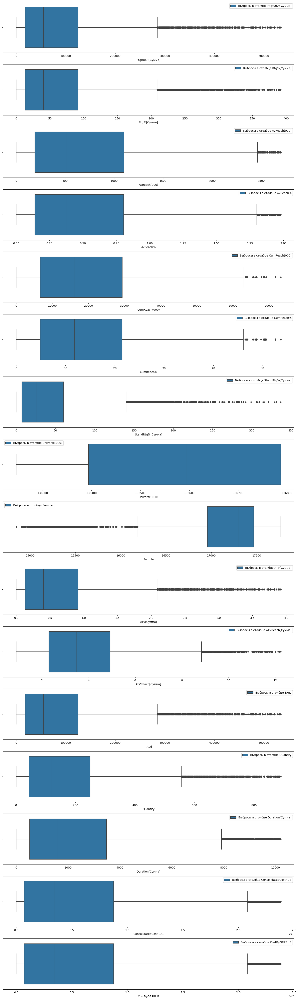

In [9]:
fig, axs = plt.subplots(16, 1, figsize=(15, 50), sharey=False)

columns = ["Rtg(000)[Сумма]",
    "Rtg%[Сумма]",
    "AvReach(000)",
    "AvReach%",
    "CumReach(000)",
    "CumReach%",
    "StandRtg%[Сумма]",
    "Universe(000)",
    "Sample",
    "ATV[Сумма]",
    "ATVReach[Сумма]",
    "TAud",
    "Quantity",
    "Duration[Сумма]",
    "ConsolidatedCostRUB",
    "CostByGRPRUB"]

for i, col in enumerate(columns):
    sns.boxplot(data=final_df1_clean, x=col, ax=axs[i])
    axs[i].legend([f'Выбросы в столбце {col}'])

plt.tight_layout()
fig.savefig('graph3.png',dpi=300, bbox_inches='tight')
plt.show()

Ящики стали менее сжатые и менее сжатые и выбросов за их пределами меньше. В целом, метод межквартильного размаха улучшил ситуацию.

## Визуализация

Посмотрим на распределения средних для каждого временного промежутка, канала и рекламодателя.

In [10]:
df_p = final_df1_clean.copy()
del df_p['Канал']
del df_p['Рекламодатель']
def country_means(df):
     return df.groupby("Период").mean()
df_period = country_means(df_p)
df_period.head()

C:\Users\proho\AppData\Local\Temp\ipykernel_15692\3307588104.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return df.groupby("Период").mean()


,Rtg(000)[Сумма],Rtg%[Сумма],AvReach(000),AvReach%,CumReach(000),CumReach%,StandRtg%[Сумма],Universe(000),Sample,ATV[Сумма],ATVReach[Сумма],TAud,Quantity,Duration[Сумма],ConsolidatedCostRUB,CostByGRPRUB
Период,,,,,,,,,,,,,,,,
1 полугодие 2020,104647.980943,76.724885,813.984365,0.596790,22704.659237,16.646402,53.154457,136393.793002,15351.582536,0.767249,3.916634,104647.980943,185.733837,2625.146935,5.699703e+06,5.699703e+06
2 полугодие 2020,92369.443028,67.722615,755.739323,0.554086,20062.905556,14.709545,44.533135,136393.793000,17004.805867,0.677226,3.792671,92369.443028,172.400495,2335.203138,5.624645e+06,5.624645e+06
1 полугодие 2021,92595.873182,67.693362,738.341509,0.539774,20059.870596,14.665017,45.255482,136787.228015,17303.973641,0.676934,3.811347,92595.873182,173.337096,2408.684725,5.053287e+06,5.053287e+06
2 полугодие 2021,86169.469026,62.995259,706.127345,0.516223,18609.426144,13.604652,40.617633,136787.228001,17065.988417,0.629953,3.861006,86169.469026,175.107383,2327.381805,5.491285e+06,5.491285e+06
1 полугодие 2022,85923.339854,62.903692,731.465930,0.535499,18991.688043,13.903641,41.979080,136595.065986,17452.179018,0.629037,3.722546,85923.339854,164.905646,2220.106729,5.381955e+06,5.381955e+06


In [11]:
df_с = final_df1_clean.copy()
del df_с['Период']
del df_с['Рекламодатель']
def country_means(df):
     return df.groupby("Канал").mean()
df_channel = country_means(df_с)
df_channel.head()

,Rtg(000)[Сумма],Rtg%[Сумма],AvReach(000),AvReach%,CumReach(000),CumReach%,StandRtg%[Сумма],Universe(000),Sample,ATV[Сумма],ATVReach[Сумма],TAud,Quantity,Duration[Сумма],ConsolidatedCostRUB,CostByGRPRUB
Канал,,,,,,,,,,,,,,,,
2X2 (СЕТЕВОЕ ВЕЩАНИЕ),15213.892195,11.142085,64.829175,0.047474,3355.265784,2.457333,8.276507,136548.036363,16988.872339,0.111421,3.790445,15213.892195,243.153005,3537.393443,9.688283e+05,9.688283e+05
ДЕТСКИЙ РЕКЛАМНЫЙ КАНАЛ (СЕТЕВОЕ ВЕЩАНИЕ),23909.014753,17.512601,94.990015,0.069598,4454.883142,3.263380,13.090214,136499.524933,17057.858715,0.175126,4.649505,23909.014753,255.933333,3796.888889,1.502459e+06,1.502459e+06
ДОМ КИНО (СЕТЕВОЕ ВЕЩАНИЕ),64297.224479,47.098034,283.917839,0.207971,13747.596491,10.070268,32.888194,136512.717007,17004.883211,0.470980,3.943232,64297.224479,234.733456,3231.375000,1.540351e+06,1.540351e+06
ДОМАШНИЙ (СЕТЕВОЕ ВЕЩАНИЕ),151801.549252,111.203975,1272.161018,0.931948,24219.417891,17.741893,72.117437,136509.434095,17073.391926,1.112040,5.425171,151801.549252,124.039370,1635.262467,8.154125e+06,8.154125e+06
ЕДИНЫЙ РЕКЛАМНЫЙ КАНАЛ (СЕТЕВОЕ ВЕЩАНИЕ),126447.766983,92.611329,2082.207667,1.525073,36750.785022,26.917452,59.947001,136525.922484,16911.444677,0.926114,3.182912,126447.766983,61.812500,806.458333,1.331131e+07,1.331131e+07


In [12]:
df_a = final_df1_clean.copy()
del df_a['Период']
del df_a["Канал"]
def country_means(df):
     return df.groupby("Рекламодатель").mean()
df_advertiser = country_means(df_a)
df_advertiser.head()

,Rtg(000)[Сумма],Rtg%[Сумма],AvReach(000),AvReach%,CumReach(000),CumReach%,StandRtg%[Сумма],Universe(000),Sample,ATV[Сумма],ATVReach[Сумма],TAud,Quantity,Duration[Сумма],ConsolidatedCostRUB,CostByGRPRUB
Рекламодатель,,,,,,,,,,,,,,,,
1С,15646.763715,11.462889,913.797037,0.669455,8370.345890,6.131974,8.597166,136505.496252,17220.197155,0.114629,1.706282,15646.763715,20.583333,308.750000,8.727876e+05,8.727876e+05
7 ДНЕЙ,38689.794070,28.306541,693.004373,0.507324,9722.823228,7.116873,5.966575,136566.871497,16723.734912,0.283064,3.121261,38689.794070,61.928571,511.071429,1.839903e+06,1.839903e+06
? РЕКЛАМОДАТЕЛЬ СОЦИАЛЬНОЙ РЕКЛАМЫ,23738.385610,17.378569,535.889042,0.392228,9211.832126,6.743698,43.563893,136567.379843,16898.531508,0.173785,1.987960,23738.385610,60.190476,2602.166667,3.912591e+06,3.912591e+06
A&D,59032.256120,43.254321,869.377578,0.637009,18848.934932,13.810316,21.082334,136455.540427,17245.287447,0.432543,3.056021,59032.256120,90.285714,824.040816,1.563892e+06,1.563892e+06
AB INBEV EFES,7434.823512,5.451244,703.478592,0.515892,3561.233767,2.611142,4.507828,136382.416443,16042.350428,0.054512,1.924978,7434.823512,18.846154,319.923077,6.596525e+05,6.596525e+05


Сделаем тепловую карту корреляций, чтобы понять, какие переменные больше коррелируют друг с другом.

<function matplotlib.pyplot.show(close=None, block=None)>

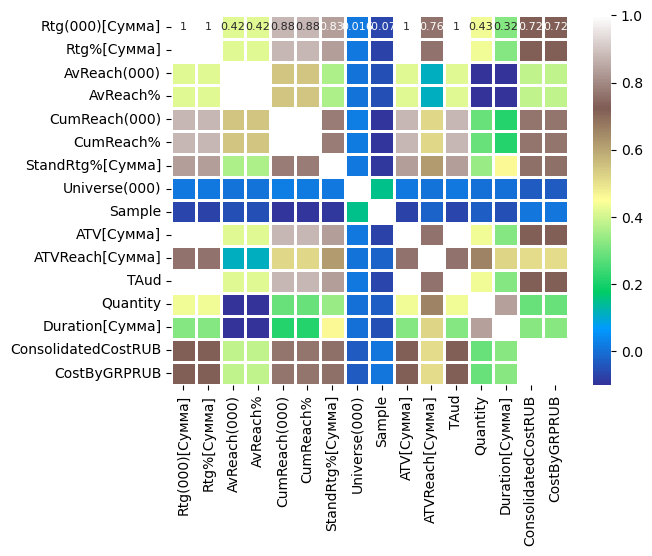

In [13]:
corr = final_df1_clean[num_columns].corr()
sns.heatmap(corr, annot = True, linecolor = 'white', linewidth = 2, vmax = 0, vmin = 1, cmap = 'terrain', annot_kws={"size":8})
plt.savefig('graph4.png',dpi=300, bbox_inches='tight')
plt.show

**Сильные положительные корреляции (≥ 0.8):**
- Rtg(000)[Сумма] и Rtg%[Сумма]
- AvReach(000) и  AvReach% 
- CumReach(000) и CumReach%
- ATV[Сумма] и ATVReach[Сумма] 
- ConsolidatedCostRUB и CostByGRPRUB

Общая стоимость и стоимость на GRP - обе финансовые метрики, зависящие от масштаба. Остальные переменные, имеющие сильные корреляциями, являются разными формами одного и того же показателя кампании.

**Умеренные положительные корреляции:**
- Sample и Universe(000) 
- Quantity и Duration[Сумма] 
- TAud ↔ ATVReach[Сумма] 
- StandRtg%[Сумма] и Universe(000)
  
**Низкие или отсутствующие корреляции (< 0.3)**
- Sample и CostByGRPRUB 
- Duration[Сумма] и ConsolidatedCostRUB 
- Quantity и CostByGRPRUB

Можно сделать вывод о том, что некоторые переменные с сильной корреляцией дублируют друг друга. Следовательно, при построении моделей можно использовать только одну из них, чтобы избежать мультиколлинеарности.
Финансовые метрики (CostByGRPRUB, ConsolidatedCostRUB) слабо связаны сдругими  показатеями (сильная корреляция только друг с другом)м. Это говорит о том, что стоимость рекламы зависит от внешних факторов (например, цены на эфир), а не от внутренней структуры кампании (количество роликов, длительнось).).

Также более подробно рассмотрим категориальные перменные:

C:\Users\proho\anaconda3\an\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


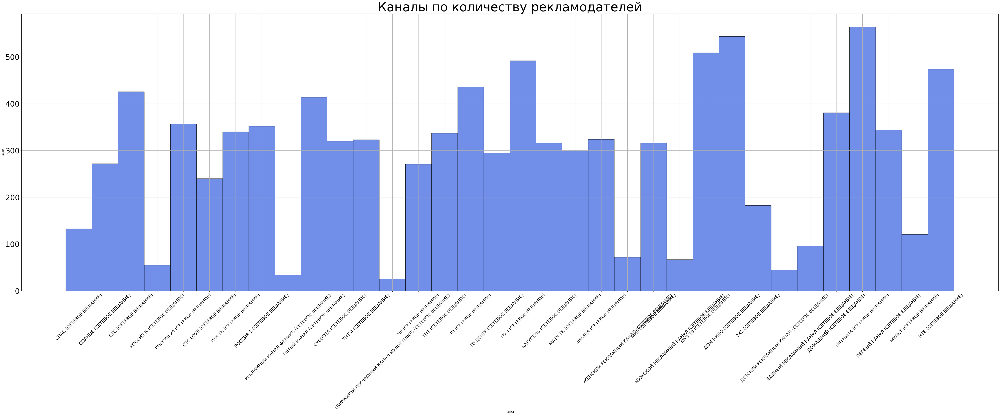

In [14]:
plt.figure(figsize=(70, 20))
final_df1_clean['Канал'].value_counts()
sns.histplot(data = final_df1_clean, x = 'Канал', color = 'royalblue')
plt.xticks(rotation=45, fontsize = 18)
plt.yticks(fontsize=30)
plt.grid(True)
plt.title('Каналы по количеству рекламодателей', fontsize=50)
plt.savefig('graph5.png',dpi=300, bbox_inches='tight')
plt.show()

In [15]:
plt.figure(figsize=(300,30))
final_df1_clean['Рекламодатель'].value_counts()
sns.histplot(data = final_df1_clean, x = 'Рекламодатель', color = 'royalblue')
plt.xticks(rotation=45)
plt.grid(True)
plt.title('Рекламодатели по популярности', fontsize=150)
plt.savefig('graph6.png',dpi=150, bbox_inches='tight')
plt.show()

C:\Users\proho\anaconda3\an\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


## Описательная статистика 

C:\Users\proho\AppData\Local\Temp\ipykernel_15692\1852554324.py:5: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  desc_stats_formatted = desc_stats.applymap(format_num)


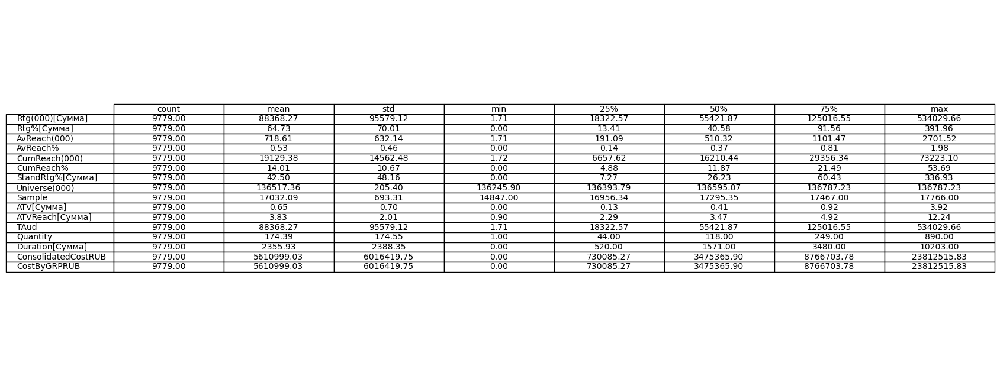

In [16]:
desc_stats = final_df1_clean[num_columns].describe().T
def format_num(x):
        return f"{x:.2f}" if not pd.isna(x) else ""

desc_stats_formatted = desc_stats.applymap(format_num)

fig, ax = plt.subplots(figsize=(12, 8))
ax.axis('off') 
table = pd.plotting.table(ax, desc_stats_formatted, 
                         loc='center', 
                         cellLoc='center',
                         colWidths=[0.2] * len(desc_stats_formatted.columns))
plt.savefig('graph7.png', 
           dpi=300, 
           bbox_inches='tight', 
           facecolor='white')

## Гипотезы и обучение моделей

Также добавим переменную, контролирующую тип рекламодателя - зарубежный или русский. Так как общее число рекламодателей составляет около 2800 (то есть анализ каждого рекламодателя вручную был невозможен), было принято решение относить тех рекламодателей, чье название написано на русском языке - к русским, а тех, кто на английском, соответственно к иностранным. Конечно такой подход содержит некоторые недостатки, так как существуют рекламодатели, название которых содержит в своем названии и русский и английский алфавит, поэтому они были проанализированы вручную и определены в нужную колонку. Таким образом, получается бинарная переменная, где 1 - русские рекламодатели, 0 - зарубежные.

In [17]:
import re
def detect(advertiser_name):
    
    name = str(advertiser_name)
    
    clean_name = re.sub(r'[0-9\s\W_]', '', name)
    
    has_russian = bool(re.search('[а-яА-ЯёЁ]', clean_name))
    
    has_english = bool(re.search('[a-zA-Z]', clean_name))
    
    if has_russian and not has_english:
        return "russian"
    elif has_english and not has_russian:
        return "foreign"
    else:
        return "unknown"

def advertiser_type_column(df, advertiser_column='Рекламодатель'):
   
    df['Advertiser_type'] = df[advertiser_column].apply(detect)
    
    return df

final_df1_clean = advertiser_type_column(final_df1_clean, 'Рекламодатель')
final_df1_clean['Advertiser_type']

1521     russian
1520     russian
1519     russian
1518     russian
1517     russian
          ...   
18001    russian
18002    russian
18007    russian
18000    russian
19640    russian
Name: Advertiser_type, Length: 9779, dtype: object

In [18]:
final_df1_clean[final_df1_clean['Advertiser_type'] == 'unknown']['Рекламодатель'].unique()

array(['SOKOLOV (ЮВЕЛИРНЫЕ УКРАШЕНИЯ)', 'СРАВНИ.RU',
       'PRODВИЖЕНИЕ (ФИРМА)', 'ЗЕЛЕНАЯ ДУБРАВА (ZD)',
       'COTTON CLUB (ГРУППА КОМПАНИЙ)'], dtype=object)

In [19]:
unknown_to_russian = ['SOKOLOV (ЮВЕЛИРНЫЕ УКРАШЕНИЯ)',
    'СРАВНИ.RU',
    'PRODВИЖЕНИЕ (ФИРМА)',
    'ЗЕЛЕНАЯ ДУБРАВА (ZD)',
    'COTTON CLUB (ГРУППА КОМПАНИЙ)']

mask = final_df1_clean['Рекламодатель'].isin(unknown_to_russian)
final_df1_clean.loc[mask, 'Advertiser_type'] = 'russian'
final_df1_clean[final_df1_clean['Advertiser_type'] != 'unknown']
final_df1_clean['Advertiser_type'] = (final_df1_clean['Advertiser_type'] == 'russian').astype(int)
final_df1_clean['Advertiser_type'].value_counts()

Advertiser_type
1    6466
0    3313
Name: count, dtype: int64

В начале попробуем построить модели на полным данных, а в дальнешйем - на агрегированных. И в конце сравним результаты.

In [20]:
df_new = final_df1_clean.copy(deep = True)
        
df_new['ln_CostByGRP'] = np.log(df_new['CostByGRPRUB'])
df_new['ln_ATV'] = np.log(df_new['ATV[Сумма]'])
df_new['ln_ATVReach[Сумма]'] = np.log(df_new['ATVReach[Сумма]'])
df_new['ln_RTG'] = np.log(df_new['Rtg%[Сумма]'])
df_new['ln_AvReach'] = np.log(df_new['AvReach%'])
df_new.head()

C:\Users\proho\anaconda3\an\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


,Канал,Рекламодатель,Rtg(000)[Сумма],Rtg%[Сумма],AvReach(000),AvReach%,CumReach(000),CumReach%,StandRtg%[Сумма],Universe(000),...,Duration[Сумма],ConsolidatedCostRUB,CostByGRPRUB,Период,Advertiser_type,ln_CostByGRP,ln_ATV,ln_ATVReach[Сумма],ln_RTG,ln_AvReach
1521,СПАС (СЕТЕВОЕ ВЕЩАНИЕ),ПОМОГАТЬ ЛЕГКО (БЛАГОТВОРИТЕЛЬНЫЙ ФОНД),8403.14420,6.16094,83.19945,0.06100,5294.09779,3.88148,6.16094,136393.79300,...,2020,2.294100e+05,2.294100e+05,1 полугодие 2020,1,12.343266,-2.786931,0.462016,1.818229,-2.796881
1520,СПАС (СЕТЕВОЕ ВЕЩАНИЕ),ПОДАРОК АНГЕЛУ,14464.16612,10.60471,160.71296,0.11783,7916.07004,5.80383,8.50971,136393.79302,...,1390,3.947231e+05,3.947231e+05,1 полугодие 2020,1,12.885940,-2.243845,0.602779,2.361298,-2.138512
1519,СПАС (СЕТЕВОЕ ВЕЩАНИЕ),МИР ГЛАЗАМИ РЕБЕНКА (БЛАГОТВОРИТЕЛЬНЫЙ ФОНД),36473.41251,26.74126,120.37430,0.08825,15788.08975,11.57537,33.54565,136393.79300,...,7715,1.216291e+06,1.216291e+06,1 полугодие 2020,1,14.011316,-1.318972,0.837330,3.286208,-2.427582
1518,СПАС (СЕТЕВОЕ ВЕЩАНИЕ),КИДБУРГ,679.56781,0.49824,16.18019,0.01186,516.63755,0.37878,0.00000,136393.79299,...,0,0.000000e+00,0.000000e+00,1 полугодие 2020,1,-inf,-5.302325,0.274118,-0.696673,-4.434584
1517,СПАС (СЕТЕВОЕ ВЕЩАНИЕ),ДОБРЫЙ ДОМ (ФОНД),27895.87120,20.45245,127.37841,0.09339,13875.16530,10.17287,30.67867,136393.79300,...,6279,1.194137e+06,1.194137e+06,1 полугодие 2020,1,13.992935,-1.587090,0.698378,3.018103,-2.370971


In [21]:
(df_new['ln_CostByGRP'] == -np.inf).sum()
df_new = df_new[df_new['ln_CostByGRP'] != -np.inf]
df_new.head()

,Канал,Рекламодатель,Rtg(000)[Сумма],Rtg%[Сумма],AvReach(000),AvReach%,CumReach(000),CumReach%,StandRtg%[Сумма],Universe(000),...,Duration[Сумма],ConsolidatedCostRUB,CostByGRPRUB,Период,Advertiser_type,ln_CostByGRP,ln_ATV,ln_ATVReach[Сумма],ln_RTG,ln_AvReach
1521,СПАС (СЕТЕВОЕ ВЕЩАНИЕ),ПОМОГАТЬ ЛЕГКО (БЛАГОТВОРИТЕЛЬНЫЙ ФОНД),8403.14420,6.16094,83.19945,0.06100,5294.09779,3.88148,6.16094,136393.79300,...,2020,2.294100e+05,2.294100e+05,1 полугодие 2020,1,12.343266,-2.786931,0.462016,1.818229,-2.796881
1520,СПАС (СЕТЕВОЕ ВЕЩАНИЕ),ПОДАРОК АНГЕЛУ,14464.16612,10.60471,160.71296,0.11783,7916.07004,5.80383,8.50971,136393.79302,...,1390,3.947231e+05,3.947231e+05,1 полугодие 2020,1,12.885940,-2.243845,0.602779,2.361298,-2.138512
1519,СПАС (СЕТЕВОЕ ВЕЩАНИЕ),МИР ГЛАЗАМИ РЕБЕНКА (БЛАГОТВОРИТЕЛЬНЫЙ ФОНД),36473.41251,26.74126,120.37430,0.08825,15788.08975,11.57537,33.54565,136393.79300,...,7715,1.216291e+06,1.216291e+06,1 полугодие 2020,1,14.011316,-1.318972,0.837330,3.286208,-2.427582
1517,СПАС (СЕТЕВОЕ ВЕЩАНИЕ),ДОБРЫЙ ДОМ (ФОНД),27895.87120,20.45245,127.37841,0.09339,13875.16530,10.17287,30.67867,136393.79300,...,6279,1.194137e+06,1.194137e+06,1 полугодие 2020,1,13.992935,-1.587090,0.698378,3.018103,-2.370971
1516,СПАС (СЕТЕВОЕ ВЕЩАНИЕ),ДИОД,19869.05373,14.56742,127.36573,0.09338,6082.47882,4.45950,7.28371,136393.79301,...,1559,3.537894e+05,3.537894e+05,1 полугодие 2020,1,12.776457,-1.926411,1.183750,2.678788,-2.371078


In [22]:
def period_to_middate(period):
    parts = period.split()
    half = int(parts[0])
    year = int(parts[-1])
    if half == 1:
        return pd.to_datetime(f"{year}-06-30")
    else:
        return pd.to_datetime(f"{year}-12-31")

df_new['Дата'] = df_new['Период'].apply(period_to_middate)
df_new = df_new.sort_values('Дата').reset_index(drop=True)
df_new['Time'] = np.arange(1, len(df_new) + 1) 

df_new['HalfYear_1'] = (df_new['Дата'].dt.month == 6).astype(int)  
df_new['COVID_dummy'] = df_new['Дата'].dt.year.isin([2020, 2021]).astype(int)

Добавим коэффициент InternetPenetrationt. Однако данные у нас есть только по годам, поэтому необоходимо сделать линейную интерполяцию по каждому полугодию.

In [23]:
df_internet = pd.read_excel('internet.xlsx')
df_internet

,Наименование показателя,2020,2021,2022,2023
0,"Доля домашних хозяйств, имеющих доступ к сети ...",80,84,86.6,87.9


In [24]:
yearly_data_internet = {
    2020: df_internet[2020].iloc[0],
    2021: df_internet[2021].iloc[0],
    2022: df_internet[2022].iloc[0],
    2023: df_internet[2023].iloc[0]
}

def interpolate_internet(date_obj):
    year = date_obj.year
    month = date_obj.month
    half = 1 if month <= 6 else 2
    
    try:
        if year == 2020:
            if half == 1:
                return yearly_data_internet[2020] + 0.5 * (yearly_data_internet[2021] - yearly_data_internet[2020])
            else:
                return yearly_data_internet[2021]
        elif year == 2021:
            if half == 1:
                return yearly_data_internet[2021] + 0.5 * (yearly_data_internet[2022] - yearly_data_internet[2021])
            else:
                return yearly_data_internet[2022]
        elif year == 2022:
            if half == 1:
                return yearly_data_internet[2022] + 0.5 * (yearly_data_internet[2023] - yearly_data_internet[2022])
            else:
                return yearly_data_internet[2023]
        elif year == 2023:
            return yearly_data_internet[2023]
    except Exception:
        return None

df_new['InternetPenetration'] = df_new['Дата'].apply(interpolate_internet)
df_new['ln_InternetPenetration'] = np.log(df_new['InternetPenetration'])
df_new.head()

,Канал,Рекламодатель,Rtg(000)[Сумма],Rtg%[Сумма],AvReach(000),AvReach%,CumReach(000),CumReach%,StandRtg%[Сумма],Universe(000),...,ln_ATV,ln_ATVReach[Сумма],ln_RTG,ln_AvReach,Дата,Time,HalfYear_1,COVID_dummy,InternetPenetration,ln_InternetPenetration
0,СПАС (СЕТЕВОЕ ВЕЩАНИЕ),ПОМОГАТЬ ЛЕГКО (БЛАГОТВОРИТЕЛЬНЫЙ ФОНД),8403.14420,6.16094,83.19945,0.06100,5294.09779,3.88148,6.16094,136393.79300,...,-2.786931,0.462016,1.818229,-2.796881,2020-06-30,1,1,1,82.0,4.406719
1,2X2 (СЕТЕВОЕ ВЕЩАНИЕ),ЕВРОПЕЙСКАЯ МЕДИАГРУППА,10891.36400,7.98523,113.45171,0.08318,3123.15882,2.28981,7.98523,136393.79303,...,-2.527605,1.249125,2.077594,-2.486748,2020-06-30,2,1,1,82.0,4.406719
2,2X2 (СЕТЕВОЕ ВЕЩАНИЕ),БЕССМЕРТНЫЙ ПОЛК РОССИИ,2827.86465,2.07331,91.22144,0.06688,1463.36403,1.07290,4.14662,136393.79306,...,-3.876173,0.658783,0.729146,-2.704855,2020-06-30,3,1,1,82.0,4.406719
3,2X2 (СЕТЕВОЕ ВЕЩАНИЕ),АЛЬКОР И К,26297.39961,19.28050,95.28043,0.06986,4905.17252,3.59633,18.15966,136393.79301,...,-1.646102,1.679180,2.959094,-2.661262,2020-06-30,4,1,1,82.0,4.406719
4,2X2 (СЕТЕВОЕ ВЕЩАНИЕ),АКВАЛАЙФ (ВОДА),24954.81361,18.29615,68.93595,0.05054,4239.38721,3.10820,9.14808,136393.79299,...,-1.698488,1.772648,2.906691,-2.984990,2020-06-30,5,1,1,82.0,4.406719


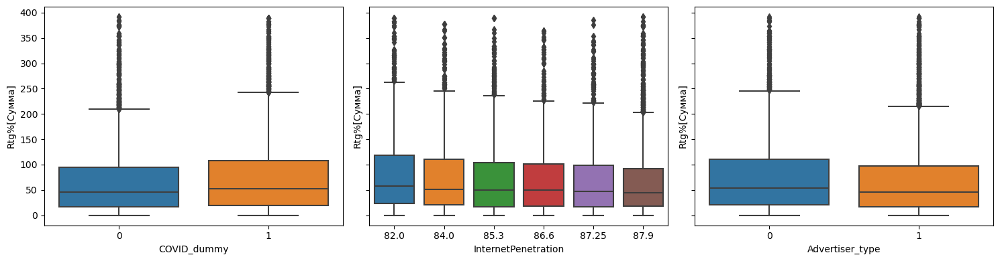

In [25]:
fig, axs = plt.subplots(1, 3, figsize=(15, 4), sharey=True)

sns.boxplot(x='COVID_dummy', y='Rtg%[Сумма]', data=df_new, ax=axs[0])
sns.boxplot(x='InternetPenetration', y='Rtg%[Сумма]', data=df_new, ax=axs[1])
sns.boxplot(x='Advertiser_type', y='Rtg%[Сумма]', data = df_new, ax=axs[2])

plt.tight_layout()
plt.savefig('graph8.png', dpi=300, bbox_inches='tight')
plt.show()

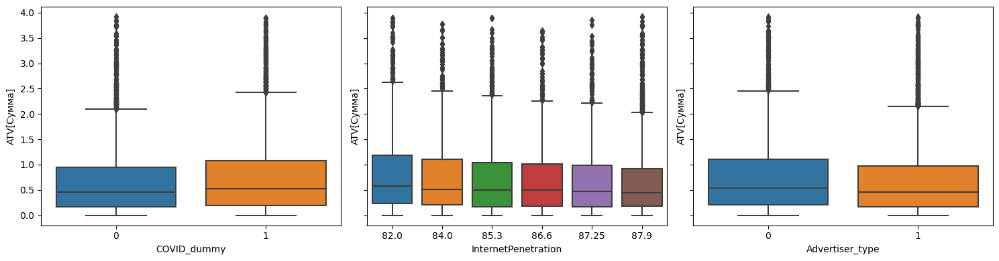

In [26]:
fig, axs = plt.subplots(1, 3, figsize=(15, 4), sharey=True)

sns.boxplot(x='COVID_dummy', y='ATV[Сумма]', data=df_new, ax=axs[0])
sns.boxplot(x='InternetPenetration', y='ATV[Сумма]', data=df_new, ax=axs[1])
sns.boxplot(x='Advertiser_type', y='ATV[Сумма]', data=df_new, ax=axs[2])

plt.tight_layout()
plt.savefig('graph9.png', dpi=300, bbox_inches='tight')
plt.show()

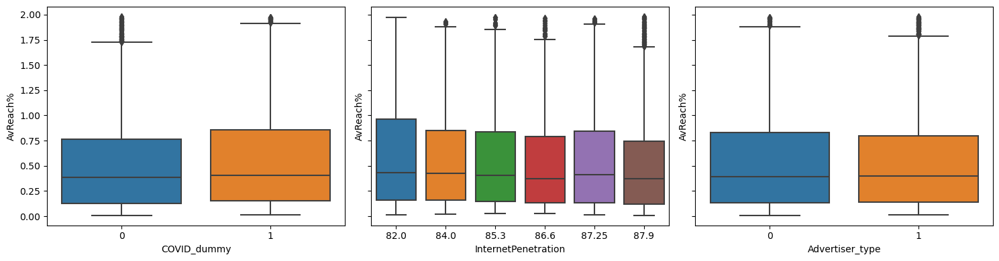

In [27]:
fig, axs = plt.subplots(1, 3, figsize=(15, 4), sharey=True)

sns.boxplot(x='COVID_dummy', y='AvReach%', data=df_new, ax=axs[0])
sns.boxplot(x='InternetPenetration', y='AvReach%', data=df_new, ax=axs[1])
sns.boxplot(x='Advertiser_type', y='AvReach%', data=df_new, ax=axs[2])

plt.tight_layout()
plt.savefig('graph10.png', dpi=300, bbox_inches='tight')
plt.show()

**H1(a)**

In [28]:
Y = df_new['ln_RTG']
X = df_new[['Time', 'HalfYear_1', 'COVID_dummy', 'ln_InternetPenetration','Advertiser_type']]
X = sm.add_constant(X)
model = sm.OLS(Y,X)
res = model.fit(cov_type='HAC', cov_kwds={'maxlags': 10})
print (res.summary())
coef = res.params['Time']
pval = res.pvalues['Time']
int = res.conf_int().loc['Time']
print(f"Коэффициент при Time: {coef:.4f}")
print(f"p-value: {pval:.4f}")
print(f"95% доверительный интервал: [{int[0]:.4f}, {int[1]:.4f}]")
alpha = 0.10
if coef < 0 and pval < alpha:
        print(f"\n Гипотеза подтверждена")
else:
        print(f"\n Гипотеза не подтверждена")

                            OLS Regression Results                            
Dep. Variable:                 ln_RTG   R-squared:                       0.011
Model:                            OLS   Adj. R-squared:                  0.010
Method:                 Least Squares   F-statistic:                     9.759
Date:                Mon, 11 May 2026   Prob (F-statistic):           2.60e-09
Time:                        13:38:05   Log-Likelihood:                -14424.
No. Observations:                8402   AIC:                         2.886e+04
Df Residuals:                    8396   BIC:                         2.890e+04
Df Model:                           5                                         
Covariance Type:                  HAC                                         
                             coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                    -14

In [29]:
from io import StringIO

summary_text = res.summary()

fig, ax = plt.subplots(figsize=(10, 6))
ax.axis('off') 
ax.text(0, 1, summary_text, fontsize=10, family='monospace', verticalalignment='top')

plt.savefig('graph11.png', bbox_inches='tight', dpi=300)
plt.close()

**H1(b)**

In [30]:
Y = df_new['ln_ATV']
X = df_new[['Time', 'HalfYear_1', 'COVID_dummy', 'ln_InternetPenetration','Advertiser_type']]
X = sm.add_constant(X)
model = sm.OLS(Y,X)
res = model.fit(cov_type='HAC', cov_kwds={'maxlags': 10})
print (res.summary())
coef = res.params['Time']
pval = res.pvalues['Time']
int = res.conf_int().loc['Time']
print(f"Коэффициент при Time: {coef:.4f}")
print(f"p-value: {pval:.4f}")
print(f"95% доверительный интервал: [{int[0]:.4f}, {int[1]:.4f}]")
alpha = 0.10
if coef < 0 and pval < alpha:
        print(f"\n Гипотеза подтверждена")
else:
        print(f"\n Гипотеза не подтверждена")

                            OLS Regression Results                            
Dep. Variable:                 ln_ATV   R-squared:                       0.011
Model:                            OLS   Adj. R-squared:                  0.010
Method:                 Least Squares   F-statistic:                     9.759
Date:                Mon, 11 May 2026   Prob (F-statistic):           2.60e-09
Time:                        13:38:06   Log-Likelihood:                -14424.
No. Observations:                8402   AIC:                         2.886e+04
Df Residuals:                    8396   BIC:                         2.890e+04
Df Model:                           5                                         
Covariance Type:                  HAC                                         
                             coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                    -19

In [31]:
from io import StringIO

summary_text = res.summary()

fig, ax = plt.subplots(figsize=(10, 6))
ax.axis('off') 
ax.text(0, 1, summary_text, fontsize=10, family='monospace', verticalalignment='top')

plt.savefig('graph12.png', bbox_inches='tight', dpi=300)
plt.close()

**H1(C)**

In [32]:
Y = df_new['ln_AvReach']
X = df_new[['Time', 'HalfYear_1', 'COVID_dummy', 'ln_InternetPenetration','Advertiser_type']]
X = sm.add_constant(X)
model = sm.OLS(Y,X)
res = model.fit(cov_type='HAC', cov_kwds={'maxlags': 10})
print (res.summary())
coef = res.params['Time']
pval = res.pvalues['Time']
int = res.conf_int().loc['Time']
print(f"Коэффициент при Time: {coef:.4f}")
print(f"p-value: {pval:.4f}")
print(f"95% доверительный интервал: [{int[0]:.4f}, {int[1]:.4f}]")
alpha = 0.10
if coef < 0 and pval < alpha:
        print(f"\n Гипотеза подтверждена")
else:
        print(f"\n Гипотеза не подтверждена")

                            OLS Regression Results                            
Dep. Variable:             ln_AvReach   R-squared:                       0.016
Model:                            OLS   Adj. R-squared:                  0.015
Method:                 Least Squares   F-statistic:                     4.124
Date:                Mon, 11 May 2026   Prob (F-statistic):           0.000964
Time:                        13:38:08   Log-Likelihood:                -12414.
No. Observations:                8402   AIC:                         2.484e+04
Df Residuals:                    8396   BIC:                         2.488e+04
Df Model:                           5                                         
Covariance Type:                  HAC                                         
                             coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                    -31

In [33]:
from io import StringIO

summary_text = res.summary()

fig, ax = plt.subplots(figsize=(10, 6))
ax.axis('off') 
ax.text(0, 1, summary_text, fontsize=10, family='monospace', verticalalignment='top')

plt.savefig('graph13.png', bbox_inches='tight', dpi=300)
plt.close()

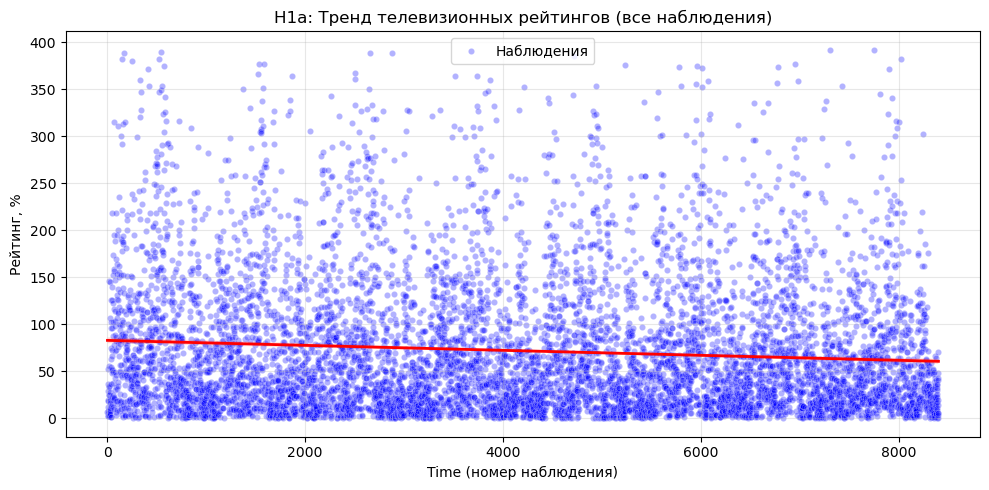

In [34]:
fig, axes = plt.subplots(1, 1, figsize=(10, 5))

ax1 = axes
sns.scatterplot(x='Time', y='Rtg%[Сумма]', data=df_new, alpha=0.3, s=20, ax=ax1, color='blue', label='Наблюдения')

sns.regplot(x='Time', y='Rtg%[Сумма]', data=df_new, scatter=False, ci=95, ax=ax1, line_kws={'color': 'red', 'lw': 2, 'label': 'Линейный тренд '})

ax1.set_title('H1a: Тренд телевизионных рейтингов (все наблюдения)', fontsize=12)
ax1.set_xlabel('Time (номер наблюдения)')
ax1.set_ylabel('Рейтинг, %')
ax1.legend()
ax1.grid(True, alpha=0.3)


plt.tight_layout()
plt.savefig('graph14.png', dpi=300, bbox_inches='tight')
plt.show()

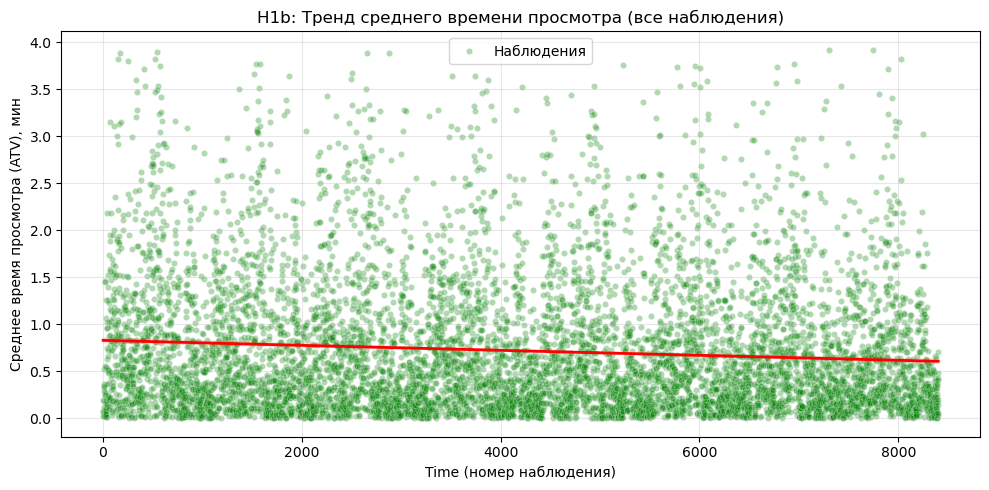

In [35]:
fig, axes = plt.subplots(1, 1, figsize=(10, 5))

ax1 = axes
sns.scatterplot(x='Time', y='ATV[Сумма]', data=df_new, alpha=0.3, s=20, ax=ax1, color='green', label='Наблюдения')

sns.regplot(x='Time', y='ATV[Сумма]', data=df_new, scatter=False, ci=95, ax=ax1, line_kws={'color': 'red', 'lw': 2, 'label': 'Линейный тренд'})

ax1.set_title('H1b: Тренд среднего времени просмотра (все наблюдения)', fontsize=12)
ax1.set_xlabel('Time (номер наблюдения)')
ax1.set_ylabel('Среднее время просмотра (ATV), мин')
ax1.legend()
ax1.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('graph15.png', dpi=300, bbox_inches='tight')
plt.show()

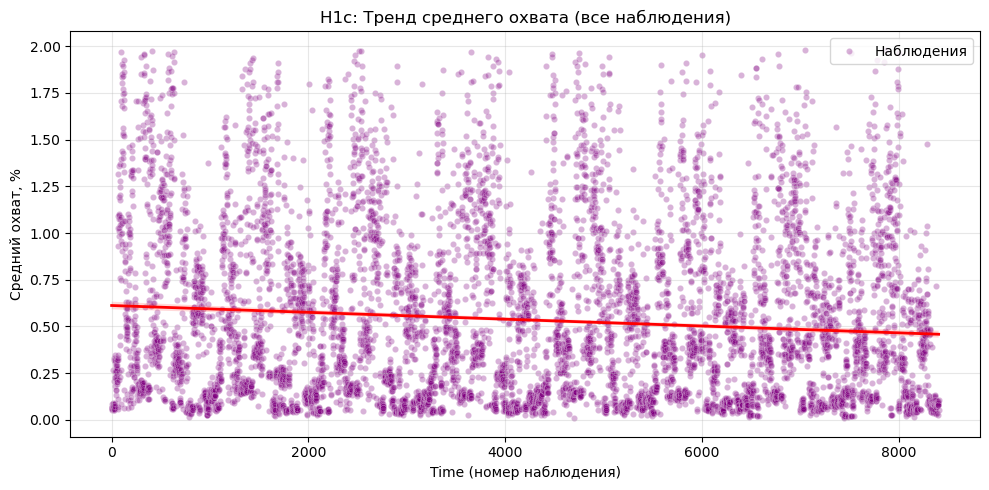

In [36]:
fig, axes = plt.subplots(1, 1, figsize=(10, 5))

ax1 = axes
sns.scatterplot(x='Time', y='AvReach%', data=df_new, alpha=0.3, s=20, ax=ax1, color='purple', label='Наблюдения')

sns.regplot(x='Time', y='AvReach%', data=df_new, scatter=False, ci=95, ax=ax1, line_kws={'color': 'red', 'lw': 2, 'label': 'Линейный тренд'})

ax1.set_title('H1c: Тренд среднего охвата (все наблюдения)', fontsize=12)
ax1.set_xlabel('Time (номер наблюдения)')
ax1.set_ylabel('Средний охват, %')
ax1.legend()
ax1.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('graph16.png', dpi=300, bbox_inches='tight')
plt.show()

**H2**

In [37]:
df_vvp = pd.read_excel('ВВП.xls')
df_vvp

,Наименования показателя,2020,2021,2022,2023
0,Валовой внутренний продукт текущих ценах (млрд...,107658.13103,134727.4674,157001.3938,174265.725757


In [38]:
df_new['Year'] = df_new['Период'].str[-4:]

gdp_dict = {'2020': df_vvp[2020].iloc[0],
    '2021': df_vvp[2021].iloc[0],
    '2022': df_vvp[2022].iloc[0],
    '2023': df_vvp[2023].iloc[0]}


df_new['GDP'] = df_new['Year'].map(gdp_dict)
df_new = df_new.drop(columns=['Year'])
df_new['ln_GDP'] = np.log(df_new['GDP'])

df_new.head()

,Канал,Рекламодатель,Rtg(000)[Сумма],Rtg%[Сумма],AvReach(000),AvReach%,CumReach(000),CumReach%,StandRtg%[Сумма],Universe(000),...,ln_RTG,ln_AvReach,Дата,Time,HalfYear_1,COVID_dummy,InternetPenetration,ln_InternetPenetration,GDP,ln_GDP
0,СПАС (СЕТЕВОЕ ВЕЩАНИЕ),ПОМОГАТЬ ЛЕГКО (БЛАГОТВОРИТЕЛЬНЫЙ ФОНД),8403.14420,6.16094,83.19945,0.06100,5294.09779,3.88148,6.16094,136393.79300,...,1.818229,-2.796881,2020-06-30,1,1,1,82.0,4.406719,107658.13103,11.586716
1,2X2 (СЕТЕВОЕ ВЕЩАНИЕ),ЕВРОПЕЙСКАЯ МЕДИАГРУППА,10891.36400,7.98523,113.45171,0.08318,3123.15882,2.28981,7.98523,136393.79303,...,2.077594,-2.486748,2020-06-30,2,1,1,82.0,4.406719,107658.13103,11.586716
2,2X2 (СЕТЕВОЕ ВЕЩАНИЕ),БЕССМЕРТНЫЙ ПОЛК РОССИИ,2827.86465,2.07331,91.22144,0.06688,1463.36403,1.07290,4.14662,136393.79306,...,0.729146,-2.704855,2020-06-30,3,1,1,82.0,4.406719,107658.13103,11.586716
3,2X2 (СЕТЕВОЕ ВЕЩАНИЕ),АЛЬКОР И К,26297.39961,19.28050,95.28043,0.06986,4905.17252,3.59633,18.15966,136393.79301,...,2.959094,-2.661262,2020-06-30,4,1,1,82.0,4.406719,107658.13103,11.586716
4,2X2 (СЕТЕВОЕ ВЕЩАНИЕ),АКВАЛАЙФ (ВОДА),24954.81361,18.29615,68.93595,0.05054,4239.38721,3.10820,9.14808,136393.79299,...,2.906691,-2.984990,2020-06-30,5,1,1,82.0,4.406719,107658.13103,11.586716


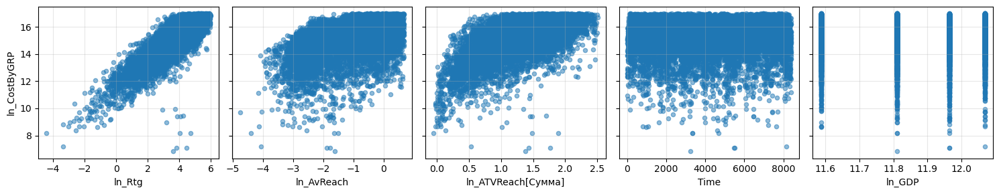

In [39]:
fig, axs = plt.subplots(1, 5, figsize=(15, 3), sharey=True)

axs[0].scatter(df_new['ln_RTG'], df_new['ln_CostByGRP'], alpha=0.5, s=20)
axs[0].set_xlabel('ln_Rtg')
axs[0].set_ylabel('ln_CostByGRP')
axs[0].grid(True, alpha=0.3)

axs[1].scatter(df_new['ln_AvReach'], df_new['ln_CostByGRP'], alpha=0.5, s=20)
axs[1].set_xlabel('ln_AvReach')
axs[1].grid(True, alpha=0.3)

axs[2].scatter(df_new['ln_ATVReach[Сумма]'], df_new['ln_CostByGRP'], alpha=0.5, s=20)
axs[2].set_xlabel('ln_ATVReach[Сумма]')
axs[2].grid(True, alpha=0.3)

axs[3].scatter(df_new['Time'], df_new['ln_CostByGRP'], alpha=0.5, s=20)
axs[3].set_xlabel('Time')
axs[3].grid(True, alpha=0.3)

axs[4].scatter(df_new['ln_GDP'], df_new['ln_CostByGRP'], alpha=0.5, s=20)
axs[4].set_xlabel('ln_GDP')
axs[4].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('graph17.png', dpi=300, bbox_inches='tight')
plt.show()

In [40]:
Y = df_new['ln_CostByGRP']
X = df_new[['ln_RTG', 'Time','ln_GDP','Advertiser_type']]
X = sm.add_constant(X)
model = sm.OLS(Y,X)
res = model.fit()
print (res.summary())
coef = res.params['Time']
pval = res.pvalues['Time']
int = res.conf_int().loc['Time']
print(f"Коэффициент при Time: {coef:.4f}")
print(f"p-value: {pval:.4f}")
print(f"95% доверительный интервал: [{int[0]:.4f}, {int[1]:.4f}]")
alpha = 0.10
if coef < 0 and pval < alpha:
        print(f"\n Гипотеза подтверждена")
else:
        print(f"\n Гипотеза не подтверждена")

                            OLS Regression Results                            
Dep. Variable:           ln_CostByGRP   R-squared:                       0.735
Model:                            OLS   Adj. R-squared:                  0.735
Method:                 Least Squares   F-statistic:                     5816.
Date:                Mon, 11 May 2026   Prob (F-statistic):               0.00
Time:                        13:38:25   Log-Likelihood:                -9131.8
No. Observations:                8402   AIC:                         1.827e+04
Df Residuals:                    8397   BIC:                         1.831e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const              29.8756      1.740     

In [41]:
from io import StringIO

summary_text = res.summary()

fig, ax = plt.subplots(figsize=(10, 6))
ax.axis('off') 
ax.text(0, 1, summary_text, fontsize=10, family='monospace', verticalalignment='top')

plt.savefig('graph18.png', bbox_inches='tight', dpi=300)
plt.close()

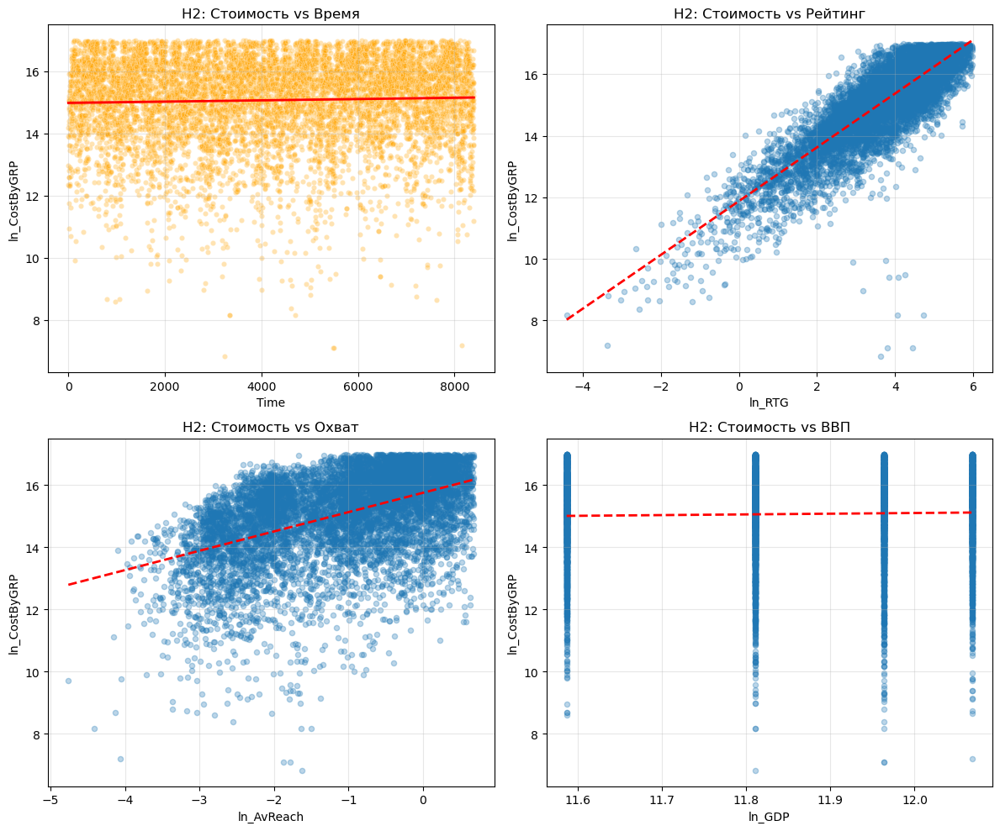

In [42]:
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

ax1 = axes[0, 0]
sns.scatterplot(x='Time', y='ln_CostByGRP', data=df_new, alpha=0.3, s=20, ax=ax1, color='orange')
sns.regplot(x='Time', y='ln_CostByGRP', data=df_new, scatter=False, ci=95, ax=ax1, line_kws={'color': 'red', 'lw': 2})
ax1.set_title('H2: Стоимость vs Время')
ax1.set_xlabel('Time')
ax1.set_ylabel('ln_CostByGRP')
ax1.grid(True, alpha=0.3)

ax2 = axes[0, 1]
ax2.scatter(df_new['ln_RTG'], df_new['ln_CostByGRP'], alpha=0.3, s=20)
z = np.polyfit(df_new['ln_RTG'], df_new['ln_CostByGRP'], 1)
p = np.poly1d(z)
x_range = np.linspace(df_new['ln_RTG'].min(), df_new['ln_RTG'].max(), 100)
ax2.plot(x_range, p(x_range), "r--", lw=2)
ax2.set_title('H2: Стоимость vs Рейтинг')
ax2.set_xlabel('ln_RTG')
ax2.set_ylabel('ln_CostByGRP')
ax2.grid(True, alpha=0.3)

ax3 = axes[1, 0]
ax3.scatter(df_new['ln_AvReach'], df_new['ln_CostByGRP'], alpha=0.3, s=20)
z = np.polyfit(df_new['ln_AvReach'], df_new['ln_CostByGRP'], 1)
p = np.poly1d(z)
x_range = np.linspace(df_new['ln_AvReach'].min(), df_new['ln_AvReach'].max(), 100)
ax3.plot(x_range, p(x_range), "r--", lw=2)
ax3.set_title('H2: Стоимость vs Охват')
ax3.set_xlabel('ln_AvReach')
ax3.set_ylabel('ln_CostByGRP')
ax3.grid(True, alpha=0.3)

ax4 = axes[1, 1]
ax4.scatter(df_new['ln_GDP'], df_new['ln_CostByGRP'], alpha=0.3, s=20)
z = np.polyfit(df_new['ln_GDP'], df_new['ln_CostByGRP'], 1)
p = np.poly1d(z)
x_range = np.linspace(df_new['ln_GDP'].min(), df_new['ln_GDP'].max(), 100)
ax4.plot(x_range, p(x_range), "r--", lw=2)
ax4.set_title('H2: Стоимость vs ВВП')
ax4.set_xlabel('ln_GDP')
ax4.set_ylabel('ln_CostByGRP')
ax4.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('graph19.png', dpi=300, bbox_inches='tight')
plt.show()

**H3** 

In [43]:
df_sales = pd.read_excel('доля продаж.xlsx')
df_sales

,Наименование показателя,2020,2021,2022,2023
0,Доля продаж через Интернет,3.9,5.1,6,8.1


In [44]:
yearly_data_2 = {2020: df_sales[2020].iloc[0],
    2021: df_sales[2021].iloc[0],
    2022: df_sales[2022].iloc[0],
    2023: df_sales[2023].iloc[0]}

def interpolate_sales(date_obj):
    year = date_obj.year
    month = date_obj.month
    half = 1 if month <= 6 else 2
    
    try:
        if year == 2020:
            if half == 1:
                return yearly_data_2[2020] + 0.5 * (yearly_data_2[2021] - yearly_data_2[2020])
            else:
                return yearly_data_2[2021]
        elif year == 2021:
            if half == 1:
                return yearly_data_2[2021] + 0.5 * (yearly_data_2[2022] - yearly_data_2[2021])
            else:
                return yearly_data_2[2022]
        elif year == 2022:
            if half == 1:
                return yearly_data_2[2022] + 0.5 * (yearly_data_2[2023] - yearly_data_2[2022])
            else:
                return yearly_data_2[2023]
        elif year == 2023:
            return yearly_data_2[2023]
    except Exception:
        return None

df_new['Internet_sales'] = df_new['Дата'].apply(interpolate_sales)
df_new['ln_Internet_sales'] = np.log(df_new['Internet_sales'])
df_new.head()

,Канал,Рекламодатель,Rtg(000)[Сумма],Rtg%[Сумма],AvReach(000),AvReach%,CumReach(000),CumReach%,StandRtg%[Сумма],Universe(000),...,Дата,Time,HalfYear_1,COVID_dummy,InternetPenetration,ln_InternetPenetration,GDP,ln_GDP,Internet_sales,ln_Internet_sales
0,СПАС (СЕТЕВОЕ ВЕЩАНИЕ),ПОМОГАТЬ ЛЕГКО (БЛАГОТВОРИТЕЛЬНЫЙ ФОНД),8403.14420,6.16094,83.19945,0.06100,5294.09779,3.88148,6.16094,136393.79300,...,2020-06-30,1,1,1,82.0,4.406719,107658.13103,11.586716,4.5,1.504077
1,2X2 (СЕТЕВОЕ ВЕЩАНИЕ),ЕВРОПЕЙСКАЯ МЕДИАГРУППА,10891.36400,7.98523,113.45171,0.08318,3123.15882,2.28981,7.98523,136393.79303,...,2020-06-30,2,1,1,82.0,4.406719,107658.13103,11.586716,4.5,1.504077
2,2X2 (СЕТЕВОЕ ВЕЩАНИЕ),БЕССМЕРТНЫЙ ПОЛК РОССИИ,2827.86465,2.07331,91.22144,0.06688,1463.36403,1.07290,4.14662,136393.79306,...,2020-06-30,3,1,1,82.0,4.406719,107658.13103,11.586716,4.5,1.504077
3,2X2 (СЕТЕВОЕ ВЕЩАНИЕ),АЛЬКОР И К,26297.39961,19.28050,95.28043,0.06986,4905.17252,3.59633,18.15966,136393.79301,...,2020-06-30,4,1,1,82.0,4.406719,107658.13103,11.586716,4.5,1.504077
4,2X2 (СЕТЕВОЕ ВЕЩАНИЕ),АКВАЛАЙФ (ВОДА),24954.81361,18.29615,68.93595,0.05054,4239.38721,3.10820,9.14808,136393.79299,...,2020-06-30,5,1,1,82.0,4.406719,107658.13103,11.586716,4.5,1.504077


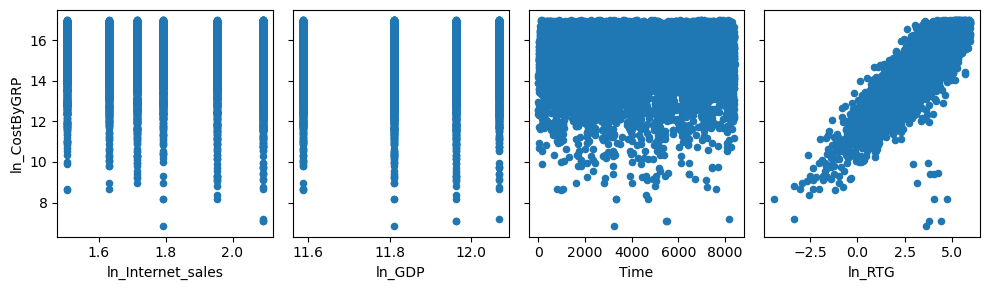

In [45]:
fig, axs = plt.subplots(1, 4, sharey=True)

df_new.plot(kind='scatter', x='ln_Internet_sales', y='ln_CostByGRP', ax=axs[0], figsize=(10, 3))
df_new.plot(kind='scatter', x='ln_GDP', y='ln_CostByGRP', ax=axs[1])
df_new.plot(kind='scatter', x='Time', y='ln_CostByGRP', ax=axs[2])
df_new.plot(kind='scatter', x='ln_RTG', y='ln_CostByGRP', ax=axs[3])

plt.tight_layout()
plt.savefig('graph20.png', dpi=300, bbox_inches='tight')
plt.show()

In [46]:
Y = df_new['ln_CostByGRP']
X = df_new[['ln_Internet_sales', 'ln_GDP', 'Time', 'ln_RTG']]
X = sm.add_constant(X)  
model = sm.OLS(Y, X)
res = model.fit() 
print(res.summary())

coef = res.params['ln_Internet_sales']
pval = res.pvalues['ln_Internet_sales']
conf_int = res.conf_int().loc['ln_Internet_sales']

print(f"Коэффициент при ln_Internet_sales: {coef:.4f}")
print(f"p-value: {pval:.4f}")
print(f"95% доверительный интервал: [{conf_int[0]:.4f}, {conf_int[1]:.4f}]")
alpha = 0.10  
if coef < 0 and pval < alpha:
    print("Гипотеза подтверждена")
    print(f"При росте интернет-продаж на 1%, стоимость за GRP снижается на {abs(coef):.1%}.")
    print("Это свидетельствует об эффекте замещения.")
else:
    print("Гипотеза не подтверждена")

                            OLS Regression Results                            
Dep. Variable:           ln_CostByGRP   R-squared:                       0.735
Model:                            OLS   Adj. R-squared:                  0.735
Method:                 Least Squares   F-statistic:                     5819.
Date:                Mon, 11 May 2026   Prob (F-statistic):               0.00
Time:                        13:38:36   Log-Likelihood:                -9129.8
No. Observations:                8402   AIC:                         1.827e+04
Df Residuals:                    8397   BIC:                         1.830e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                28.7495      1.83

In [47]:
from io import StringIO

summary_text = res.summary()

fig, ax = plt.subplots(figsize=(10, 6))
ax.axis('off') 
ax.text(0, 1, summary_text, fontsize=10, family='monospace', verticalalignment='top')

plt.savefig('graph21.png', bbox_inches='tight', dpi=300)
plt.close()

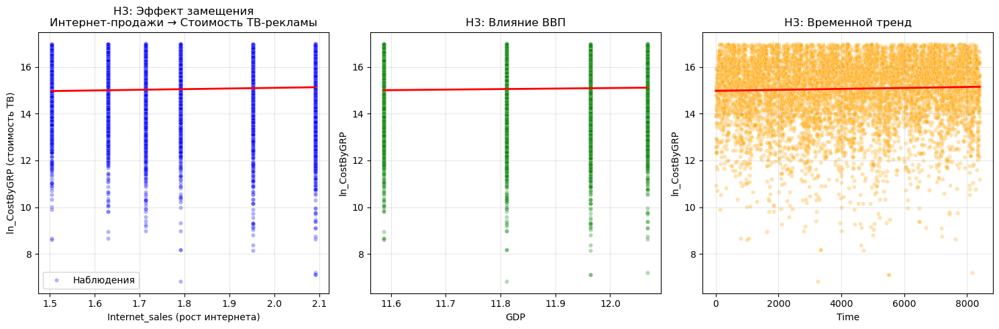

In [48]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

ax1 = axes[0]
sns.scatterplot(x='ln_Internet_sales', y='ln_CostByGRP', data=df_new, 
                alpha=0.3, s=20, ax=ax1, color='blue', label='Наблюдения')
sns.regplot(x='ln_Internet_sales', y='ln_CostByGRP', data=df_new, 
            scatter=False, ci=95, ax=ax1, line_kws={'color': 'red', 'lw': 2, 'label': 'Тренд'})
ax1.set_title('H3: Эффект замещения\nИнтернет-продажи → Стоимость ТВ-рекламы', fontsize=12)
ax1.set_xlabel('Internet_sales (рост интернета)')
ax1.set_ylabel('ln_CostByGRP (стоимость ТВ)')
ax1.legend()
ax1.grid(True, alpha=0.3)

ax2 = axes[1]
sns.scatterplot(x='ln_GDP', y='ln_CostByGRP', data=df_new, 
                alpha=0.3, s=20, ax=ax2, color='green')
sns.regplot(x='ln_GDP', y='ln_CostByGRP', data=df_new, 
            scatter=False, ci=95, ax=ax2, line_kws={'color': 'red', 'lw': 2})
ax2.set_title('H3: Влияние ВВП', fontsize=12)
ax2.set_xlabel('GDP')
ax2.set_ylabel('ln_CostByGRP')
ax2.grid(True, alpha=0.3)

ax3 = axes[2]
sns.scatterplot(x='Time', y='ln_CostByGRP', data=df_new, 
                alpha=0.3, s=20, ax=ax3, color='orange')
sns.regplot(x='Time', y='ln_CostByGRP', data=df_new, 
            scatter=False, ci=95, ax=ax3, line_kws={'color': 'red', 'lw': 2})
ax3.set_title('H3: Временной тренд', fontsize=12)
ax3.set_xlabel('Time')
ax3.set_ylabel('ln_CostByGRP')
ax3.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('graph22.png', dpi=300, bbox_inches='tight')
plt.show()

Создадим новый датафрейм с данными агрегированными по периоду и преобразуем столбец Период в дату с временным трендом. В конце добавим фиктивные переменные для периода пандемии и квартальные переменные для учета сезонности.

In [49]:
df_agg = df_new.groupby('Период').agg({
    'ln_RTG': 'mean',
    'ln_ATV': 'mean',
    'ln_AvReach': 'mean',
    'ln_CostByGRP': 'mean',
    'ln_ATVReach[Сумма]': 'mean',
    'Advertiser_type':'mean',
    'CostByGRPRUB': 'mean',
    'Internet_sales' : 'mean'
}).reset_index()


def period_to_middate1(period):
    period = str(period)
    if '1 полугодие' in period:
        year = period.split()[-1]
        return pd.to_datetime(f"{year}-06-30")
    elif '2 полугодие' in period:
        year = period.split()[-1]
        return pd.to_datetime(f"{year}-12-31")

df_agg['Дата'] = df_agg['Период'].apply(period_to_middate1)
df_agg = df_agg.sort_values('Дата').reset_index(drop=True)
df_agg['Time'] = np.arange(1, len(df_agg) + 1) 
df_agg['HalfYear_1'] = (df_agg['Дата'].dt.month == 6).astype(np.int32)  
df_agg['COVID_dummy'] = df_agg['Дата'].dt.year.isin([2020, 2021]).astype(np.int32)

df_agg.head()

C:\Users\proho\AppData\Local\Temp\ipykernel_15692\832805169.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_agg = df_new.groupby('Период').agg({


,Период,ln_RTG,ln_ATV,ln_AvReach,ln_CostByGRP,ln_ATVReach[Сумма],Advertiser_type,CostByGRPRUB,Internet_sales,Дата,Time,HalfYear_1,COVID_dummy
0,1 полугодие 2020,3.812686,-0.792483,-0.968277,15.063305,1.290288,0.623932,6.446673e+06,4.50,2020-06-30,1,1,1
1,2 полугодие 2020,3.700809,-0.904376,-1.019222,15.058940,1.273515,0.651456,6.613054e+06,5.10,2020-12-31,2,0,1
2,1 полугодие 2021,3.625921,-0.979241,-1.078916,14.875543,1.259340,0.640802,5.855116e+06,5.55,2021-06-30,3,1,1
3,2 полугодие 2021,3.642745,-0.962424,-1.120808,15.048309,1.292694,0.644425,6.465157e+06,6.00,2021-12-31,4,0,1
4,1 полугодие 2022,3.542211,-1.062966,-1.081811,14.971024,1.240274,0.629061,6.280567e+06,7.05,2022-06-30,5,1,0


In [50]:
yearly_data_internet = {
    2020: df_internet[2020].iloc[0],
    2021: df_internet[2021].iloc[0],
    2022: df_internet[2022].iloc[0],
    2023: df_internet[2023].iloc[0]
}

def interpolate_internet(date_obj):
    year = date_obj.year
    month = date_obj.month
    half = 1 if month <= 6 else 2
    
    try:
        if year == 2020:
            if half == 1:
                return yearly_data_internet[2020] + 0.5 * (yearly_data_internet[2021] - yearly_data_internet[2020])
            else:
                return yearly_data_internet[2021]
        elif year == 2021:
            if half == 1:
                return yearly_data_internet[2021] + 0.5 * (yearly_data_internet[2022] - yearly_data_internet[2021])
            else:
                return yearly_data_internet[2022]
        elif year == 2022:
            if half == 1:
                return yearly_data_internet[2022] + 0.5 * (yearly_data_internet[2023] - yearly_data_internet[2022])
            else:
                return yearly_data_internet[2023]
        elif year == 2023:
            return yearly_data_internet[2023]
    except Exception:
        return None

df_agg['InternetPenetration'] = df_agg['Дата'].apply(interpolate_internet)
df_agg['ln_InternetPenetration'] = np.log(df_agg['InternetPenetration'])

df_agg.head()

,Период,ln_RTG,ln_ATV,ln_AvReach,ln_CostByGRP,ln_ATVReach[Сумма],Advertiser_type,CostByGRPRUB,Internet_sales,Дата,Time,HalfYear_1,COVID_dummy,InternetPenetration,ln_InternetPenetration
0,1 полугодие 2020,3.812686,-0.792483,-0.968277,15.063305,1.290288,0.623932,6.446673e+06,4.50,2020-06-30,1,1,1,82.00,4.406719
1,2 полугодие 2020,3.700809,-0.904376,-1.019222,15.058940,1.273515,0.651456,6.613054e+06,5.10,2020-12-31,2,0,1,84.00,4.430817
2,1 полугодие 2021,3.625921,-0.979241,-1.078916,14.875543,1.259340,0.640802,5.855116e+06,5.55,2021-06-30,3,1,1,85.30,4.446174
3,2 полугодие 2021,3.642745,-0.962424,-1.120808,15.048309,1.292694,0.644425,6.465157e+06,6.00,2021-12-31,4,0,1,86.60,4.461300
4,1 полугодие 2022,3.542211,-1.062966,-1.081811,14.971024,1.240274,0.629061,6.280567e+06,7.05,2022-06-30,5,1,0,87.25,4.468778


**H1(a)**

In [51]:
Y = df_agg['ln_RTG']
X = df_agg[['Time', 'HalfYear_1', 'COVID_dummy', 'ln_InternetPenetration','Advertiser_type']]
X = sm.add_constant(X)
model = sm.OLS(Y,X)
res = model.fit()
print (res.summary())
coef = res.params['Time']
pval = res.pvalues['Time']
int = res.conf_int().loc['Time']
print(f"Коэффициент при Time: {coef:.4f}")
print(f"p-value: {pval:.4f}")
print(f"95% доверительный интервал: [{int[0]:.4f}, {int[1]:.4f}]")
alpha = 0.10
if coef < 0 and pval < alpha:
        print(f"Гипотеза подтверждена")
else:
        print(f"Гипотеза не подтверждена")

                            OLS Regression Results                            
Dep. Variable:                 ln_RTG   R-squared:                       0.663
Model:                            OLS   Adj. R-squared:                 -0.178
Method:                 Least Squares   F-statistic:                    0.7885
Date:                Mon, 11 May 2026   Prob (F-statistic):              0.641
Time:                        13:38:44   Log-Likelihood:                 12.465
No. Observations:                   8   AIC:                            -12.93
Df Residuals:                       2   BIC:                            -12.45
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     14

C:\Users\proho\anaconda3\an\Lib\site-packages\scipy\stats\_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


In [52]:
from io import StringIO

summary_text = res.summary()

fig, ax = plt.subplots(figsize=(10, 6))
ax.axis('off') 
ax.text(0, 1, summary_text, fontsize=10, family='monospace', verticalalignment='top')

plt.savefig('graph23.png', bbox_inches='tight', dpi=300)
plt.close()

C:\Users\proho\anaconda3\an\Lib\site-packages\scipy\stats\_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


**H1(b)**

In [53]:
Y = df_agg['ln_ATV']
X = df_agg[['Time', 'HalfYear_1', 'COVID_dummy', 'ln_InternetPenetration','Advertiser_type']]
X = sm.add_constant(X)
model = sm.OLS(Y,X)
res = model.fit()
print (res.summary())
coef = res.params['Time']
pval = res.pvalues['Time']
int = res.conf_int().loc['Time']
print(f"Коэффициент при Time: {coef:.4f}")
print(f"p-value: {pval:.4f}")
print(f"95% доверительный интервал: [{int[0]:.4f}, {int[1]:.4f}]")
alpha = 0.10
if coef < 0 and pval < alpha:
        print(f"\n Гипотеза подтверждена")
else:
        print(f"\n Гипотеза не подтверждена")

                            OLS Regression Results                            
Dep. Variable:                 ln_ATV   R-squared:                       0.663
Model:                            OLS   Adj. R-squared:                 -0.178
Method:                 Least Squares   F-statistic:                    0.7884
Date:                Mon, 11 May 2026   Prob (F-statistic):              0.642
Time:                        13:38:45   Log-Likelihood:                 12.464
No. Observations:                   8   AIC:                            -12.93
Df Residuals:                       2   BIC:                            -12.45
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     10

C:\Users\proho\anaconda3\an\Lib\site-packages\scipy\stats\_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


In [54]:
from io import StringIO

summary_text = res.summary()

fig, ax = plt.subplots(figsize=(10, 6))
ax.axis('off') 
ax.text(0, 1, summary_text, fontsize=10, family='monospace', verticalalignment='top')

plt.savefig('graph24.png', bbox_inches='tight', dpi=300)
plt.close()

C:\Users\proho\anaconda3\an\Lib\site-packages\scipy\stats\_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


**H1(c)**

In [55]:
Y = df_agg['ln_AvReach']
X = df_agg[['Time', 'HalfYear_1', 'COVID_dummy', 'ln_InternetPenetration','Advertiser_type']]
X = sm.add_constant(X)
model = sm.OLS(Y,X)
res = model.fit()
print (res.summary())
coef = res.params['Time']
pval = res.pvalues['Time']
int = res.conf_int().loc['Time']
print(f"Коэффициент при Time: {coef:.4f}")
print(f"p-value: {pval:.4f}")
print(f"95% доверительный интервал: [{int[0]:.4f}, {int[1]:.4f}]")
alpha = 0.10
if coef < 0 and pval < alpha:
        print(f"\n Гипотеза подтверждена")
else:
        print(f"\n Гипотеза не подтверждена")

                            OLS Regression Results                            
Dep. Variable:             ln_AvReach   R-squared:                       0.984
Model:                            OLS   Adj. R-squared:                  0.944
Method:                 Least Squares   F-statistic:                     24.48
Date:                Mon, 11 May 2026   Prob (F-statistic):             0.0397
Time:                        13:38:46   Log-Likelihood:                 25.250
No. Observations:                   8   AIC:                            -38.50
Df Residuals:                       2   BIC:                            -38.02
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     -2

C:\Users\proho\anaconda3\an\Lib\site-packages\scipy\stats\_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


In [56]:
from io import StringIO

summary_text = res.summary()

fig, ax = plt.subplots(figsize=(10, 6))
ax.axis('off') 
ax.text(0, 1, summary_text, fontsize=10, family='monospace', verticalalignment='top')

plt.savefig('graph25.png', bbox_inches='tight', dpi=300)
plt.close()

C:\Users\proho\anaconda3\an\Lib\site-packages\scipy\stats\_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


**H2**

In [57]:
df_vvp = pd.read_excel('ВВП.xls')
df_vvp

,Наименования показателя,2020,2021,2022,2023
0,Валовой внутренний продукт текущих ценах (млрд...,107658.13103,134727.4674,157001.3938,174265.725757


In [58]:
df_agg['Year'] = df_agg['Период'].str[-4:]

gdp_dict = {'2020': df_vvp[2020].iloc[0],
    '2021': df_vvp[2021].iloc[0],
    '2022': df_vvp[2022].iloc[0],
    '2023': df_vvp[2023].iloc[0]}


df_agg['GDP'] = df_agg['Year'].map(gdp_dict)
df_agg = df_agg.drop(columns=['Year'])
df_agg['ln_GDP'] = np.log(df_agg['GDP'])

df_agg.head()

,Период,ln_RTG,ln_ATV,ln_AvReach,ln_CostByGRP,ln_ATVReach[Сумма],Advertiser_type,CostByGRPRUB,Internet_sales,Дата,Time,HalfYear_1,COVID_dummy,InternetPenetration,ln_InternetPenetration,GDP,ln_GDP
0,1 полугодие 2020,3.812686,-0.792483,-0.968277,15.063305,1.290288,0.623932,6.446673e+06,4.50,2020-06-30,1,1,1,82.00,4.406719,107658.13103,11.586716
1,2 полугодие 2020,3.700809,-0.904376,-1.019222,15.058940,1.273515,0.651456,6.613054e+06,5.10,2020-12-31,2,0,1,84.00,4.430817,107658.13103,11.586716
2,1 полугодие 2021,3.625921,-0.979241,-1.078916,14.875543,1.259340,0.640802,5.855116e+06,5.55,2021-06-30,3,1,1,85.30,4.446174,134727.46740,11.811009
3,2 полугодие 2021,3.642745,-0.962424,-1.120808,15.048309,1.292694,0.644425,6.465157e+06,6.00,2021-12-31,4,0,1,86.60,4.461300,134727.46740,11.811009
4,1 полугодие 2022,3.542211,-1.062966,-1.081811,14.971024,1.240274,0.629061,6.280567e+06,7.05,2022-06-30,5,1,0,87.25,4.468778,157001.39380,11.964010


In [59]:
Y = df_agg['ln_CostByGRP']
X = df_agg[['ln_RTG', 'Time','ln_GDP','Advertiser_type']]
X = sm.add_constant(X)
model = sm.OLS(Y,X)
res = model.fit()
print (res.summary())
coef = res.params['Time']
pval = res.pvalues['Time']
int = res.conf_int().loc['Time']
print(f"Коэффициент при Time: {coef:.4f}")
print(f"p-value: {pval:.4f}")
print(f"95% доверительный интервал: [{int[0]:.4f}, {int[1]:.4f}]")
alpha = 0.10
if coef < 0 and pval < alpha:
        print(f"\n Гипотеза подтверждена")
else:
        print(f"\n Гипотеза не подтверждена")

                            OLS Regression Results                            
Dep. Variable:           ln_CostByGRP   R-squared:                       0.964
Model:                            OLS   Adj. R-squared:                  0.916
Method:                 Least Squares   F-statistic:                     20.02
Date:                Mon, 11 May 2026   Prob (F-statistic):             0.0168
Time:                        13:38:47   Log-Likelihood:                 19.843
No. Observations:                   8   AIC:                            -29.69
Df Residuals:                       3   BIC:                            -29.29
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const              19.0468      3.455     

C:\Users\proho\anaconda3\an\Lib\site-packages\scipy\stats\_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


In [60]:
from io import StringIO

summary_text = res.summary()

fig, ax = plt.subplots(figsize=(10, 6))
ax.axis('off') 
ax.text(0, 1, summary_text, fontsize=10, family='monospace', verticalalignment='top')

plt.savefig('graph26.png', bbox_inches='tight', dpi=300)
plt.close()

C:\Users\proho\anaconda3\an\Lib\site-packages\scipy\stats\_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


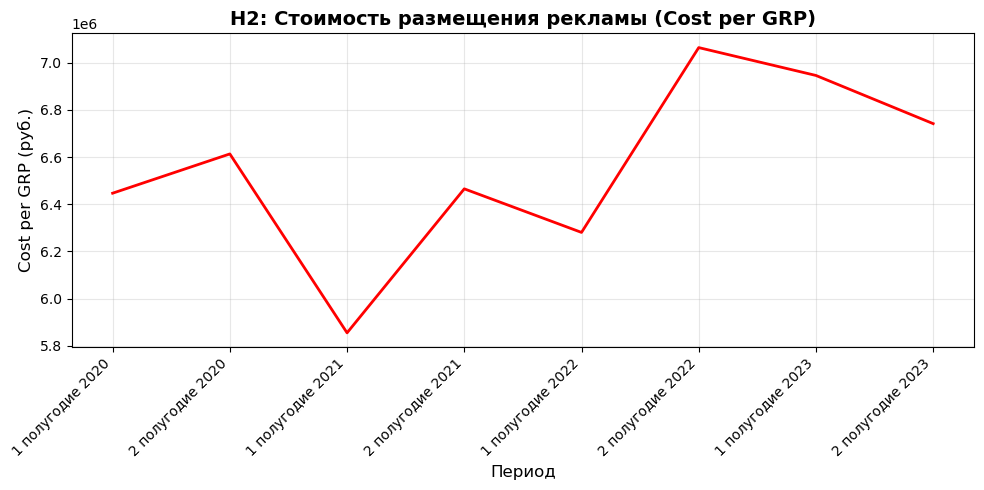

In [61]:
plt.figure(figsize=(10, 5))
period_labels = df_agg['Период'].values

plt.plot(period_labels, df_agg['CostByGRPRUB'], color='red', linewidth=2, markersize=8)
plt.title('H2: Стоимость размещения рекламы (Cost per GRP)', fontsize=14, fontweight='bold')
plt.ylabel('Cost per GRP (руб.)', fontsize=12)
plt.xlabel('Период', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('graph27.png', bbox_inches='tight', dpi=300)
plt.show()

**H3**

Данные о доле продаж в Интернете в общем объеме оборота розничной торговли в фактически действовавших ценах в процентах скачаны с Росстата (http://ssl.rosstat.gov.ru/storage/mediabank/internet_torgovlya_4kv-2024.xlsx). Их также необходимо интерполировать, так как допступны только данные по годам.

In [62]:
df_sales = pd.read_excel('доля продаж.xlsx')
df_sales

,Наименование показателя,2020,2021,2022,2023
0,Доля продаж через Интернет,3.9,5.1,6,8.1


In [63]:
yearly_data_2 = {2020: df_sales[2020].iloc[0],
    2021: df_sales[2021].iloc[0],
    2022: df_sales[2022].iloc[0],
    2023: df_sales[2023].iloc[0]}

def interpolate_sales(date_obj):
    year = date_obj.year
    month = date_obj.month
    half = 1 if month <= 6 else 2
    
    try:
        if year == 2020:
            if half == 1:
                return yearly_data_2[2020] + 0.5 * (yearly_data_2[2021] - yearly_data_2[2020])
            else:
                return yearly_data_2[2021]
        elif year == 2021:
            if half == 1:
                return yearly_data_2[2021] + 0.5 * (yearly_data_2[2022] - yearly_data_2[2021])
            else:
                return yearly_data_2[2022]
        elif year == 2022:
            if half == 1:
                return yearly_data_2[2022] + 0.5 * (yearly_data_2[2023] - yearly_data_2[2022])
            else:
                return yearly_data_2[2023]
        elif year == 2023:
            return yearly_data_2[2023]
    except Exception:
        return None

df_agg['Internet_sales'] = df_agg['Дата'].apply(interpolate_sales)
df_agg['ln_Internet_sales'] = df_agg['Дата'].apply(interpolate_sales)
df_agg.head()

,Период,ln_RTG,ln_ATV,ln_AvReach,ln_CostByGRP,ln_ATVReach[Сумма],Advertiser_type,CostByGRPRUB,Internet_sales,Дата,Time,HalfYear_1,COVID_dummy,InternetPenetration,ln_InternetPenetration,GDP,ln_GDP,ln_Internet_sales
0,1 полугодие 2020,3.812686,-0.792483,-0.968277,15.063305,1.290288,0.623932,6.446673e+06,4.50,2020-06-30,1,1,1,82.00,4.406719,107658.13103,11.586716,4.50
1,2 полугодие 2020,3.700809,-0.904376,-1.019222,15.058940,1.273515,0.651456,6.613054e+06,5.10,2020-12-31,2,0,1,84.00,4.430817,107658.13103,11.586716,5.10
2,1 полугодие 2021,3.625921,-0.979241,-1.078916,14.875543,1.259340,0.640802,5.855116e+06,5.55,2021-06-30,3,1,1,85.30,4.446174,134727.46740,11.811009,5.55
3,2 полугодие 2021,3.642745,-0.962424,-1.120808,15.048309,1.292694,0.644425,6.465157e+06,6.00,2021-12-31,4,0,1,86.60,4.461300,134727.46740,11.811009,6.00
4,1 полугодие 2022,3.542211,-1.062966,-1.081811,14.971024,1.240274,0.629061,6.280567e+06,7.05,2022-06-30,5,1,0,87.25,4.468778,157001.39380,11.964010,7.05


In [64]:
X = df_agg[['ln_Internet_sales', 'ln_GDP', 'Time', 'ln_RTG','Advertiser_type']]
X = sm.add_constant(X)  
model = sm.OLS(Y, X)
res = model.fit() 
print(res.summary())

coef = res.params['ln_Internet_sales']
pval = res.pvalues['ln_Internet_sales']
conf_int = res.conf_int().loc['ln_Internet_sales']

print(f"Коэффициент при ln_Internet_sales: {coef:.4f}")
print(f"p-value: {pval:.4f}")
print(f"95% доверительный интервал: [{conf_int[0]:.4f}, {conf_int[1]:.4f}]")
alpha = 0.10  
if coef < 0 and pval < alpha:
    print("Гипотеза подтверждена")
    print(f"При росте интернет-продаж на 1%, стоимость за GRP снижается на {abs(coef):.1%}.")
    print("Это свидетельствует об эффекте замещения.")
else:
    print("Гипотеза не подтверждена")

                            OLS Regression Results                            
Dep. Variable:           ln_CostByGRP   R-squared:                       0.980
Model:                            OLS   Adj. R-squared:                  0.930
Method:                 Least Squares   F-statistic:                     19.62
Date:                Mon, 11 May 2026   Prob (F-statistic):             0.0492
Time:                        13:38:49   Log-Likelihood:                 22.212
No. Observations:                   8   AIC:                            -32.42
Df Residuals:                       2   BIC:                            -31.95
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                20.4154      3.32

C:\Users\proho\anaconda3\an\Lib\site-packages\scipy\stats\_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


In [65]:
from io import StringIO

summary_text = res.summary()

fig, ax = plt.subplots(figsize=(10, 6))
ax.axis('off') 
ax.text(0, 1, summary_text, fontsize=10, family='monospace', verticalalignment='top')

plt.savefig('graph28.png', bbox_inches='tight', dpi=300)
plt.close()

C:\Users\proho\anaconda3\an\Lib\site-packages\scipy\stats\_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


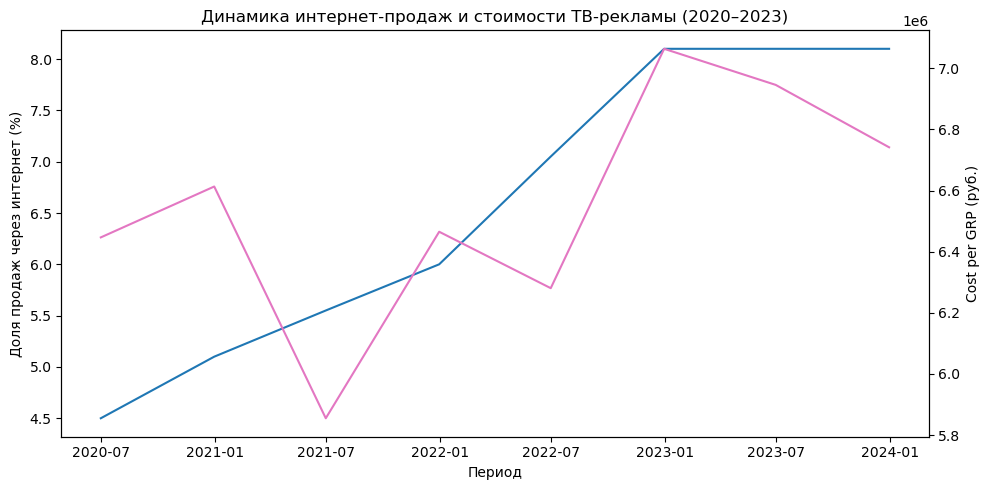

In [66]:
fig, ax1 = plt.subplots(figsize=(10, 5))
ax1.set_xlabel('Период')
ax1.set_ylabel('Доля продаж через интернет (%)')
ax1.plot(df_agg['Дата'], df_agg['Internet_sales'], label='Интернет-продажи')
ax1.tick_params(axis='y')

ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Cost per GRP (руб.)')
ax2.plot(df_agg['Дата'], df_agg['CostByGRPRUB'],color = 'tab:pink',label='CostPerGRP')
ax2.tick_params(axis='y')

plt.title('Динамика интернет-продаж и стоимости ТВ-рекламы (2020–2023)', fontsize=12)
fig.tight_layout()
plt.savefig('graph29.png', bbox_inches='tight', dpi=300)
plt.show()

## Панельные данные (Panel Data) с фиксированными эффектами

In [67]:
from linearmodels import PanelOLS
import statsmodels.formula.api as smf

df_panel = df_new.copy()
results_summary = []

df_panel['Дата'] = df_panel['Дата'].apply(period_to_middate1)
df_panel['Дата'] = pd.to_datetime(df_panel['Дата'])
df_panel = df_panel.sort_values(['Канал', 'Дата'])
df_panel['time_num'] = df_panel.groupby('Канал').cumcount()
df_panel = df_panel.set_index(['Канал', 'time_num'])
df_panel = df_panel.sort_index()

model_h1a = PanelOLS.from_formula(
    'ln_RTG ~ Time + HalfYear_1 + COVID_dummy + ln_InternetPenetration + Advertiser_type + EntityEffects',
    data=df_panel).fit(cov_type='clustered', cluster_entity=True)

print("H1a: Тренд телевизионных рейтингов (фиксированные эффекты)")
print(model_h1a.summary)

coef_time = model_h1a.params['Time']
pval_time = model_h1a.pvalues['Time']
conf_int_time = model_h1a.conf_int().loc['Time'].values

print("Проверка гипотезы Н1а:")
print(f"Коэффициент при Time: {coef_time:.6f}")
print(f"p-value: {pval_time:.6f}")
print(f"95% доверительный интервал: [{conf_int_time[0]:.6f}, {conf_int_time[1]:.6f}]")

alpha = 0.10
if coef_time < 0 and pval_time < alpha:
    print(f"ГИПОТЕЗА H1a ПОДТВЕРЖДЕНА")
    print(f"Обнаружено статистически значимое снижение рейтингов во времени")
    h1a_result = "ПОДТВЕРЖДЕНА"
    h1a_conclusion = f"Рейтинги снижаются на {abs(coef_time):.4f} за единицу времени (p={pval_time:.4f})"
elif coef_time < 0 and pval_time >= alpha:
    print(f"ГИПОТЕЗА H1a НЕ ПОДТВЕРЖДЕНА")
    print(f"Отрицательный тренд есть, но статистически незначим (p={pval_time:.4f} > α={alpha})")
    h1a_result = "НЕ ПОДТВЕРЖДЕНА"
    h1a_conclusion = "Отрицательный тренд незначим"
else:
    print(f"ГИПОТЕЗА H1a ОПРОВЕРГНУТА")
    print(f"Обнаружен положительный или нулевой тренд")
    h1a_result = "ОПРОВЕРГНУТА"
    h1a_conclusion = f"Коэффициент положительный: {coef_time:.4f}"

results_summary.append({
    'Гипотеза': 'H1a: Снижение рейтингов',
    'Коэффициент': coef_time,
    'p-value': pval_time,
    'Результат': h1a_result,
    'Вывод': h1a_conclusion
})

H1a: Тренд телевизионных рейтингов (фиксированные эффекты)
                          PanelOLS Estimation Summary                           
Dep. Variable:                 ln_RTG   R-squared:                        0.0104
Estimator:                   PanelOLS   R-squared (Between):             -4.4031
No. Observations:                8402   R-squared (Within):               0.0104
Date:                Mon, May 11 2026   R-squared (Overall):             -3.8637
Time:                        13:38:53   Log-likelihood                -1.293e+04
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      17.581
Entities:                          33   P-value                           0.0000
Avg Obs:                       254.61   Distribution:                  F(5,8364)
Min Obs:                       26.000                                           
Max Obs:                       523.00   F-statisti

In [68]:
results_text = f"H1a: Тренд телевизионных рейтингов (фиксированные эффекты)\n{model_h1a.summary}"
size = 9
weight = 'normal'
color = 'black'
fig, ax = plt.subplots(figsize=(12, 14))
ax.axis('off')

lines = results_text.split('\n')
for i, line in enumerate(lines):
     ax.text(0.05, 0.98 - i*0.025, line, 
            fontsize=size,
            weight=weight,
            color=color,
            verticalalignment='top',
            transform=ax.transAxes,
            family='monospace')

plt.savefig('graph30.png', 
           dpi=300, 
           bbox_inches='tight', 
           facecolor='white',
           edgecolor='none')
plt.close()

In [69]:
model_h1b = PanelOLS.from_formula(
    'ln_ATV ~ Time + HalfYear_1 + COVID_dummy + ln_InternetPenetration + Advertiser_type + EntityEffects',
    data=df_panel
).fit(cov_type='clustered', cluster_entity=True)
print(model_h1b.summary)

coef_time_h1b = model_h1b.params['Time']
pval_time_h1b = model_h1b.pvalues['Time']
conf_int_time_h1b = model_h1b.conf_int().loc['Time'].values

print("Проверка гипотезы H1b:")
print(f"Коэффициент при Time: {coef_time_h1b:.6f}")
print(f"p-value: {pval_time_h1b:.6f}")
print(f"95% доверительный интервал: [{conf_int_time_h1b[0]:.6f}, {conf_int_time_h1b[1]:.6f}]")

if coef_time_h1b < 0 and pval_time_h1b < alpha:
    print(f"ГИПОТЕЗА H1b ПОДТВЕРЖДЕНА")
    print(f"Обнаружено статистически значимое снижение среднего времени просмотра")
    h1b_result = "ПОДТВЕРЖДЕНА"
    h1b_conclusion = f"Время просмотра снижается на {abs(coef_time_h1b):.4f} за единицу времени (p={pval_time_h1b:.4f})"
elif coef_time_h1b < 0 and pval_time_h1b >= alpha:
    print(f"ГИПОТЕЗА H1b НЕ ПОДТВЕРЖДЕНА")
    print(f"Отрицательный тренд есть, но статистически незначим (p={pval_time_h1b:.4f} > α={alpha})")
    h1b_result = "НЕ ПОДТВЕРЖДЕНА"
    h1b_conclusion = "Отрицательный тренд незначим"
else:
    print(f"ГИПОТЕЗА H1b ОПРОВЕРГНУТА")
    print(f"Обнаружен положительный или нулевой тренд")
    h1b_result = "ОПРОВЕРГНУТА"
    h1b_conclusion = f"Коэффициент положительный: {coef_time_h1b:.4f}"

results_summary.append({
    'Гипотеза': 'H1b: Снижение времени просмотра',
    'Коэффициент': coef_time_h1b,
    'p-value': pval_time_h1b,
    'Результат': h1b_result,
    'Вывод': h1b_conclusion
})

                          PanelOLS Estimation Summary                           
Dep. Variable:                 ln_ATV   R-squared:                        0.0104
Estimator:                   PanelOLS   R-squared (Between):             -6.5077
No. Observations:                8402   R-squared (Within):               0.0104
Date:                Mon, May 11 2026   R-squared (Overall):             -5.0406
Time:                        13:38:55   Log-likelihood                -1.293e+04
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      17.581
Entities:                          33   P-value                           0.0000
Avg Obs:                       254.61   Distribution:                  F(5,8364)
Min Obs:                       26.000                                           
Max Obs:                       523.00   F-statistic (robust):             9.8633
                            

In [70]:
results_text = f"H1b: Тренд среднего времени просмотра (фиксированные эффекты)\n{model_h1b.summary}"

fig, ax = plt.subplots(figsize=(12, 14))
ax.axis('off')

lines = results_text.split('\n')
for i, line in enumerate(lines):
     ax.text(0.05, 0.98 - i*0.025, line, 
            fontsize=size,
            weight=weight,
            color=color,
            verticalalignment='top',
            transform=ax.transAxes,
            family='monospace')

plt.savefig('graph31.png', 
           dpi=300, 
           bbox_inches='tight', 
           facecolor='white',
           edgecolor='none')
plt.close()

In [71]:
model_h1c = PanelOLS.from_formula(
    'ln_AvReach ~ Time + HalfYear_1 + COVID_dummy + ln_InternetPenetration + Advertiser_type + EntityEffects',
    data=df_panel
).fit(cov_type='clustered', cluster_entity=True)
print(model_h1c.summary)

coef_time_h1c = model_h1c.params['Time']
pval_time_h1c = model_h1c.pvalues['Time']
conf_int_time_h1c = model_h1c.conf_int().loc['Time'].values

print("Проверка гипотезы H1c:")
print(f"Коэффициент при Time: {coef_time_h1c:.6f}")
print(f"p-value: {pval_time_h1c:.6f}")
print(f"95% доверительный интервал: [{conf_int_time_h1c[0]:.6f}, {conf_int_time_h1c[1]:.6f}]")

if coef_time_h1c < 0 and pval_time_h1c < alpha:
    print(f"ГИПОТЕЗА H1c ПОДТВЕРЖДЕНА")
    print(f"Обнаружено статистически значимое снижение охвата аудитории")
    h1c_result = "ПОДТВЕРЖДЕНА"
    h1c_conclusion = f"Охват снижается на {abs(coef_time_h1c):.4f} за единицу времени (p={pval_time_h1c:.4f})"
elif coef_time_h1c < 0 and pval_time_h1c >= alpha:
    print(f"ГИПОТЕЗА H1c НЕ ПОДТВЕРЖДЕНА")
    print(f"Отрицательный тренд есть, но статистически незначим (p={pval_time_h1c:.4f} > α={alpha})")
    h1c_result = "НЕ ПОДТВЕРЖДЕНА"
    h1c_conclusion = "Отрицательный тренд незначим"
else:
    print(f"ГИПОТЕЗА H1c ОПРОВЕРГНУТА")
    print(f"Обнаружен положительный или нулевой тренд")
    h1c_result = "ОПРОВЕРГНУТА"
    h1c_conclusion = f"Коэффициент положительный: {coef_time_h1c:.4f}"

results_summary.append({
    'Гипотеза': 'H1c: Снижение охвата',
    'Коэффициент': coef_time_h1c,
    'p-value': pval_time_h1c,
    'Результат': h1c_result,
    'Вывод': h1c_conclusion
})

                          PanelOLS Estimation Summary                           
Dep. Variable:             ln_AvReach   R-squared:                        0.0515
Estimator:                   PanelOLS   R-squared (Between):             -26.601
No. Observations:                8402   R-squared (Within):               0.0515
Date:                Mon, May 11 2026   R-squared (Overall):             -32.391
Time:                        13:38:57   Log-likelihood                   -2301.8
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      90.903
Entities:                          33   P-value                           0.0000
Avg Obs:                       254.61   Distribution:                  F(5,8364)
Min Obs:                       26.000                                           
Max Obs:                       523.00   F-statistic (robust):             11.198
                            

In [72]:
results_text = f"H1c: Тренд охвата аудитории (фиксированные эффекты)\n{model_h1c.summary}"

fig, ax = plt.subplots(figsize=(12, 14))
ax.axis('off')

lines = results_text.split('\n')
for i, line in enumerate(lines):
     ax.text(0.05, 0.98 - i*0.025, line, 
            fontsize=size,
            weight=weight,
            color=color,
            verticalalignment='top',
            transform=ax.transAxes,
            family='monospace')

plt.savefig('graph32.png', 
           dpi=300, 
           bbox_inches='tight', 
           facecolor='white',
           edgecolor='none')
plt.close()

In [73]:
model_h2 = PanelOLS.from_formula(
    'ln_CostByGRP ~ Time + ln_RTG + ln_GDP + Advertiser_type + EntityEffects',
    data=df_panel
).fit(cov_type='clustered', cluster_entity=True)

print(model_h2.summary)

coef_time_h2 = model_h2.params['Time']
pval_time_h2 = model_h2.pvalues['Time']
conf_int_time_h2 = model_h2.conf_int().loc['Time'].values

print("Проверка гипотезы H2:")
print(f"Коэффициент при Time: {coef_time_h2:.6f}")
print(f"p-value: {pval_time_h2:.6f}")
print(f"95% доверительный интервал: [{conf_int_time_h2[0]:.6f}, {conf_int_time_h2[1]:.6f}]")

alpha = 0.10
if coef_time_h2 < 0 and pval_time_h2 < alpha:
    print(f"ГИПОТЕЗА H2 ПОДТВЕРЖДЕНА")
    print(f"Обнаружено статистически значимое снижение стоимости рекламы во времени")
    h2_result = "ПОДТВЕРЖДЕНА"
    h2_conclusion = f"Стоимость снижается на {abs(coef_time_h2):.4f} за единицу времени (p={pval_time_h2:.4f})"
elif coef_time_h2 > 0 and pval_time_h2 >= alpha:
    print(f"ГИПОТЕЗА H2 НЕ ПОДТВЕРЖДЕНА")
    print(f"Отрицательный тренд есть, но статистически незначим (p={pval_time_h2:.4f} > α={alpha})")
    h2_result = "НЕ ПОДТВЕРЖДЕНА"
    h2_conclusion = "Отрицательный тренд незначим"
else:
    print(f"ГИПОТЕЗА H2 ОПРОВЕРГНУТА")
    print(f"Обнаружен положительный или нулевой тренд стоимости")
    h2_result = "ОПРОВЕРГНУТА"
    h2_conclusion = f"Коэффициент положительный: {coef_time_h2:.4f}"

results_summary.append({
    'Гипотеза': 'H2: Снижение стоимости',
    'Коэффициент': coef_time_h2,
    'p-value': pval_time_h2,
    'Результат': h2_result,
    'Вывод': h2_conclusion
})

                          PanelOLS Estimation Summary                           
Dep. Variable:           ln_CostByGRP   R-squared:                        0.7368
Estimator:                   PanelOLS   R-squared (Between):             -0.9342
No. Observations:                8402   R-squared (Within):               0.7368
Date:                Mon, May 11 2026   R-squared (Overall):             -0.8888
Time:                        13:38:59   Log-likelihood                   -7800.7
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      5855.3
Entities:                          33   P-value                           0.0000
Avg Obs:                       254.61   Distribution:                  F(4,8365)
Min Obs:                       26.000                                           
Max Obs:                       523.00   F-statistic (robust):             1420.9
                            

In [74]:
results_text = f"H2: Тренд стоимости (фиксированные эффекты)\n{model_h2.summary}"
fig, ax = plt.subplots(figsize=(12, 14))
ax.axis('off')

lines = results_text.split('\n')
for i, line in enumerate(lines):
     ax.text(0.05, 0.98 - i*0.025, line, 
            fontsize=size,
            weight=weight,
            color=color,
            verticalalignment='top',
            transform=ax.transAxes,
            family='monospace')

plt.savefig('graph33.png', 
           dpi=300, 
           bbox_inches='tight', 
           facecolor='white',
           edgecolor='none')
plt.close()

In [75]:
model_h3a = PanelOLS.from_formula(
    'ln_CostByGRP ~ ln_Internet_sales + ln_GDP + Time + ln_RTG + Advertiser_type + EntityEffects',
    data=df_panel
).fit(cov_type='clustered', cluster_entity=True)
print(model_h3a.summary)

coef_internet = model_h3a.params['ln_Internet_sales']
pval_internet = model_h3a.pvalues['ln_Internet_sales']
conf_int_internet = model_h3a.conf_int().loc['ln_Internet_sales'].values

print("Проверка гипотезы H3:")
print(f"Коэффициент при Internet_sales: {coef_internet:.6f}")
print(f"p-value: {pval_internet:.6f}")
print(f"95% доверительный интервал: [{conf_int_internet[0]:.6f}, {conf_int_internet[1]:.6f}]")

alpha = 0.10
if coef_internet < 0 and pval_internet < alpha:
    print(f"ГИПОТЕЗА H3a ПОДТВЕРЖДЕНА")
    print(f"Обнаружена статистически значимая отрицательная связь")
    h3a_result = "ПОДТВЕРЖДЕНА"
    h3a_conclusion = f"Рост интернет-продаж на 1% снижает стоимость ТВ-рекламы на {abs(coef_internet):.2%} (p={pval_internet:.4f})"
elif coef_internet < 0 and pval_internet >= alpha:
    print(f"ГИПОТЕЗА H3a НЕ ПОДТВЕРЖДЕНА")
    print(f"Отрицательная связь есть, но статистически незначима (p={pval_internet:.4f} > α={alpha})")
    h3a_result = "НЕ ПОДТВЕРЖДЕНА"
    h3a_conclusion = "Отрицательная связь незначима"
else:
    print(f"ГИПОТЕЗА H3a ОПРОВЕРГНУТА")
    print(f"Обнаружена положительная или нулевая связь")
    h3a_result = "ОПРОВЕРГНУТА"
    h3a_conclusion = f"Коэффициент положительный: {coef_internet:.4f}"

results_summary.append({
    'Гипотеза': 'H3: Эффект замещения (интернет-продажи)',
    'Коэффициент': coef_internet,
    'p-value': pval_internet,
    'Результат': h3a_result,
    'Вывод': h3a_conclusion
})


                          PanelOLS Estimation Summary                           
Dep. Variable:           ln_CostByGRP   R-squared:                        0.7370
Estimator:                   PanelOLS   R-squared (Between):             -1.0432
No. Observations:                8402   R-squared (Within):               0.7370
Date:                Mon, May 11 2026   R-squared (Overall):             -0.9952
Time:                        13:39:01   Log-likelihood                   -7798.3
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      4687.3
Entities:                          33   P-value                           0.0000
Avg Obs:                       254.61   Distribution:                  F(5,8364)
Min Obs:                       26.000                                           
Max Obs:                       523.00   F-statistic (robust):             1161.9
                            

In [76]:
results_text = f"H3:Эффект замещения (интернет-продажи)\n{model_h3a.summary}"
fig, ax = plt.subplots(figsize=(12, 14))
ax.axis('off')

lines = results_text.split('\n')
for i, line in enumerate(lines):
     ax.text(0.05, 0.98 - i*0.025, line, 
            fontsize=size,
            weight=weight,
            color=color,
            verticalalignment='top',
            transform=ax.transAxes,
            family='monospace')

plt.savefig('graph34.png', 
           dpi=300, 
           bbox_inches='tight', 
           facecolor='white',
           edgecolor='none')
plt.close()

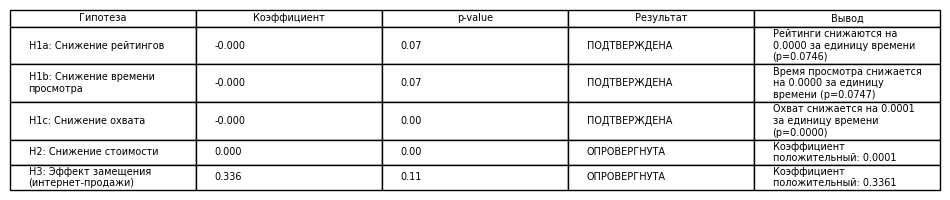

In [77]:
import textwrap

results_df = pd.DataFrame(results_summary)

for col in results_df.columns:
    if results_df[col].dtype in ['float64', 'float32']:
        if 'p' in col.lower() or 'p-value' in col.lower():
            results_df[col] = results_df[col].apply(lambda x: f'{x:.2f}')
        elif 'коэф' in col or 'коэффициент' in col.lower():
            results_df[col] = results_df[col].apply(lambda x: f'{x:.3f}')
        else:
            results_df[col] = results_df[col].apply(lambda x: round(x, 3))


def wrap_text(text, width=20):
    if isinstance(text, str) and len(text) > width:
        return '\n'.join(textwrap.wrap(text, width=width))
    return str(text)


wrapped_data = []
for i in range(len(results_df)):
    row = []
    for col in results_df.columns:
        row.append(wrap_text(str(results_df.iloc[i][col]), width=25))
    wrapped_data.append(row)

wrapped_headers = [wrap_text(str(col), width=25) for col in results_df.columns]

max_lines_per_row = [max(cell.count('\n') + 1 for cell in row) for row in wrapped_data]
row_heights = [0.1 * max(1, lines * 0.8) for lines in max_lines_per_row]

fig_height = sum(row_heights) + 0.5  + 0.5  

fig, ax = plt.subplots(figsize=(12, fig_height))
ax.axis('tight')
ax.axis('off')

table = ax.table(cellText=wrapped_data,
                 colLabels=wrapped_headers,
                 cellLoc='left',
                 loc='center',
                 colWidths=[0.2] * len(results_df.columns))

for (row, col), cell in table.get_celld().items():
    if row > 0:
        cell.set_height(row_heights[row-1])

    cell.set_text_props(va='center')

    text = cell.get_text().get_text()
    if text.count('\n') > 1:
        cell.set_fontsize(8)
    else:
        cell.set_fontsize(10)

plt.savefig('graph35.png', dpi=300, bbox_inches='tight', pad_inches=0.3)

## Тесты на выборках по группам поставщиков

In [78]:
df_russian = df_panel[df_panel['Advertiser_type'] == 1].copy()
df_foreign = df_panel[df_panel['Advertiser_type'] == 0].copy()

print(f"Российские рекламодатели: {len(df_russian)} наблюдений ({len(df_russian)/len(df_panel)*100:.1f}%)")
print(f"Зарубежные рекламодатели: {len(df_foreign)} наблюдений ({len(df_foreign)/len(df_panel)*100:.1f}%)")

Российские рекламодатели: 5392 наблюдений (64.2%)
Зарубежные рекламодатели: 3010 наблюдений (35.8%)


Сравнительная статистика по группам:
              Российские  Зарубежные   Разница
ln_RTG          3.580521    3.750979 -0.170458
ln_ATV         -1.024654   -0.854189 -0.170465
ln_AvReach     -1.096936   -1.101490  0.004554
ln_CostByGRP   15.011470   15.161464 -0.149993


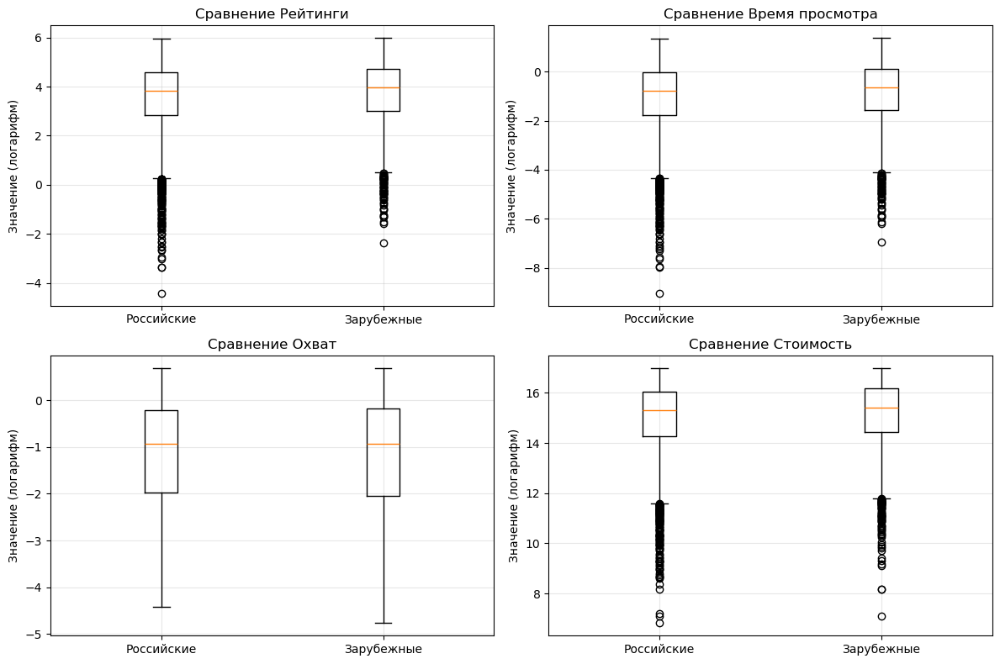

In [79]:
comparison_stats = pd.DataFrame({
    'Российские': df_russian[['ln_RTG', 'ln_ATV', 'ln_AvReach', 'ln_CostByGRP']].mean(),
    'Зарубежные': df_foreign[['ln_RTG', 'ln_ATV', 'ln_AvReach', 'ln_CostByGRP']].mean(),
    'Разница': df_russian[['ln_RTG', 'ln_ATV', 'ln_AvReach', 'ln_CostByGRP']].mean() - 
               df_foreign[['ln_RTG', 'ln_ATV', 'ln_AvReach', 'ln_CostByGRP']].mean()
})

print("Сравнительная статистика по группам:")
print(comparison_stats)

fig, axes = plt.subplots(2, 2, figsize=(12, 8))
metrics = ['ln_RTG', 'ln_ATV', 'ln_AvReach', 'ln_CostByGRP']
titles = ['Рейтинги', 'Время просмотра', 'Охват', 'Стоимость']

for idx, (ax, metric, title) in enumerate(zip(axes.flatten(), metrics, titles)):
    data_to_plot = []
    data_to_plot.append(df_russian[metric].dropna().values)
    data_to_plot.append(df_foreign[metric].dropna().values)
    
    ax.boxplot(data_to_plot, labels=['Российские', 'Зарубежные'])
    ax.set_title(f'Сравнение {title}')
    ax.set_ylabel('Значение (логарифм)')
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('graph36.png', dpi=300, bbox_inches='tight')
plt.show()

In [80]:
results = []

print("H1a: СНИЖЕНИЕ ТЕЛЕВИЗИОННЫХ РЕЙТИНГОВ")

model_h1a_rus = PanelOLS.from_formula(
    'ln_RTG ~ Time + HalfYear_1 + COVID_dummy + ln_InternetPenetration + EntityEffects',
    data=df_russian
).fit(cov_type='clustered', cluster_entity=True)

coef_time_rus = model_h1a_rus.params['Time']
pval_time_rus = model_h1a_rus.pvalues['Time']
print(f"Российские: Коэф. = {coef_time_rus:.6f}, p = {pval_time_rus:.6f}")

model_h1a_for = PanelOLS.from_formula(
    'ln_RTG ~ Time + HalfYear_1 + COVID_dummy + ln_InternetPenetration + EntityEffects',
    data=df_foreign
).fit(cov_type='clustered', cluster_entity=True)

coef_time_for = model_h1a_for.params['Time']
pval_time_for = model_h1a_for.pvalues['Time']
print(f"Зарубежные: Коэф. = {coef_time_for:.6f}, p = {pval_time_for:.6f}")

alpha = 0.10

if coef_time_rus < 0 and pval_time_rus < alpha:
    print(f"Для российских брендов: ГИПОТЕЗА H1a ПОДТВЕРЖДЕНА")
    print(f"Обнаружено статистически значимое снижение рейтингов во времени")
    h1a_conclusion_rus = f"Рейтинги снижаются на {abs(coef_time_rus):.4f} за единицу времени (p={pval_time_rus:.4f})"
elif coef_time_rus < 0 and pval_time_rus >= alpha:
    print(f"Для российских брендов: ГИПОТЕЗА H1a НЕ ПОДТВЕРЖДЕНА")
    print(f"Отрицательный тренд есть, но статистически незначим (p={pval_time_rus:.4f} > α={alpha})")
    h1a_conclusion_rus = "Отрицательный тренд незначим"
else:
    print(f"Для российских брендов: ГИПОТЕЗА H1a ОПРОВЕРГНУТА")
    print(f"Обнаружен положительный или нулевой тренд")
    h1a_conclusion_rus = f"Коэффициент положительный: {coef_time_rus:.4f}"

if coef_time_for < 0 and pval_time_for < alpha:
    print(f"Для зарубежных брендов: ГИПОТЕЗА H1a ПОДТВЕРЖДЕНА")
    print(f"Обнаружено статистически значимое снижение рейтингов во времени")
    h1a_conclusion_for = f"Рейтинги снижаются на {abs(coef_time_for):.4f} за единицу времени (p={pval_time_for:.4f})"
elif coef_time_for < 0 and pval_time_for >= alpha:
    print(f"Для зарубежных брендов: ГИПОТЕЗА H1a НЕ ПОДТВЕРЖДЕНА")
    print(f"Отрицательный тренд есть, но статистически незначим (p={pval_time_for:.4f} > α={alpha})")
    h1a_conclusion_for = "Отрицательный тренд незначим"
else:
    print(f"Для зарубежных брендов: ГИПОТЕЗА H1a ОПРОВЕРГНУТА")
    print(f"Обнаружен положительный или нулевой тренд")
    h1a_conclusion_for = f"Коэффициент положительный: {coef_time_for:.4f}"

results.append({    
    'Гипотеза': 'H1a: Снижение рейтингов',
    'Группа': 'Российские',
    'Коэффициент': coef_time_rus,
    'p-value': pval_time_rus,
    'Значимость': 'Да' if pval_time_rus < alpha else 'Нет',
    'Направление': 'Отрицательный' if coef_time_rus < 0 else 'Положительный',
    'Вывод': h1a_conclusion_rus
})

results.append({
    'Гипотеза': 'H1a: Снижение рейтингов',
    'Группа': 'Зарубежные',
    'Коэффициент': coef_time_for,
    'p-value': pval_time_for,
    'Значимость': 'Да' if pval_time_for < alpha else 'Нет',
    'Направление': 'Отрицательный' if coef_time_for < 0 else 'Положительный',
    'Вывод': h1a_conclusion_for
})

H1a: СНИЖЕНИЕ ТЕЛЕВИЗИОННЫХ РЕЙТИНГОВ
Российские: Коэф. = -0.000009, p = 0.584427
Зарубежные: Коэф. = -0.000061, p = 0.028131
Для российских брендов: ГИПОТЕЗА H1a НЕ ПОДТВЕРЖДЕНА
Отрицательный тренд есть, но статистически незначим (p=0.5844 > α=0.1)
Для зарубежных брендов: ГИПОТЕЗА H1a ПОДТВЕРЖДЕНА
Обнаружено статистически значимое снижение рейтингов во времени


In [81]:
print("H1b: СОКРАЩЕНИЕ СРЕДНЕГО ВРЕМЕНИ ПРОСМОТРА")

model_h1b_rus = PanelOLS.from_formula(
    'ln_ATV ~ Time + HalfYear_1 + COVID_dummy + ln_InternetPenetration + EntityEffects',
    data=df_russian
).fit(cov_type='clustered', cluster_entity=True)

coef_time_h1b_rus = model_h1b_rus.params['Time']
pval_time_h1b_rus = model_h1b_rus.pvalues['Time']
print(f"Российские: Коэф. = {coef_time_h1b_rus:.6f}, p = {pval_time_h1b_rus:.6f}")

model_h1b_for = PanelOLS.from_formula(
    'ln_ATV ~ Time + HalfYear_1 + COVID_dummy + ln_InternetPenetration + EntityEffects',
    data=df_foreign
).fit(cov_type='clustered', cluster_entity=True)

coef_time_h1b_for = model_h1b_for.params['Time']
pval_time_h1b_for = model_h1b_for.pvalues['Time']
print(f"Зарубежные: Коэф. = {coef_time_h1b_for:.6f}, p = {pval_time_h1b_for:.6f}")

alpha = 0.10

if coef_time_h1b_rus < 0 and pval_time_h1b_rus < alpha:
    print(f"Для российских брендов: ГИПОТЕЗА H1b ПОДТВЕРЖДЕНА")
    print(f"Обнаружено статистически значимое снижение среднего времени просмотра")
    h1b_conclusion_rus = f"Время просмотра снижается на {abs(coef_time_h1b_rus):.4f} за единицу времени (p={pval_time_h1b_rus:.4f})"
elif coef_time_h1b_rus < 0 and pval_time_h1b_rus >= alpha:
    print(f"Для российских брендов: ГИПОТЕЗА H1b НЕ ПОДТВЕРЖДЕНА")
    print(f" Отрицательный тренд есть, но статистически незначим (p={pval_time_h1b_rus:.4f} > α={alpha})")
    h1b_conclusion_rus = f"Отрицательный тренд незначим (p={pval_time_h1b_rus:.4f})"
else:
    print(f"Для российских брендов: ГИПОТЕЗА H1b ОПРОВЕРГНУТА")
    print(f"Обнаружен положительный или нулевой тренд")
    h1b_conclusion_rus = f"Коэффициент положительный: {coef_time_h1b_rus:.4f} (p={pval_time_h1b_rus:.4f})"

if coef_time_h1b_for < 0 and pval_time_h1b_for < alpha:
    print(f"Для зарубежных брендов: ГИПОТЕЗА H1b ПОДТВЕРЖДЕНА")
    print(f"Обнаружено статистически значимое снижение среднего времени просмотра")
    h1b_conclusion_for = f"Время просмотра снижается на {abs(coef_time_h1b_for):.4f} за единицу времени (p={pval_time_h1b_for:.4f})"
elif coef_time_h1b_for < 0 and pval_time_h1b_for >= alpha:
    print(f"Для зарубежных брендов: ГИПОТЕЗА H1b НЕ ПОДТВЕРЖДЕНА")
    print(f"Отрицательный тренд есть, но статистически незначим (p={pval_time_h1b_for:.4f} > α={alpha})")
    h1b_conclusion_for = f"Отрицательный тренд незначим (p={pval_time_h1b_for:.4f})"
else:
    print(f"Для зарубежных брендов: ГИПОТЕЗА H1b ОПРОВЕРГНУТА")
    print(f"Обнаружен положительный или нулевой тренд")
    h1b_conclusion_for = f"Коэффициент положительный: {coef_time_h1b_for:.4f} (p={pval_time_h1b_for:.4f})"

results.append({
    'Гипотеза': 'H1b: Снижение времени просмотра',
    'Группа': 'Российские',
    'Коэффициент': coef_time_h1b_rus,
    'p-value': pval_time_h1b_rus,
    'Значимость': 'Да' if pval_time_h1b_rus < alpha else 'Нет',
    'Направление': 'Отрицательный' if coef_time_h1b_rus < 0 else 'Положительный',
    'Вывод': h1b_conclusion_rus
})

results.append({
    'Гипотеза': 'H1b: Снижение времени просмотра',
    'Группа': 'Зарубежные',
    'Коэффициент': coef_time_h1b_for,
    'p-value': pval_time_h1b_for,
    'Значимость': 'Да' if pval_time_h1b_for < alpha else 'Нет',
    'Направление': 'Отрицательный' if coef_time_h1b_for < 0 else 'Положительный',
    'Вывод': h1b_conclusion_for
})

H1b: СОКРАЩЕНИЕ СРЕДНЕГО ВРЕМЕНИ ПРОСМОТРА
Российские: Коэф. = -0.000009, p = 0.584451
Зарубежные: Коэф. = -0.000061, p = 0.028144
Для российских брендов: ГИПОТЕЗА H1b НЕ ПОДТВЕРЖДЕНА
 Отрицательный тренд есть, но статистически незначим (p=0.5845 > α=0.1)
Для зарубежных брендов: ГИПОТЕЗА H1b ПОДТВЕРЖДЕНА
Обнаружено статистически значимое снижение среднего времени просмотра


In [82]:
print("H1c: СНИЖЕНИЕ ОХВАТА ТЕЛЕВИЗИОННОЙ АУДИТОРИИ")

model_h1c_rus = PanelOLS.from_formula(
    'ln_AvReach ~ Time + HalfYear_1 + COVID_dummy + ln_InternetPenetration + EntityEffects',
    data=df_russian
).fit(cov_type='clustered', cluster_entity=True)

coef_time_h1c_rus = model_h1c_rus.params['Time']
pval_time_h1c_rus = model_h1c_rus.pvalues['Time']
print(f"Российские: Коэф. = {coef_time_h1c_rus:.6f}, p = {pval_time_h1c_rus:.6f}")

model_h1c_for = PanelOLS.from_formula(
    'ln_AvReach ~ Time + HalfYear_1 + COVID_dummy + ln_InternetPenetration + EntityEffects',
    data=df_foreign
).fit(cov_type='clustered', cluster_entity=True)

coef_time_h1c_for = model_h1c_for.params['Time']
pval_time_h1c_for = model_h1c_for.pvalues['Time']
print(f"Зарубежные: Коэф. = {coef_time_h1c_for:.6f}, p = {pval_time_h1c_for:.6f}")

alpha = 0.10

if coef_time_h1c_rus < 0 and pval_time_h1c_rus < alpha:
    print(f"Для российских брендов: ГИПОТЕЗА H1c ПОДТВЕРЖДЕНА")
    print(f"Обнаружено статистически значимое снижение охвата аудитории")
    h1c_conclusion_rus = f"Охват снижается на {abs(coef_time_h1c_rus):.4f} за единицу времени (p={pval_time_h1c_rus:.4f})"
elif coef_time_h1c_rus < 0 and pval_time_h1c_rus >= alpha:
    print(f"Для российских брендов: ГИПОТЕЗА H1c НЕ ПОДТВЕРЖДЕНА")
    print(f"Отрицательный тренд есть, но статистически незначим (p={pval_time_h1c_rus:.4f} > α={alpha})")
    h1c_conclusion_rus = f"Отрицательный тренд незначим (p={pval_time_h1c_rus:.4f})"
else:
    print(f"Для российских брендов: ГИПОТЕЗА H1c ОПРОВЕРГНУТА")
    print(f"Обнаружен положительный или нулевой тренд")
    h1c_conclusion_rus = f"Коэффициент положительный: {coef_time_h1c_rus:.4f} (p={pval_time_h1c_rus:.4f})"

if coef_time_h1c_for < 0 and pval_time_h1c_for < alpha:
    print(f"Для зарубежных брендов: ГИПОТЕЗА H1c ПОДТВЕРЖДЕНА")
    print(f"Обнаружено статистически значимое снижение охвата аудитории")
    h1c_conclusion_for = f"Охват снижается на {abs(coef_time_h1c_for):.4f} за единицу времени (p={pval_time_h1c_for:.4f})"
elif coef_time_h1c_for < 0 and pval_time_h1c_for >= alpha:
    print(f"Для зарубежных брендов: ГИПОТЕЗА H1c НЕ ПОДТВЕРЖДЕНА")
    print(f"Отрицательный тренд есть, но статистически незначим (p={pval_time_h1c_for:.4f} > α={alpha})")
    h1c_conclusion_for = f"Отрицательный тренд незначим (p={pval_time_h1c_for:.4f})"
else:
    print(f"Для зарубежных брендов: ГИПОТЕЗА H1c ОПРОВЕРГНУТА")
    print(f"Обнаружен положительный или нулевой тренд")
    h1c_conclusion_for = f"Коэффициент положительный: {coef_time_h1c_for:.4f} (p={pval_time_h1c_for:.4f})"
    
results.append({
    'Гипотеза': 'H1c: Снижение охвата',
    'Группа': 'Российские',
    'Коэффициент': coef_time_h1c_rus,
    'p-value': pval_time_h1c_rus,
    'Значимость': 'Да' if pval_time_h1c_rus < alpha else 'Нет',
    'Направление': 'Отрицательный' if coef_time_h1c_rus < 0 else 'Положительный',
    'Вывод': h1c_conclusion_rus
})

results.append({
    'Гипотеза': 'H1c: Снижение охвата',
    'Группа': 'Зарубежные',
    'Коэффициент': coef_time_h1c_for,
    'p-value': pval_time_h1c_for,
    'Значимость': 'Да' if pval_time_h1c_for < alpha else 'Нет',
    'Направление': 'Отрицательный' if coef_time_h1c_for < 0 else 'Положительный',
    'Вывод': h1c_conclusion_for
})

H1c: СНИЖЕНИЕ ОХВАТА ТЕЛЕВИЗИОННОЙ АУДИТОРИИ
Российские: Коэф. = -0.000050, p = 0.000273
Зарубежные: Коэф. = -0.000064, p = 0.000001
Для российских брендов: ГИПОТЕЗА H1c ПОДТВЕРЖДЕНА
Обнаружено статистически значимое снижение охвата аудитории
Для зарубежных брендов: ГИПОТЕЗА H1c ПОДТВЕРЖДЕНА
Обнаружено статистически значимое снижение охвата аудитории


In [83]:
print("H2: СНИЖЕНИЕ ЭКОНОМИЧЕСКОЙ ЭФФЕКТИВНОСТИ ТЕЛЕВИЗИОННОЙ РЕКЛАМЫ")

model_h2_rus = PanelOLS.from_formula(
    'ln_CostByGRP ~ Time + ln_RTG + ln_GDP + EntityEffects',
    data=df_russian
).fit(cov_type='clustered', cluster_entity=True)

coef_time_rus = model_h2_rus.params['Time']
pval_time_rus = model_h2_rus.pvalues['Time']
print(f"Российские: Коэф. = {coef_time_rus:.6f}, p = {pval_time_rus:.6f}")

model_h2_for = PanelOLS.from_formula(
    'ln_CostByGRP ~ Time +  ln_RTG + ln_GDP + EntityEffects',
    data=df_foreign
).fit(cov_type='clustered', cluster_entity=True)

coef_time_for = model_h2_for.params['Time']
pval_time_for = model_h2_for.pvalues['Time']
print(f"Зарубежные: Коэф. = {coef_time_for:.6f}, p = {pval_time_for:.6f}")

alpha = 0.10

if coef_time_rus < 0 and pval_time_rus < alpha:
    print(f"Для российских брендов: ГИПОТЕЗА H2 ПОДТВЕРЖДЕНА")
    print(f"Обнаружено статистически значимое снижение стоимости GRP во времени")
    h2_conclusion_rus = f"Стоимость снижается на {abs(coef_time_rus):.4f} за единицу времени (p={pval_time_rus:.4f})"
else:
    print(f"Для российских брендов: ГИПОТЕЗА H2 НЕ ПОДТВЕРЖДЕНА")
    print(f"Отрицательный тренд есть, но статистически незначим (p={pval_time_rus:.4f} > α={alpha})")
    h2_conclusion_rus = f"Отрицательный тренд незначим (p={pval_time_rus:.4f})"


if coef_time_for < 0 and pval_time_for < alpha:
    print(f"Для зарубежных брендов: ГИПОТЕЗА H2 ПОДТВЕРЖДЕНА")
    print(f"Обнаружено статистически значимое снижение стоимости GRP во времени")
    h2_conclusion_for = f"Стоимость снижается на {abs(coef_time_rus):.4f} за единицу времени (p={pval_time_rus:.4f})"
else:
    print(f"Для иностранных брендов: ГИПОТЕЗА H2 НЕ ПОДТВЕРЖДЕНА")
    print(f"Отрицательный тренд есть, но статистически незначим (p={pval_time_rus:.4f} > α={alpha})")
    h2_conclusion_for = f"Отрицательный тренд незначим (p={pval_time_rus:.4f})"  
    



results.append({
    'Гипотеза': 'H2: Снижение стоимости GRP',
    'Группа': 'Российские',
    'Коэффициент': coef_time_rus,
    'p-value': pval_time_rus,
    'Значимость': 'Да' if pval_time_rus < alpha else 'Нет',
    'Направление': 'Отрицательный' if coef_time_rus < 0 else 'Положительный',
    'Вывод': h2_conclusion_rus
})

results.append({
    'Гипотеза': 'H2: Снижение стоимости GRP',
    'Группа': 'Зарубежные',
    'Коэффициент': coef_time_for,
    'p-value': pval_time_for,
    'Значимость': 'Да' if pval_time_for < alpha else 'Нет',
    'Направление': 'Отрицательный' if coef_time_for < 0 else 'Положительный',
    'Вывод': h2_conclusion_for
})

H2: СНИЖЕНИЕ ЭКОНОМИЧЕСКОЙ ЭФФЕКТИВНОСТИ ТЕЛЕВИЗИОННОЙ РЕКЛАМЫ
Российские: Коэф. = 0.000107, p = 0.000000
Зарубежные: Коэф. = 0.000118, p = 0.000000
Для российских брендов: ГИПОТЕЗА H2 НЕ ПОДТВЕРЖДЕНА
Отрицательный тренд есть, но статистически незначим (p=0.0000 > α=0.1)
Для иностранных брендов: ГИПОТЕЗА H2 НЕ ПОДТВЕРЖДЕНА
Отрицательный тренд есть, но статистически незначим (p=0.0000 > α=0.1)


In [84]:
print("H3: ОТРИЦАТЕЛЬНАЯ СВЯЗЬ С ИНТЕРНЕТ-ПРОДАЖАМИ")

model_h3a_rus = PanelOLS.from_formula(
    'ln_CostByGRP ~ ln_Internet_sales + ln_GDP + Time + ln_RTG + EntityEffects',
    data=df_russian
).fit(cov_type='clustered', cluster_entity=True)

coef_internet_rus = model_h3a_rus.params['ln_Internet_sales']
pval_internet_rus = model_h3a_rus.pvalues['ln_Internet_sales']
print(f"Российские: Коэф. = {coef_internet_rus:.6f}, p = {pval_internet_rus:.6f}")

model_h3a_for = PanelOLS.from_formula(
    'ln_CostByGRP ~ ln_Internet_sales + ln_GDP + Time + ln_RTG + EntityEffects',
    data=df_foreign
).fit(cov_type='clustered', cluster_entity=True)

coef_internet_for = model_h3a_for.params['ln_Internet_sales']
pval_internet_for = model_h3a_for.pvalues['ln_Internet_sales']
print(f"Зарубежные: Коэф. = {coef_internet_for:.6f}, p = {pval_internet_for:.6f}")

alpha = 0.10

if coef_internet_rus < 0 and pval_internet_rus < alpha:
    print(f"Для российских брендов: ГИПОТЕЗА H3a ПОДТВЕРЖДЕНА")
    print(f"Обнаружена статистически значимая отрицательная связь")
    print(f"Рост интернет-продаж связан со снижением стоимости рекламы")
    h3a_conclusion_rus = f"Стоимость снижается на {abs(coef_internet_rus):.4f} при росте интернет-продаж на 1% (p={pval_internet_rus:.4f})"
elif coef_internet_rus < 0 and pval_internet_rus >= alpha:
    print(f"Для российских брендов: ГИПОТЕЗА H3a НЕ ПОДТВЕРЖДЕНА")
    print(f"Отрицательная связь есть, но статистически незначима (p={pval_internet_rus:.4f} > α={alpha})")
    h3a_conclusion_rus = f"Отрицательная связь незначима (p={pval_internet_rus:.4f})"
elif coef_internet_rus > 0 and pval_internet_rus < alpha:
    print(f"Для российских брендов: ГИПОТЕЗА H3a ОПРОВЕРГНУТА")
    print(f"Обнаружена статистически значимая положительная связь")
    print(f"Рост интернет-продаж связан с ростом стоимости рекламы")
    h3a_conclusion_rus = f"Положительная связь: рост на {coef_internet_rus:.4f} при росте интернет-продаж на 1% (p={pval_internet_rus:.4f})"
else:
    print(f"Для российских брендов: ГИПОТЕЗА H3a НЕ ПОДТВЕРЖДЕНА")
    print(f"Связь не обнаружена или незначима")
    h3a_conclusion_rus = f"Связь незначима (p={pval_internet_rus:.4f})"

if coef_internet_for < 0 and pval_internet_for < alpha:
    print(f"Для зарубежных брендов: ГИПОТЕЗА H3a ПОДТВЕРЖДЕНА")
    print(f"Обнаружена статистически значимая отрицательная связь")
    print(f"Рост интернет-продаж связан со снижением стоимости рекламы")
    h3a_conclusion_for = f"Стоимость снижается на {abs(coef_internet_for):.4f} при росте интернет-продаж на 1% (p={pval_internet_for:.4f})"
elif coef_internet_for < 0 and pval_internet_for >= alpha:
    print(f"Для зарубежных брендов: ГИПОТЕЗА H3a НЕ ПОДТВЕРЖДЕНА")
    print(f"Отрицательная связь есть, но статистически незначима (p={pval_internet_for:.4f} > α={alpha})")
    h3a_conclusion_for = f"Отрицательная связь незначима (p={pval_internet_for:.4f})"
elif coef_internet_for > 0 and pval_internet_for < alpha:
    print(f"Для зарубежных брендов: ГИПОТЕЗА H3a ОПРОВЕРГНУТА")
    print(f"Обнаружена статистически значимая положительная связь")
    print(f"Рост интернет-продаж связан с ростом стоимости рекламы")
    h3a_conclusion_for = f"Положительная связь: рост на {coef_internet_for:.4f} при росте интернет-продаж на 1% (p={pval_internet_for:.4f})"
else:
    print(f"Для зарубежных брендов: ГИПОТЕЗА H3a НЕ ПОДТВЕРЖДЕНА")
    print(f"Связь не обнаружена или незначима")
    h3a_conclusion_for = f"Связь незначима (p={pval_internet_for:.4f})"

results.append({
    'Гипотеза': 'H3: Эффект замещения',
    'Группа': 'Российские',
    'Коэффициент': coef_internet_rus,
    'p-value': pval_internet_rus,
    'Значимость': 'Да' if pval_internet_rus < alpha else 'Нет',
    'Направление': 'Отрицательный' if coef_internet_rus < 0 else 'Положительный',
    'Вывод': h3a_conclusion_rus
})

results.append({
    'Гипотеза': 'H3: Эффект замещения',
    'Группа': 'Зарубежные',
    'Коэффициент': coef_internet_for,
    'p-value': pval_internet_for,
    'Значимость': 'Да' if pval_internet_for < alpha else 'Нет',
    'Направление': 'Отрицательный' if coef_internet_for < 0 else 'Положительный',
    'Вывод': h3a_conclusion_for
})

H3: ОТРИЦАТЕЛЬНАЯ СВЯЗЬ С ИНТЕРНЕТ-ПРОДАЖАМИ
Российские: Коэф. = 0.541937, p = 0.036518
Зарубежные: Коэф. = 0.043013, p = 0.838290
Для российских брендов: ГИПОТЕЗА H3a ОПРОВЕРГНУТА
Обнаружена статистически значимая положительная связь
Рост интернет-продаж связан с ростом стоимости рекламы
Для зарубежных брендов: ГИПОТЕЗА H3a НЕ ПОДТВЕРЖДЕНА
Связь не обнаружена или незначима


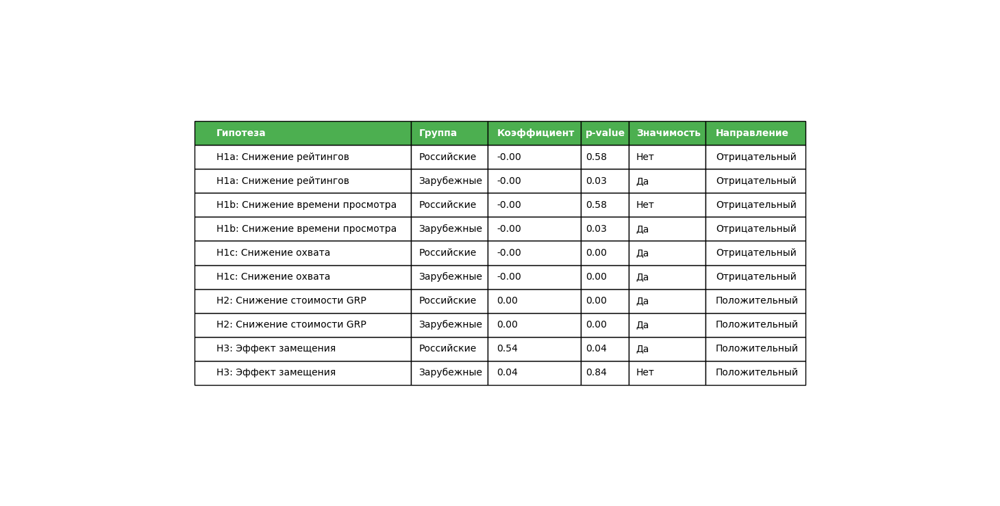

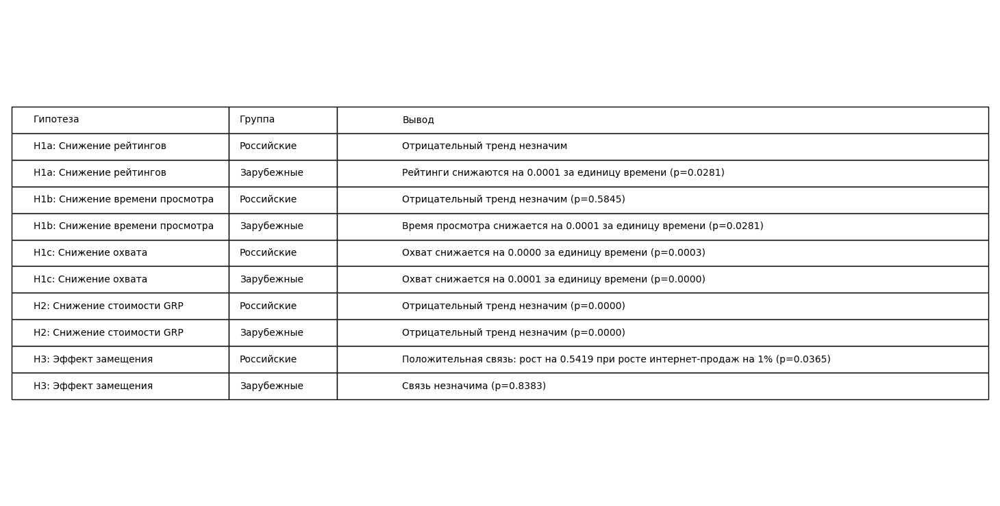

In [85]:
main_columns = ['Гипотеза', 'Группа', 'Коэффициент', 'p-value', 'Значимость', 'Направление']
main_df = pd.DataFrame([{k: r[k] for k in main_columns if k in r} for r in results])

conclusion_columns = ['Гипотеза', 'Группа', 'Вывод']
conclusion_df = pd.DataFrame([{k: r[k] for k in conclusion_columns if k in r} for r in results])


if 'Коэффициент' in main_df.columns:
    main_df['Коэффициент'] = main_df['Коэффициент'].apply(
        lambda x: f"{float(x):.2f}" if pd.notnull(x) else "N/A"  
    )

if 'p-value' in main_df.columns:
    main_df['p-value'] = main_df['p-value'].apply(
        lambda x: f"{float(x):.2f}" if pd.notnull(x) else "N/A" 
    )

fig1, ax1 = plt.subplots(figsize=(16, max(8, len(main_df) * 0.5 + 2))) 
ax1.axis('tight')
ax1.axis('off')

table1 = ax1.table(
    cellText=[main_df.columns.tolist()] + main_df.values.tolist(),
    cellLoc='left',  
    loc='center'
)

table1.auto_set_font_size(False)
table1.set_fontsize(10)  
table1.scale(1.1, 1.8)  

if len(main_df.columns) == 6:
    col_widths = [0.25, 0.1, 0.12, 0.12, 0.15, 0.12] 
    for i, width in enumerate(col_widths):
        table1.auto_set_column_width(i)
else:
    
    table1.auto_set_column_width(col=list(range(len(main_df.columns))))

for j in range(len(main_df.columns)):
    table1[(0, j)].set_facecolor('#4CAF50')
    table1[(0, j)].set_text_props(weight='bold', color='white')

for i in range(1, len(main_df) + 1):
    table1[(i, 0)].get_text().set_wrap(True) 

plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)
plt.savefig('graph37.png', dpi=300, bbox_inches='tight')

fig2, ax2 = plt.subplots(figsize=(16, max(8, len(conclusion_df) * 0.6 + 2))) 
ax2.axis('tight')
ax2.axis('off')

table2 = ax2.table(
    cellText=[conclusion_df.columns.tolist()] + conclusion_df.values.tolist(),
    cellLoc='left',
    loc='center',
    colWidths=[0.2, 0.1, 0.6]  
)

table2.auto_set_font_size(False)
table2.set_fontsize(10)
table2.scale(1.1, 2.0) 

for i in range(1, len(conclusion_df) + 1):
    text = table2[(i, 2)].get_text()
    text.set_wrap(True)  
    
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)
plt.savefig('graph38.png', dpi=300, bbox_inches='tight')

## Тесты на робастность гиотпезы

In [86]:
robustness_results = []

In [87]:
Y = df_new['ln_RTG']
X_base = df_new[['Time', 'HalfYear_1', 'COVID_dummy', 'ln_InternetPenetration', 'Advertiser_type']]
X_base = sm.add_constant(X_base)

# Базовая модель
model_base = sm.OLS(Y, X_base).fit()
coef_base = model_base.params['Time']
pval_base = model_base.pvalues['Time']
print(f"   Базовая модель:")
print(f"   Коэффициент при Time: {coef_base:.6f}")
print(f"   p-value: {pval_base:.4f}")
print(f"   Значимость (α=0.1): {'Да' if pval_base < 0.1 else 'Нет'}\n")

# Без InternetPenetration 
X_no_internet = X_base[['const', 'Time', 'HalfYear_1', 'COVID_dummy', 'Advertiser_type']]
model_no_internet = sm.OLS(Y, X_no_internet).fit()
coef_no_internet = model_no_internet.params['Time']
pval_no_internet = model_no_internet.pvalues['Time']
print(f"   Без InternetPenetration:")
print(f"   Коэффициент: {coef_no_internet:.6f}, p = {pval_no_internet:.4f}")

# Без COVID_dummy
X_no_covid = X_base[['const', 'Time', 'HalfYear_1', 'ln_InternetPenetration', 'Advertiser_type']]
model_no_covid = sm.OLS(Y, X_no_covid).fit()
coef_no_covid = model_no_covid.params['Time']
pval_no_covid = model_no_covid.pvalues['Time']
print(f"   Без COVID_dummy:")
print(f"   Коэффициент: {coef_no_covid:.6f}, p = {pval_no_covid:.4f}")

# Проверка мультиколлинеарности (VIF)
from statsmodels.stats.outliers_influence import variance_inflation_factor
X_vif = X_base.drop(columns=['const'])
vif_data = pd.DataFrame()
vif_data["Переменная"] = X_vif.columns
vif_data["VIF"] = [variance_inflation_factor(X_vif.values, i) for i in range(X_vif.shape[1])]
max_vif = vif_data["VIF"].max()
print(f"\n Максимальный VIF: {max_vif:.2f}")

sign_stable = all([
    coef_base < 0,
    coef_no_internet < 0,
    coef_no_covid < 0,
])

any_significant = any([
    pval_base < 0.10,
    pval_no_internet < 0.10,
    pval_no_covid < 0.10,
])

vif_ok = (max_vif < 5)

if sign_stable and any_significant and vif_ok:
    robust_status = "Да"
else:
    reasons = []
    if not sign_stable:
        reasons.append("знак нестабилен")
    if not any_significant:
        reasons.append("нет значимости")
    if not vif_ok:
        reasons.append("VIF ≥ 5")
    robust_status = "Частично (" + ", ".join(reasons) + ")"

print("ВЫВОД ПО РОБАСТНОСТИ:")
if robust_status == "Да":
    print("     Результат по H1a является РОБАСТНЫМ:")
    print("   - Знак коэффициента устойчив (всегда отрицательный)")
    print("   - Есть статистическая значимость хотя бы в одной модели (α=0.1)")
    print("   - Мультиколлинеарность отсутствует (VIF < 5)")
else:
    print("    Результат частично робастен:")
    if not sign_stable:
        print("   - Знак коэффициента нестабилен")
    if not any_significant:
        print("   - Значимость отсутствует во всех моделях (α=0.1)")
    if not vif_ok:
        print("   - Обнаружена мультиколлинеарность (VIF ≥ 5)")

robustness_results.append({
    'Гипотеза': "H1a (снижение рейтингов)",
    'Базовая (коэф.)': round(coef_base, 6),
    'Базовая (p)': round(pval_base, 4),
    'Без Internet (коэф.)': round(coef_no_internet, 6),
    'Без Internet (p)': round(pval_no_internet, 4),
    'Без COVID (коэф.)': round(coef_no_covid, 6),
    'Без COVID (p)': round(pval_no_covid, 4),
    'Макс. VIF': round(max_vif, 2),
    'Робастна?': robust_status  
})

   Базовая модель:
   Коэффициент при Time: -0.000126
   p-value: 0.0000
   Значимость (α=0.1): Да

   Без InternetPenetration:
   Коэффициент: -0.000087, p = 0.0000
   Без COVID_dummy:
   Коэффициент: -0.000074, p = 0.0000

 Максимальный VIF: 46.27
ВЫВОД ПО РОБАСТНОСТИ:
    Результат частично робастен:
   - Обнаружена мультиколлинеарность (VIF ≥ 5)


In [88]:
Y = df_new['ln_ATV']
X_base = df_new[['Time', 'HalfYear_1', 'COVID_dummy', 'ln_InternetPenetration', 'Advertiser_type']]
X_base = sm.add_constant(X_base)

# Базовая модель
model_base = sm.OLS(Y, X_base).fit()
coef_base = model_base.params['Time']
pval_base = model_base.pvalues['Time']
print(f"   Базовая модель:")
print(f"   Коэффициент при Time: {coef_base:.6f}")
print(f"   p-value: {pval_base:.4f}")
print(f"   Значимость (α=0.1): {'Да' if pval_base < 0.1 else 'Нет'}\n")

# Без InternetPenetration 
X_no_internet = X_base[['const', 'Time', 'HalfYear_1', 'COVID_dummy', 'Advertiser_type']]
model_no_internet = sm.OLS(Y, X_no_internet).fit()
coef_no_internet = model_no_internet.params['Time']
pval_no_internet = model_no_internet.pvalues['Time']
print(f"   Без InternetPenetration:")
print(f"   Коэффициент: {coef_no_internet:.6f}, p = {pval_no_internet:.4f}")

# Без COVID_dummy
X_no_covid = X_base[['const', 'Time', 'HalfYear_1', 'ln_InternetPenetration', 'Advertiser_type']]
model_no_covid = sm.OLS(Y, X_no_covid).fit()
coef_no_covid = model_no_covid.params['Time']
pval_no_covid = model_no_covid.pvalues['Time']
print(f"   Без COVID_dummy:")
print(f"   Коэффициент: {coef_no_covid:.6f}, p = {pval_no_covid:.4f}")

# Проверка мультиколлинеарности (VIF)
from statsmodels.stats.outliers_influence import variance_inflation_factor
X_vif = X_base.drop(columns=['const'])
vif_data = pd.DataFrame()
vif_data["Переменная"] = X_vif.columns
vif_data["VIF"] = [variance_inflation_factor(X_vif.values, i) for i in range(X_vif.shape[1])]
max_vif = vif_data["VIF"].max()
print(f"\n Максимальный VIF: {max_vif:.2f}")

sign_stable = all([
    coef_base < 0,
    coef_no_internet < 0,
    coef_no_covid < 0,
])

any_significant = any([
    pval_base < 0.10,
    pval_no_internet < 0.10,
    pval_no_covid < 0.10,
])

vif_ok = (max_vif < 5)

if sign_stable and any_significant and vif_ok:
    robust_status = "Да"
else:
    reasons = []
    if not sign_stable:
        reasons.append("знак нестабилен")
    if not any_significant:
        reasons.append("нет значимости")
    if not vif_ok:
        reasons.append("VIF ≥ 5")
    robust_status = "Частично (" + ", ".join(reasons) + ")"

print("ВЫВОД ПО РОБАСТНОСТИ:")
if robust_status == "Да":
    print("     Результат по H1b является РОБАСТНЫМ:")
    print("   - Знак коэффициента устойчив (всегда отрицательный)")
    print("   - Есть статистическая значимость хотя бы в одной модели (α=0.1)")
    print("   - Мультиколлинеарность отсутствует (VIF < 5)")
else:
    print("    Результат частично робастен:")
    if not sign_stable:
        print("   - Знак коэффициента нестабилен")
    if not any_significant:
        print("   - Значимость отсутствует во всех моделях (α=0.1)")
    if not vif_ok:
        print("   - Обнаружена мультиколлинеарность (VIF ≥ 5)")

robustness_results.append({
    'Гипотеза': "H1b (снижение времени просмотра)",
    'Базовая (коэф.)': round(coef_base, 6),
    'Базовая (p)': round(pval_base, 4),
    'Без Internet (коэф.)': round(coef_no_internet, 6),
    'Без Internet (p)': round(pval_no_internet, 4),
    'Без COVID (коэф.)': round(coef_no_covid, 6),
    'Без COVID (p)': round(pval_no_covid, 4),
    'Макс. VIF': round(max_vif, 2),
    'Робастна?': robust_status  
})

   Базовая модель:
   Коэффициент при Time: -0.000126
   p-value: 0.0000
   Значимость (α=0.1): Да

   Без InternetPenetration:
   Коэффициент: -0.000087, p = 0.0000
   Без COVID_dummy:
   Коэффициент: -0.000074, p = 0.0000

 Максимальный VIF: 46.27
ВЫВОД ПО РОБАСТНОСТИ:
    Результат частично робастен:
   - Обнаружена мультиколлинеарность (VIF ≥ 5)


In [89]:
Y = df_new['ln_AvReach']
X_base = df_new[['Time', 'HalfYear_1', 'COVID_dummy', 'ln_InternetPenetration', 'Advertiser_type']]
X_base = sm.add_constant(X_base)

# Базовая модель
model_base = sm.OLS(Y, X_base).fit()
coef_base = model_base.params['Time']
pval_base = model_base.pvalues['Time']
print(f"   Базовая модель:")
print(f"   Коэффициент при Time: {coef_base:.6f}")
print(f"   p-value: {pval_base:.4f}")
print(f"   Значимость (α=0.1): {'Да' if pval_base < 0.1 else 'Нет'}\n")

# Без InternetPenetration 
X_no_internet = X_base[['const', 'Time', 'HalfYear_1', 'COVID_dummy', 'Advertiser_type']]
model_no_internet = sm.OLS(Y, X_no_internet).fit()
coef_no_internet = model_no_internet.params['Time']
pval_no_internet = model_no_internet.pvalues['Time']
print(f"   Без InternetPenetration:")
print(f"   Коэффициент: {coef_no_internet:.6f}, p = {pval_no_internet:.4f}")

# Без COVID_dummy
X_no_covid = X_base[['const', 'Time', 'HalfYear_1', 'ln_InternetPenetration', 'Advertiser_type']]
model_no_covid = sm.OLS(Y, X_no_covid).fit()
coef_no_covid = model_no_covid.params['Time']
pval_no_covid = model_no_covid.pvalues['Time']
print(f"   Без COVID_dummy:")
print(f"   Коэффициент: {coef_no_covid:.6f}, p = {pval_no_covid:.4f}")

from statsmodels.stats.outliers_influence import variance_inflation_factor
X_vif = X_base.drop(columns=['const'])
vif_data = pd.DataFrame()
vif_data["Переменная"] = X_vif.columns
vif_data["VIF"] = [variance_inflation_factor(X_vif.values, i) for i in range(X_vif.shape[1])]
max_vif = vif_data["VIF"].max()
print(f"\n Максимальный VIF: {max_vif:.2f}")

sign_stable = all([
    coef_base < 0,
    coef_no_internet < 0,
    coef_no_covid < 0,
])

any_significant = any([
    pval_base < 0.10,
    pval_no_internet < 0.10,
    pval_no_covid < 0.10,
])

vif_ok = (max_vif < 5)

if sign_stable and any_significant and vif_ok:
    robust_status = "Да"
else:
    reasons = []
    if not sign_stable:
        reasons.append("знак нестабилен")
    if not any_significant:
        reasons.append("нет значимости")
    if not vif_ok:
        reasons.append("VIF ≥ 5")
    robust_status = "Частично (" + ", ".join(reasons) + ")"

print("ВЫВОД ПО РОБАСТНОСТИ:")
if robust_status == "Да":
    print("     Результат по H1c является РОБАСТНЫМ:")
    print("   - Знак коэффициента устойчив (всегда отрицательный)")
    print("   - Есть статистическая значимость хотя бы в одной модели (α=0.1)")
    print("   - Мультиколлинеарность отсутствует (VIF < 5)")
else:
    print("    Результат частично робастен:")
    if not sign_stable:
        print("   - Знак коэффициента нестабилен")
    if not any_significant:
        print("   - Значимость отсутствует во всех моделях (α=0.1)")
    if not vif_ok:
        print("   - Обнаружена мультиколлинеарность (VIF ≥ 5)")

robustness_results.append({
    'Гипотеза': "H1c (снижение охвата)",
    'Базовая (коэф.)': round(coef_base, 6),
    'Базовая (p)': round(pval_base, 4),
    'Без Internet (коэф.)': round(coef_no_internet, 6),
    'Без Internet (p)': round(pval_no_internet, 4),
    'Без COVID (коэф.)': round(coef_no_covid, 6),
    'Без COVID (p)': round(pval_no_covid, 4),
    'Макс. VIF': round(max_vif, 2),
    'Робастна?': robust_status
})

   Базовая модель:
   Коэффициент при Time: -0.000154
   p-value: 0.0000
   Значимость (α=0.1): Да

   Без InternetPenetration:
   Коэффициент: -0.000091, p = 0.0000
   Без COVID_dummy:
   Коэффициент: -0.000098, p = 0.0000

 Максимальный VIF: 46.27
ВЫВОД ПО РОБАСТНОСТИ:
    Результат частично робастен:
   - Обнаружена мультиколлинеарность (VIF ≥ 5)


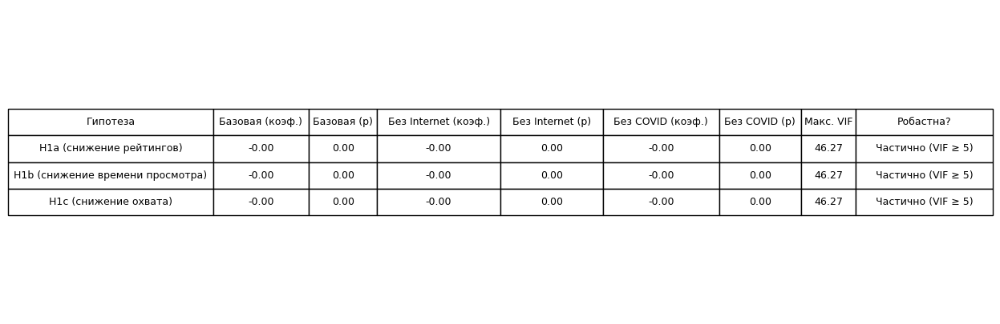

In [90]:
df_summary = pd.DataFrame(robustness_results)

for col in df_summary.columns:
    if df_summary[col].dtype in ['float64', 'float32']:
        if 'p' in col.lower() or 'p-value' in col.lower():
            df_summary[col] = df_summary[col].apply(lambda x: f'{x:.2f}')
        elif 'коэф' in col or 'коэффициент' in col.lower():
            df_summary[col] = df_summary[col].apply(lambda x: f'{x:.2f}')
        else:
            df_summary[col] = df_summary[col].apply(lambda x: round(x, 2))
fig, ax = plt.subplots(figsize=(10, 5))
ax.axis('tight')
ax.axis('off')


table = ax.table(
    cellText=[df_summary.columns.tolist()] + df_summary.values.tolist(),
    cellLoc='center',
    loc='center',
    colWidths=[0.3, 0.14, 0.1, 0.18, 0.15, 0.17, 0.12, 0.08, 0.2]
)

table.auto_set_font_size(False)
table.set_fontsize(9)
table.scale(1.1, 2.0)


plt.savefig('graph39.png', dpi=300, bbox_inches='tight')
plt.show()

## Анализ полных данных

In [8]:
df1 = pd.read_excel('Полные данные.xlsx')

periods = {
    '1 полугодие 2020': (0, 18),
    '2 полугодие 2020': (18, 36), 
    '1 полугодие 2021': (36, 54),
    '2 полугодие 2021': (54, 72),
    '1 полугодие 2022': (72, 90),
    '2 полугодие 2022': (90, 108),
    '1 полугодие 2023': (108, 126),
    '2 полугодие 2023': (126, 144)
}

column_names_1 = ['Канал', 'Рекламодатель', 'Rtg(000)[Сумма]', 'Rtg%[Сумма]', 'AvReach(000)', 
    'AvReach%', 'CumReach(000)', 'CumReach%', 'StandRtg%[Сумма]', 'Universe(000)', 
    'Sample', 'ATV[Сумма]', 'ATVReach[Сумма]', 'TAud', 'Quantity', 
    'Duration[Сумма]', 'ConsolidatedCostRUB', 'CostByGRPRUB']

all_data = []

period_order = [
    '1 полугодие 2020',
    '2 полугодие 2020', 
    '1 полугодие 2021',
    '2 полугодие 2021',
    '1 полугодие 2022',
    '2 полугодие 2022',
    '1 полугодие 2023',
    '2 полугодие 2023'
]

for period_name in period_order:  
    start_col, end_col = periods[period_name]
    period_data = df1.iloc[2:, start_col:end_col].copy()
    period_data.columns = column_names_1
    
    period_data['Период'] = period_name
    
    period_data = period_data.dropna(subset=['Канал', 'Рекламодатель'])
    
    all_data.append(period_data)

final_df1 = pd.concat(all_data, ignore_index=True)

final_df1['Период'] = pd.Categorical(
    final_df1['Период'], 
    categories=period_order,
    ordered=True
)

final_df1 = final_df1.sort_values('Период')

num_columns = ['Rtg(000)[Сумма]', 'Rtg%[Сумма]', 'AvReach(000)', 
    'AvReach%', 'CumReach(000)', 'CumReach%', 'StandRtg%[Сумма]', 'Universe(000)', 
    'Sample', 'ATV[Сумма]', 'ATVReach[Сумма]', 'TAud', 'Quantity', 
    'Duration[Сумма]', 'ConsolidatedCostRUB', 'CostByGRPRUB']

for col in num_columns:
    final_df1[col] = pd.to_numeric(final_df1[col], errors='coerce')

final_df1.head()

,Канал,Рекламодатель,Rtg(000)[Сумма],Rtg%[Сумма],AvReach(000),AvReach%,CumReach(000),CumReach%,StandRtg%[Сумма],Universe(000),Sample,ATV[Сумма],ATVReach[Сумма],TAud,Quantity,Duration[Сумма],ConsolidatedCostRUB,CostByGRPRUB,Период
0,2X2 (СЕТЕВОЕ ВЕЩАНИЕ),ПРАВИТЕЛЬСТВО РОССИЙСКОЙ ФЕДЕРАЦИИ,94045.60323,68.95153,94.13620,0.06902,9713.91752,7.12196,77.26125,136393.79300,15533.37500,0.68952,9.68153,94045.60323,999,23385,9.994339e+06,9.994339e+06,1 полугодие 2020
3300,СОЛНЦЕ (СЕТЕВОЕ ВЕЩАНИЕ),ТАНДЕР,61086.86982,44.78713,331.81915,0.24328,11601.97936,8.50624,41.32295,136393.79299,15773.75000,0.44787,5.26521,61086.86982,184,3400,3.928355e+06,3.928355e+06,1 полугодие 2020
3299,СОЛНЦЕ (СЕТЕВОЕ ВЕЩАНИЕ),ДОДО ПИЦЦА,30319.57793,22.22944,445.80421,0.32685,11906.30112,8.72936,9.37531,136393.79299,15088.00000,0.22229,2.54652,30319.57793,68,639,7.222291e+05,7.222291e+05,1 полугодие 2020
3298,СОЛНЦЕ (СЕТЕВОЕ ВЕЩАНИЕ),FERRERO,835666.01599,612.68625,306.28236,0.22456,38296.15247,28.07764,686.27472,136393.79300,15319.28777,6.12686,21.82115,835666.01599,2727,59402,7.064587e+07,7.064587e+07,1 полугодие 2020
3297,СОЛНЦЕ (СЕТЕВОЕ ВЕЩАНИЕ),ТИВИЗАВР,125317.12561,91.87891,412.08236,0.30213,21771.95552,15.96257,68.90918,136393.79301,15381.40000,0.91879,5.75590,125317.12561,304,4559,7.323308e+06,7.323308e+06,1 полугодие 2020


## Обработка пропусков 

In [9]:
final_df1.isnull().sum().sort_values(ascending=False)

TAud                   15
StandRtg%[Сумма]       15
Канал                   0
Sample                  0
CostByGRPRUB            0
ConsolidatedCostRUB     0
Duration[Сумма]         0
Quantity                0
ATVReach[Сумма]         0
ATV[Сумма]              0
Universe(000)           0
Рекламодатель           0
CumReach%               0
CumReach(000)           0
AvReach%                0
AvReach(000)            0
Rtg%[Сумма]             0
Rtg(000)[Сумма]         0
Период                  0
dtype: int64

In [10]:
final_df1[final_df1['StandRtg%[Сумма]'].isnull()].head()

,Канал,Рекламодатель,Rtg(000)[Сумма],Rtg%[Сумма],AvReach(000),AvReach%,CumReach(000),CumReach%,StandRtg%[Сумма],Universe(000),Sample,ATV[Сумма],ATVReach[Сумма],TAud,Quantity,Duration[Сумма],ConsolidatedCostRUB,CostByGRPRUB,Период
33,2X2 (СЕТЕВОЕ ВЕЩАНИЕ),ПАНДАПАРК,0.0,0.0,0.0,0.0,0.0,0.0,NaN,136393.79297,15453.0,0.0,0.0,NaN,1,0,0.0,0.0,1 полугодие 2020
5040,2X2 (СЕТЕВОЕ ВЕЩАНИЕ),ВЕСЕЛАЯ НАУКА (КОМПАНИЯ),0.0,0.0,0.0,0.0,0.0,0.0,NaN,136393.79294,17541.0,0.0,0.0,NaN,1,0,0.0,0.0,2 полугодие 2020
5026,2X2 (СЕТЕВОЕ ВЕЩАНИЕ),ШКОЛА МАСТЕРА ШИ ЯНБИНА,0.0,0.0,0.0,0.0,0.0,0.0,NaN,136393.79294,17541.0,0.0,0.0,NaN,1,0,0.0,0.0,2 полугодие 2020
5057,2X2 (СЕТЕВОЕ ВЕЩАНИЕ),RIVER PIERS,0.0,0.0,0.0,0.0,0.0,0.0,NaN,136393.79294,17541.0,0.0,0.0,NaN,1,0,0.0,0.0,2 полугодие 2020
10239,2X2 (СЕТЕВОЕ ВЕЩАНИЕ),PILIGRIM PORTO,0.0,0.0,0.0,0.0,0.0,0.0,NaN,136787.22804,17353.0,0.0,0.0,NaN,1,0,0.0,0.0,1 полугодие 2021


In [11]:
final_df1 = final_df1.dropna(subset=['StandRtg%[Сумма]', 'TAud'])
final_df1.isnull().sum().sort_values(ascending=False)

Канал                  0
Sample                 0
CostByGRPRUB           0
ConsolidatedCostRUB    0
Duration[Сумма]        0
Quantity               0
TAud                   0
ATVReach[Сумма]        0
ATV[Сумма]             0
Universe(000)          0
Рекламодатель          0
StandRtg%[Сумма]       0
CumReach%              0
CumReach(000)          0
AvReach%               0
AvReach(000)           0
Rtg%[Сумма]            0
Rtg(000)[Сумма]        0
Период                 0
dtype: int64

## Выбросы

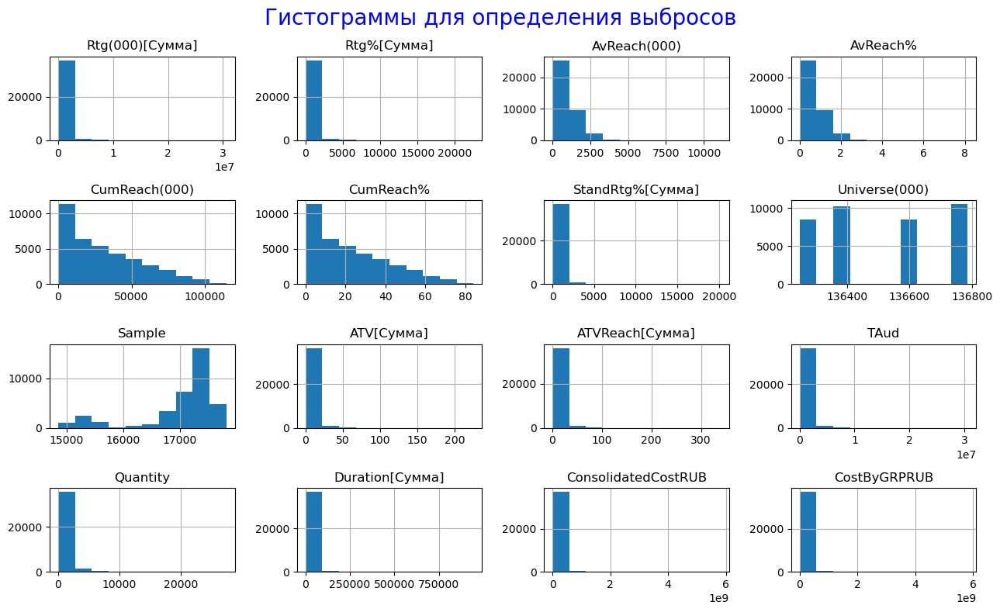

In [12]:
final_df1.hist(figsize=(13,8))
plt.suptitle('Гистограммы для определения выбросов', size = 20, color = 'blue')
plt.tight_layout();
plt.savefig('graph40.png', dpi=300, bbox_inches='tight')

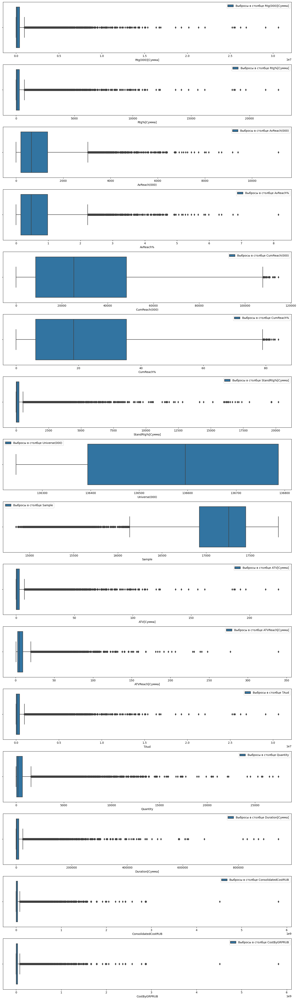

In [13]:
fig, axs = plt.subplots(16, 1, figsize=(15, 50), sharey=False)

columns = ["Rtg(000)[Сумма]",
    "Rtg%[Сумма]",
    "AvReach(000)",
    "AvReach%",
    "CumReach(000)",
    "CumReach%",
    "StandRtg%[Сумма]",
    "Universe(000)",
    "Sample",
    "ATV[Сумма]",
    "ATVReach[Сумма]",
    "TAud",
    "Quantity",
    "Duration[Сумма]",
    "ConsolidatedCostRUB",
    "CostByGRPRUB"]

for i, col in enumerate(columns):
    sns.boxplot(data=final_df1, x=col, ax=axs[i])
    axs[i].legend([f'Выбросы в столбце {col}'])

plt.tight_layout()
fig.savefig('graph41.png',dpi=300, bbox_inches='tight')
plt.show()

In [14]:
columns_to_clean = ['Rtg(000)[Сумма]', 'Rtg(000)[Сумма]', 'Rtg%[Сумма]', 'AvReach(000)', 
    'CumReach(000)', 'StandRtg%[Сумма]', 'ATV[Сумма]', 'ATVReach[Сумма]', 
    'Quantity', 'Duration[Сумма]', 'ConsolidatedCostRUB', 'CostByGRPRUB']

final_df1_clean = final_df1.copy()
for column in columns_to_clean:
    q_1 = final_df1_clean[column].quantile(0.25)
    q_3 = final_df1_clean[column].quantile(0.75)
    IQR = q_3 - q_1
    low = q_1 - 1.5 * IQR
    up = q_3 + 1.5 * IQR
    
    final_df1_clean = final_df1_clean[(final_df1_clean[column] >= low) & (final_df1_clean[column] <= up)]

print(f"Исходный размер: {final_df1.shape}")
print(f"Новый размер: {final_df1_clean.shape}")
final_df1_clean.head()

Исходный размер: (37635, 19)
Новый размер: (18347, 19)


,Канал,Рекламодатель,Rtg(000)[Сумма],Rtg%[Сумма],AvReach(000),AvReach%,CumReach(000),CumReach%,StandRtg%[Сумма],Universe(000),Sample,ATV[Сумма],ATVReach[Сумма],TAud,Quantity,Duration[Сумма],ConsolidatedCostRUB,CostByGRPRUB,Период
3300,СОЛНЦЕ (СЕТЕВОЕ ВЕЩАНИЕ),ТАНДЕР,61086.86982,44.78713,331.81915,0.24328,11601.97936,8.50624,41.32295,136393.79299,15773.75000,0.44787,5.26521,61086.86982,184,3400,3.928355e+06,3.928355e+06,1 полугодие 2020
3299,СОЛНЦЕ (СЕТЕВОЕ ВЕЩАНИЕ),ДОДО ПИЦЦА,30319.57793,22.22944,445.80421,0.32685,11906.30112,8.72936,9.37531,136393.79299,15088.00000,0.22229,2.54652,30319.57793,68,639,7.222291e+05,7.222291e+05,1 полугодие 2020
3297,СОЛНЦЕ (СЕТЕВОЕ ВЕЩАНИЕ),ТИВИЗАВР,125317.12561,91.87891,412.08236,0.30213,21771.95552,15.96257,68.90918,136393.79301,15381.40000,0.91879,5.75590,125317.12561,304,4559,7.323308e+06,7.323308e+06,1 полугодие 2020
3295,СОЛНЦЕ (СЕТЕВОЕ ВЕЩАНИЕ),JADRAN CO,24788.46881,18.17419,334.97931,0.24560,10720.59543,7.86003,15.27160,136393.79299,15120.23077,0.18174,2.31223,24788.46881,74,1241,9.865566e+05,9.865566e+05,1 полугодие 2020
3294,СОЛНЦЕ (СЕТЕВОЕ ВЕЩАНИЕ),DE AGOSTINI,24314.52905,17.82671,292.94613,0.21478,7781.64829,5.70528,4.98428,136393.79296,15078.00000,0.17827,3.12460,24314.52905,83,455,6.355121e+05,6.355121e+05,1 полугодие 2020


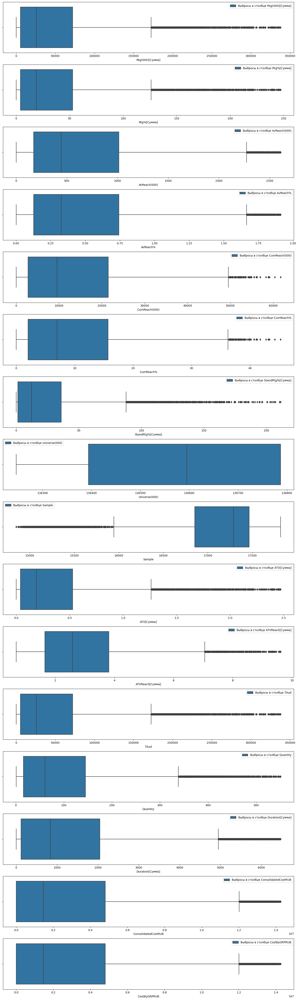

In [15]:
fig, axs = plt.subplots(16, 1, figsize=(15, 50), sharey=False)

columns = ["Rtg(000)[Сумма]",
    "Rtg%[Сумма]",
    "AvReach(000)",
    "AvReach%",
    "CumReach(000)",
    "CumReach%",
    "StandRtg%[Сумма]",
    "Universe(000)",
    "Sample",
    "ATV[Сумма]",
    "ATVReach[Сумма]",
    "TAud",
    "Quantity",
    "Duration[Сумма]",
    "ConsolidatedCostRUB",
    "CostByGRPRUB"]

for i, col in enumerate(columns):
    sns.boxplot(data=final_df1_clean, x=col, ax=axs[i])
    axs[i].legend([f'Выбросы в столбце {col}'])

plt.tight_layout()
fig.savefig('graph42.png',dpi=300, bbox_inches='tight')
plt.show()

## Визуализация

In [16]:
df_p = final_df1_clean.copy()
del df_p['Канал']
del df_p['Рекламодатель']
def country_means(df):
     return df.groupby("Период").mean()
df_period = country_means(df_p)
df_period.head()

C:\Users\proho\AppData\Local\Temp\ipykernel_4720\3307588104.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  return df.groupby("Период").mean()


,Rtg(000)[Сумма],Rtg%[Сумма],AvReach(000),AvReach%,CumReach(000),CumReach%,StandRtg%[Сумма],Universe(000),Sample,ATV[Сумма],ATVReach[Сумма],TAud,Quantity,Duration[Сумма],ConsolidatedCostRUB,CostByGRPRUB
Период,,,,,,,,,,,,,,,,
1 полугодие 2020,53949.724825,39.554384,710.223963,0.520716,14659.652020,10.748034,27.894547,136393.793002,15333.629400,0.395544,2.908072,53949.724825,104.049766,1504.774564,2.905885e+06,2.900894e+06
2 полугодие 2020,47776.090497,35.028053,653.721182,0.479290,12904.993452,9.461569,23.743786,136393.792995,17006.282720,0.350281,2.790969,47776.090497,94.207228,1320.025759,2.743235e+06,2.738059e+06
1 полугодие 2021,51841.179273,37.899137,698.606387,0.510725,14058.580882,10.277700,26.518727,136787.228015,17288.555177,0.378991,2.946360,51841.179273,99.617636,1423.171284,2.863591e+06,2.863591e+06
2 полугодие 2021,52489.857115,38.373361,673.033655,0.492030,13950.285422,10.198529,26.308579,136787.228002,17061.415528,0.383734,3.032304,52489.857115,103.278566,1443.849488,3.253334e+06,3.253334e+06
1 полугодие 2022,50541.724536,37.001135,700.104973,0.512541,13807.422482,10.108288,25.521544,136595.065986,17442.206362,0.370011,2.874203,50541.724536,95.618526,1345.387368,3.138646e+06,3.138646e+06


In [17]:
df_с = final_df1_clean.copy()
del df_с['Период']
del df_с['Рекламодатель']
def country_means(df):
     return df.groupby("Канал").mean()
df_channel = country_means(df_с)
df_channel.head()

,Rtg(000)[Сумма],Rtg%[Сумма],AvReach(000),AvReach%,CumReach(000),CumReach%,StandRtg%[Сумма],Universe(000),Sample,ATV[Сумма],ATVReach[Сумма],TAud,Quantity,Duration[Сумма],ConsolidatedCostRUB,CostByGRPRUB
Канал,,,,,,,,,,,,,,,,
2X2 (СЕТЕВОЕ ВЕЩАНИЕ),9818.522830,7.190784,64.252074,0.047055,2488.355887,1.822362,5.385138,136562.655526,16945.258421,0.071908,3.168146,9818.522830,145.923077,2154.246684,6.228167e+05,6.228167e+05
RU.TV (ДО 31/12/2020) (СЕТЕВОЕ ВЕЩАНИЕ),6087.478562,4.463164,46.723691,0.034256,2625.068444,1.924625,3.055384,136393.792999,16105.478843,0.044631,2.040135,6087.478562,131.707692,1820.465385,9.690941e+04,0.000000e+00
ДЕТСКИЙ РЕКЛАМНЫЙ КАНАЛ (СЕТЕВОЕ ВЕЩАНИЕ),14990.528370,10.981860,95.781972,0.070184,3705.547908,2.714869,8.105166,136484.364625,16979.543800,0.109818,3.742249,14990.528370,158.843137,2324.803922,9.469921e+05,9.469921e+05
ДОМ КИНО (СЕТЕВОЕ ВЕЩАНИЕ),41668.633063,30.522395,289.745140,0.212235,11067.957051,8.107150,21.271926,136517.123733,16955.149354,0.305224,3.184017,41668.633063,148.847019,2042.230596,7.468040e+05,7.468040e+05
ДОМАШНИЙ (СЕТЕВОЕ ВЕЩАНИЕ),100534.707354,73.640669,1235.611599,0.905093,20017.540537,14.662925,49.033882,136516.192305,17038.486156,0.736407,4.380759,100534.707354,83.096990,1127.177258,5.232744e+06,5.232744e+06


In [18]:
df_a = final_df1_clean.copy()
del df_a['Период']
del df_a["Канал"]
def country_means(df):
     return df.groupby("Рекламодатель").mean()
df_advertiser = country_means(df_a)
df_advertiser.head()

,Rtg(000)[Сумма],Rtg%[Сумма],AvReach(000),AvReach%,CumReach(000),CumReach%,StandRtg%[Сумма],Universe(000),Sample,ATV[Сумма],ATVReach[Сумма],TAud,Quantity,Duration[Сумма],ConsolidatedCostRUB,CostByGRPRUB
Рекламодатель,,,,,,,,,,,,,,,,
585,10762.232120,7.899120,827.864010,0.607620,3332.211800,2.445730,0.000000,136245.897990,17542.500000,0.078990,3.229760,10762.232120,13.000000,0.000000,0.000000e+00,0.000000e+00
100 ДВЕРЕЙ,398.857540,0.291955,199.428775,0.145975,188.139945,0.137725,0.000000,136516.562920,17399.000000,0.002920,2.087645,398.857540,2.000000,0.000000,0.000000e+00,0.000000e+00
100 ПУДОВ,186.585510,0.136950,186.585510,0.136950,182.167330,0.133700,0.000000,136245.898180,17739.000000,0.001370,1.024250,186.585510,1.000000,0.000000,0.000000e+00,0.000000e+00
100МЕТРОВКА,147.152350,0.107890,147.152350,0.107890,133.172520,0.097640,0.000000,136393.792960,16711.000000,0.001080,1.104980,147.152350,1.000000,0.000000,0.000000e+00,0.000000e+00
1XСТАВКА,58444.781569,42.774490,370.103960,0.270750,11308.115951,8.275010,40.009901,136622.517704,17310.061431,0.427744,5.297596,58444.781569,228.857143,4527.428571,6.954563e+06,6.954563e+06


<function matplotlib.pyplot.show(close=None, block=None)>

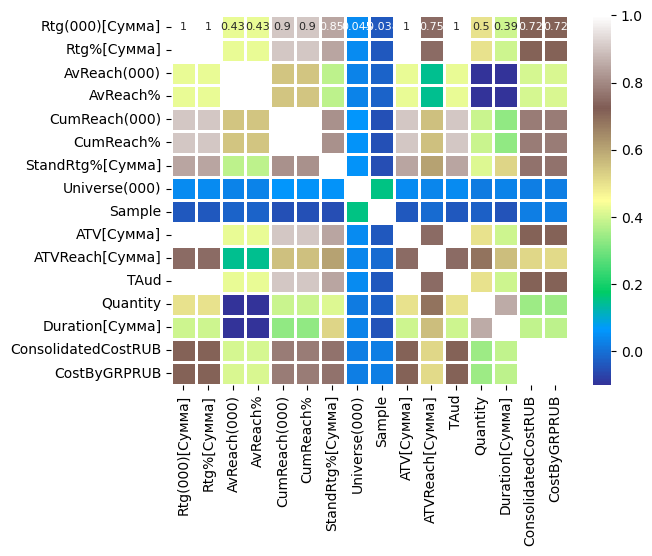

In [19]:
corr = final_df1_clean[num_columns].corr()
sns.heatmap(corr, annot = True, linecolor = 'white', linewidth = 2, vmax = 0, vmin = 1, cmap = 'terrain', annot_kws={"size":8})
plt.savefig('graph43.png',dpi=300, bbox_inches='tight')
plt.show

C:\Users\proho\anaconda3\an\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


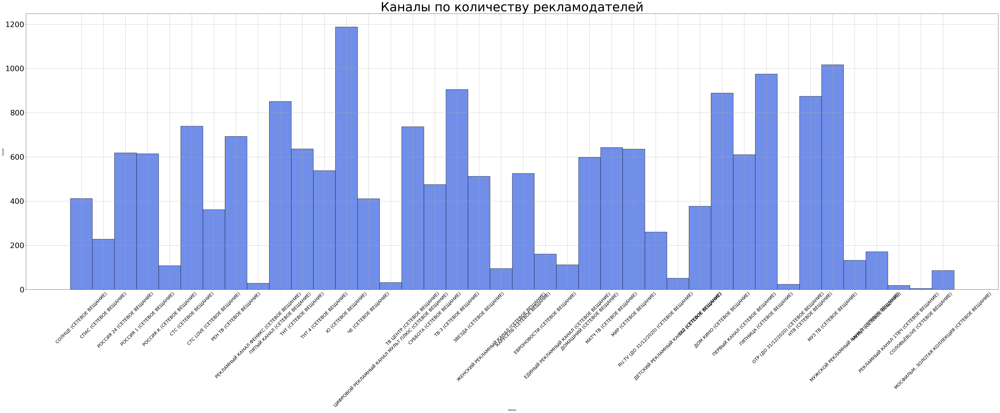

In [20]:
plt.figure(figsize=(70, 20))
final_df1_clean['Канал'].value_counts()
sns.histplot(data = final_df1_clean, x = 'Канал', color = 'royalblue')
plt.xticks(rotation=45, fontsize = 18)
plt.yticks(fontsize=30)
plt.grid(True)
plt.title('Каналы по количеству рекламодателей', fontsize=50)
plt.savefig('graph44.png',dpi=300, bbox_inches='tight')
plt.show()

C:\Users\proho\AppData\Local\Temp\ipykernel_4720\2998458767.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  channel_counts_by_period = final_df1_clean.groupby('Период')['Канал'].nunique()
C:\Users\proho\anaconda3\an\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


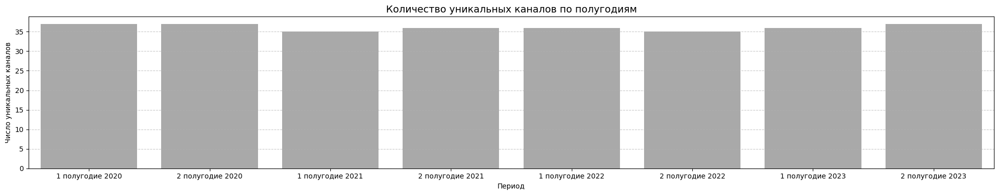

In [21]:
channel_counts_by_period = final_df1_clean.groupby('Период')['Канал'].nunique()

plt.figure(figsize=(20, 4))
sns.barplot(x=channel_counts_by_period.index, y=channel_counts_by_period.values, color='darkgrey')
plt.title('Количество уникальных каналов по полугодиям', fontsize=14)
plt.ylabel('Число уникальных каналов')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.savefig('graph45.png',dpi=300, bbox_inches='tight')
plt.show()

C:\Users\proho\AppData\Local\Temp\ipykernel_4720\785781749.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  advertiser_counts_by_period = final_df1_clean.groupby('Период')['Рекламодатель'].nunique()
C:\Users\proho\anaconda3\an\Lib\site-packages\seaborn\categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)


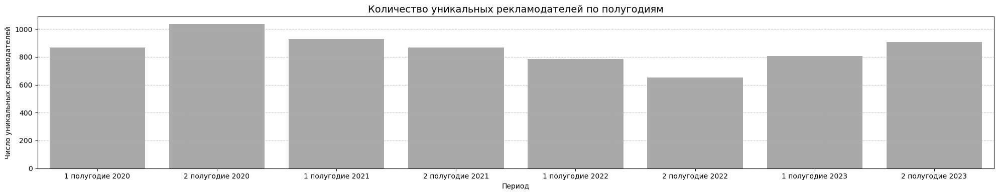

In [22]:
advertiser_counts_by_period = final_df1_clean.groupby('Период')['Рекламодатель'].nunique()

plt.figure(figsize=(20, 4))
sns.barplot(x=advertiser_counts_by_period.index, y=advertiser_counts_by_period.values, color='darkgrey')
plt.title('Количество уникальных рекламодателей по полугодиям', fontsize=14)
plt.ylabel('Число уникальных рекламодателей')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.savefig('graph46.png',dpi=300, bbox_inches='tight')
plt.show()

## Описательная статистика 

C:\Users\proho\AppData\Local\Temp\ipykernel_4720\58469498.py:5: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  desc_stats_formatted = desc_stats.applymap(format_num)


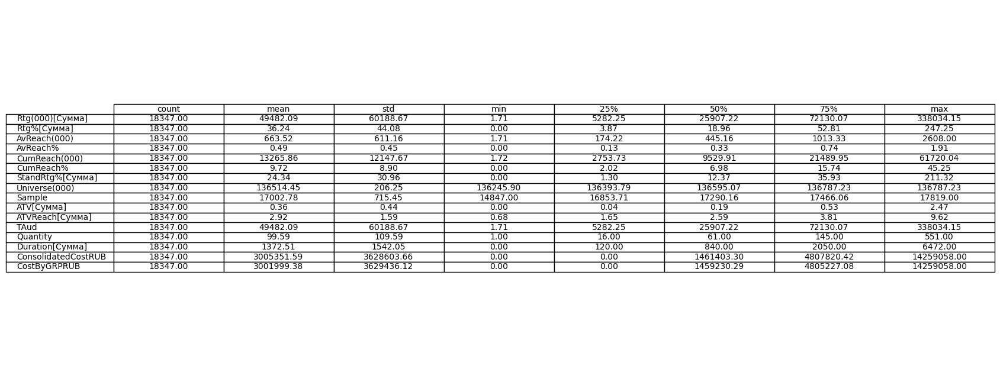

In [23]:
desc_stats = final_df1_clean[num_columns].describe().T
def format_num(x):
        return f"{x:.2f}" if not pd.isna(x) else ""

desc_stats_formatted = desc_stats.applymap(format_num)

fig, ax = plt.subplots(figsize=(12, 8))
ax.axis('off') 
table = pd.plotting.table(ax, desc_stats_formatted, 
                         loc='center', 
                         cellLoc='center',
                         colWidths=[0.2] * len(desc_stats_formatted.columns))
plt.savefig('graph47.png', 
           dpi=300, 
           bbox_inches='tight', 
           facecolor='white')

## Гипотезы и обучение моделей

In [24]:
import re
def detect(advertiser_name):
    
    name = str(advertiser_name)
    
    clean_name = re.sub(r'[0-9\s\W_]', '', name)
    
    has_russian = bool(re.search('[а-яА-ЯёЁ]', clean_name))
    
    has_english = bool(re.search('[a-zA-Z]', clean_name))
    
    if has_russian and not has_english:
        return "russian"
    elif has_english and not has_russian:
        return "foreign"
    else:
        return "unknown"

def advertiser_type_column(df, advertiser_column='Рекламодатель'):
   
    df['Advertiser_type'] = df[advertiser_column].apply(detect)
    
    return df

final_df1_clean = advertiser_type_column(final_df1_clean, 'Рекламодатель')
final_df1_clean['Advertiser_type']

3300     russian
3299     russian
3297     russian
3295     foreign
3294     foreign
          ...   
34685    russian
34682    foreign
34681    foreign
34687    foreign
37649    russian
Name: Advertiser_type, Length: 18347, dtype: object

In [25]:
final_df1_clean[final_df1_clean['Advertiser_type'] == 'unknown']['Рекламодатель'].unique()

array(['? ОРГАНИЗАТОР "DIGITAL IP & IPQUORUM"', 'VOYAGE (ОТЕЛЬ)',
       'TPS НЕДВИЖИМОСТЬ', 'SOKOLOV (ЮВЕЛИРНЫЕ УКРАШЕНИЯ)',
       'ROSSI (ОТЕЛЬ)', 'ENERGY (РАДИОСТАНЦИЯ)', 'FAZENDA (РЕСТОРАН)',
       'SPACE (БАТУТНЫЙ ЦЕНТР)', 'FRESH FITNESS (СПОРТИВНЫЙ КЛУБ)',
       'ЛЮБОZVERI', 'ДЕТСКОЕ РАДИО FM', 'PRODВИЖЕНИЕ (ФИРМА)', 'PROКАЧУ',
       'EDEM (СВАДЕБНЫЙ САЛОН)', 'СРАВНИ.RU', 'AQUASTAR (КЛУБ)',
       'LBL-МЕДИА', 'R.E.D. (ШОУРУМ)',
       'LEGENDA (ШКОЛА УЛИЧНЫХ ВИДОВ СПОРТА)', 'СИТИ-XXI ВЕК',
       'ORANGE (КОРПОРАЦИЯ)', 'БАХРУШИНЪ LOFT', 'CLEVER (ИЗДАТЕЛЬСТВО)',
       'POLARIS (БЫТОВАЯ ТЕХНИКА)', 'PERFORMANCE GROUP (КОМПАНИЯ)',
       'ULIA (РЕСТОРАН)', 'MARCO POLO (БУТИК)',
       'ENCORE (ГРУППА КОМПАНИЙ)', 'FITNESS HOUSE (КЛУБ)',
       'KARI (МАГАЗИН ОБУВИ)', 'VOLGA (ГОСТИНИЧНЫЙ КОМПЛЕКС)',
       'YOU (СТУДИЯ КРАСОТЫ)', 'ORION (ФАРМАЦЕВТИКА)', 'АКВАKID',
       'SEVEN HILLS (СЕТЬ ОТЕЛЕЙ)', 'LOFT ФАРФОР', 'МЕТАVITONICA',
       'ZARЯDKA (ФИТНЕС-КЛУБ)', 'COME IN (КУЛЬТУРН

In [26]:
unknown_to_russian = ['SOKOLOV (ЮВЕЛИРНЫЕ УКРАШЕНИЯ)',
    'СРАВНИ.RU',
    'PRODВИЖЕНИЕ (ФИРМА)',
    'ЗЕЛЕНАЯ ДУБРАВА (ZD)',
    'COTTON CLUB (ГРУППА КОМПАНИЙ)']

final_df1_clean['Advertiser_type'] = 0 

mask = final_df1_clean['Рекламодатель'].isin(unknown_to_russian)
final_df1_clean.loc[mask, 'Advertiser_type'] = 1

russian_mask = final_df1_clean['Рекламодатель'].str.match('^[А-Яа-я]', na=False)
final_df1_clean.loc[russian_mask, 'Advertiser_type'] = 1

print(final_df1_clean['Advertiser_type'].value_counts())

Advertiser_type
1    10800
0     7547
Name: count, dtype: int64


In [27]:
df_new = final_df1_clean.copy(deep = True)
        
df_new['ln_CostByGRP'] = np.log(df_new['CostByGRPRUB'])
df_new['ln_ATV'] = np.log(df_new['ATV[Сумма]'])
df_new['ln_ATVReach[Сумма]'] = np.log(df_new['ATVReach[Сумма]'])
df_new['ln_RTG'] = np.log(df_new['Rtg%[Сумма]'])
df_new['ln_AvReach'] = np.log(df_new['AvReach%'])
df_new.head()

C:\Users\proho\anaconda3\an\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


,Канал,Рекламодатель,Rtg(000)[Сумма],Rtg%[Сумма],AvReach(000),AvReach%,CumReach(000),CumReach%,StandRtg%[Сумма],Universe(000),...,Duration[Сумма],ConsolidatedCostRUB,CostByGRPRUB,Период,Advertiser_type,ln_CostByGRP,ln_ATV,ln_ATVReach[Сумма],ln_RTG,ln_AvReach
3300,СОЛНЦЕ (СЕТЕВОЕ ВЕЩАНИЕ),ТАНДЕР,61086.86982,44.78713,331.81915,0.24328,11601.97936,8.50624,41.32295,136393.79299,...,3400,3.928355e+06,3.928355e+06,1 полугодие 2020,1,15.183731,-0.803252,1.661121,3.801921,-1.413542
3299,СОЛНЦЕ (СЕТЕВОЕ ВЕЩАНИЕ),ДОДО ПИЦЦА,30319.57793,22.22944,445.80421,0.32685,11906.30112,8.72936,9.37531,136393.79299,...,639,7.222291e+05,7.222291e+05,1 полугодие 2020,1,13.490098,-1.503772,0.934728,3.101418,-1.118254
3297,СОЛНЦЕ (СЕТЕВОЕ ВЕЩАНИЕ),ТИВИЗАВР,125317.12561,91.87891,412.08236,0.30213,21771.95552,15.96257,68.90918,136393.79301,...,4559,7.323308e+06,7.323308e+06,1 полугодие 2020,1,15.806573,-0.084698,1.750225,4.520472,-1.196898
3295,СОЛНЦЕ (СЕТЕВОЕ ВЕЩАНИЕ),JADRAN CO,24788.46881,18.17419,334.97931,0.24560,10720.59543,7.86003,15.27160,136393.79299,...,1241,9.865566e+05,9.865566e+05,1 полугодие 2020,0,13.801976,-1.705178,0.838212,2.900002,-1.404051
3294,СОЛНЦЕ (СЕТЕВОЕ ВЕЩАНИЕ),DE AGOSTINI,24314.52905,17.82671,292.94613,0.21478,7781.64829,5.70528,4.98428,136393.79296,...,455,6.355121e+05,6.355121e+05,1 полугодие 2020,0,13.362186,-1.724456,1.139306,2.880698,-1.538141


In [28]:
(df_new['ln_CostByGRP'] == -np.inf).sum()
df_new = df_new[df_new['ln_CostByGRP'] != -np.inf]
df_new.head()

,Канал,Рекламодатель,Rtg(000)[Сумма],Rtg%[Сумма],AvReach(000),AvReach%,CumReach(000),CumReach%,StandRtg%[Сумма],Universe(000),...,Duration[Сумма],ConsolidatedCostRUB,CostByGRPRUB,Период,Advertiser_type,ln_CostByGRP,ln_ATV,ln_ATVReach[Сумма],ln_RTG,ln_AvReach
3300,СОЛНЦЕ (СЕТЕВОЕ ВЕЩАНИЕ),ТАНДЕР,61086.86982,44.78713,331.81915,0.24328,11601.97936,8.50624,41.32295,136393.79299,...,3400,3.928355e+06,3.928355e+06,1 полугодие 2020,1,15.183731,-0.803252,1.661121,3.801921,-1.413542
3299,СОЛНЦЕ (СЕТЕВОЕ ВЕЩАНИЕ),ДОДО ПИЦЦА,30319.57793,22.22944,445.80421,0.32685,11906.30112,8.72936,9.37531,136393.79299,...,639,7.222291e+05,7.222291e+05,1 полугодие 2020,1,13.490098,-1.503772,0.934728,3.101418,-1.118254
3297,СОЛНЦЕ (СЕТЕВОЕ ВЕЩАНИЕ),ТИВИЗАВР,125317.12561,91.87891,412.08236,0.30213,21771.95552,15.96257,68.90918,136393.79301,...,4559,7.323308e+06,7.323308e+06,1 полугодие 2020,1,15.806573,-0.084698,1.750225,4.520472,-1.196898
3295,СОЛНЦЕ (СЕТЕВОЕ ВЕЩАНИЕ),JADRAN CO,24788.46881,18.17419,334.97931,0.24560,10720.59543,7.86003,15.27160,136393.79299,...,1241,9.865566e+05,9.865566e+05,1 полугодие 2020,0,13.801976,-1.705178,0.838212,2.900002,-1.404051
3294,СОЛНЦЕ (СЕТЕВОЕ ВЕЩАНИЕ),DE AGOSTINI,24314.52905,17.82671,292.94613,0.21478,7781.64829,5.70528,4.98428,136393.79296,...,455,6.355121e+05,6.355121e+05,1 полугодие 2020,0,13.362186,-1.724456,1.139306,2.880698,-1.538141


In [29]:
def period_to_middate(period):
    parts = period.split()
    half = int(parts[0])
    year = int(parts[-1])
    if half == 1:
        return pd.to_datetime(f"{year}-06-30")
    else:
        return pd.to_datetime(f"{year}-12-31")

df_new['Дата'] = df_new['Период'].apply(period_to_middate)
df_new = df_new.sort_values('Дата').reset_index(drop=True)
df_new['Time'] = np.arange(1, len(df_new) + 1) 

df_new['HalfYear_1'] = (df_new['Дата'].dt.month == 6).astype(int)  
df_new['COVID_dummy'] = df_new['Дата'].dt.year.isin([2020, 2021]).astype(int)

In [30]:
df_internet = pd.read_excel('internet.xlsx')
df_internet

,Наименование показателя,2020,2021,2022,2023
0,"Доля домашних хозяйств, имеющих доступ к сети ...",80,84,86.6,87.9


In [31]:
yearly_data_internet = {
    2020: df_internet[2020].iloc[0],
    2021: df_internet[2021].iloc[0],
    2022: df_internet[2022].iloc[0],
    2023: df_internet[2023].iloc[0]
}

def interpolate_internet(date_obj):
    year = date_obj.year
    month = date_obj.month
    half = 1 if month <= 6 else 2
    
    try:
        if year == 2020:
            if half == 1:
                return yearly_data_internet[2020] + 0.5 * (yearly_data_internet[2021] - yearly_data_internet[2020])
            else:
                return yearly_data_internet[2021]
        elif year == 2021:
            if half == 1:
                return yearly_data_internet[2021] + 0.5 * (yearly_data_internet[2022] - yearly_data_internet[2021])
            else:
                return yearly_data_internet[2022]
        elif year == 2022:
            if half == 1:
                return yearly_data_internet[2022] + 0.5 * (yearly_data_internet[2023] - yearly_data_internet[2022])
            else:
                return yearly_data_internet[2023]
        elif year == 2023:
            return yearly_data_internet[2023]
    except Exception:
        return None

df_new['InternetPenetration'] = df_new['Дата'].apply(interpolate_internet)
df_new['ln_InternetPenetration'] = np.log(df_new['InternetPenetration'])
df_new.head()

,Канал,Рекламодатель,Rtg(000)[Сумма],Rtg%[Сумма],AvReach(000),AvReach%,CumReach(000),CumReach%,StandRtg%[Сумма],Universe(000),...,ln_ATV,ln_ATVReach[Сумма],ln_RTG,ln_AvReach,Дата,Time,HalfYear_1,COVID_dummy,InternetPenetration,ln_InternetPenetration
0,СОЛНЦЕ (СЕТЕВОЕ ВЕЩАНИЕ),ТАНДЕР,61086.86982,44.78713,331.81915,0.24328,11601.97936,8.50624,41.32295,136393.79299,...,-0.803252,1.661121,3.801921,-1.413542,2020-06-30,1,1,1,82.0,4.406719
1,ДЕТСКИЙ РЕКЛАМНЫЙ КАНАЛ (СЕТЕВОЕ ВЕЩАНИЕ),20TH CENTURY FOX FILM CORPORATION,8875.31985,6.50713,82.94691,0.06081,2098.36817,1.53846,3.70177,136393.79299,...,-2.732292,1.442115,1.872898,-2.800001,2020-06-30,2,1,1,82.0,4.406719
2,ДЕТСКИЙ РЕКЛАМНЫЙ КАНАЛ (СЕТЕВОЕ ВЕЩАНИЕ),GLORIA JEANS,26750.64327,19.61280,72.49497,0.05315,4415.64365,3.23742,12.26935,136393.79300,...,-1.628978,1.801404,2.976182,-2.934637,2020-06-30,3,1,1,82.0,4.406719
3,ДЕТСКИЙ РЕКЛАМНЫЙ КАНАЛ (СЕТЕВОЕ ВЕЩАНИЕ),UNIVERSAL PICTURES INTERNATIONAL RUSSIA,3933.00837,2.88357,89.38655,0.06554,1776.42790,1.30243,2.88357,136393.79303,...,-3.545992,0.794801,1.059029,-2.725095,2020-06-30,4,1,1,82.0,4.406719
4,ДЕТСКИЙ РЕКЛАМНЫЙ КАНАЛ (СЕТЕВОЕ ВЕЩАНИЕ),САКС,2903.04000,2.12843,93.64645,0.06866,1530.73774,1.12229,1.16773,136393.79301,...,-3.849988,0.640010,0.755385,-2.678588,2020-06-30,5,1,1,82.0,4.406719


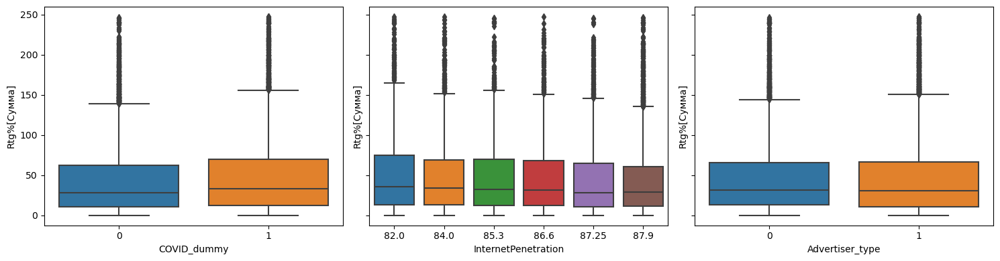

In [32]:
fig, axs = plt.subplots(1, 3, figsize=(15, 4), sharey=True)

sns.boxplot(x='COVID_dummy', y='Rtg%[Сумма]', data=df_new, ax=axs[0])
sns.boxplot(x='InternetPenetration', y='Rtg%[Сумма]', data=df_new, ax=axs[1])
sns.boxplot(x='Advertiser_type', y='Rtg%[Сумма]', data = df_new, ax=axs[2])

plt.tight_layout()
plt.savefig('graph48.png', dpi=300, bbox_inches='tight')
plt.show()

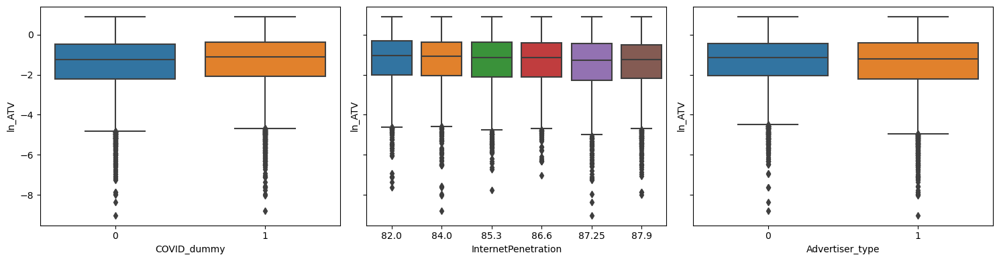

In [33]:
fig, axs = plt.subplots(1, 3, figsize=(15, 4), sharey=True)

sns.boxplot(x='COVID_dummy', y='ln_ATV', data=df_new, ax=axs[0])
sns.boxplot(x='InternetPenetration', y='ln_ATV', data=df_new, ax=axs[1])
sns.boxplot(x='Advertiser_type', y='ln_ATV', data=df_new, ax=axs[2])

plt.tight_layout()
plt.savefig('graph11.png', dpi=300, bbox_inches='tight')
plt.show()

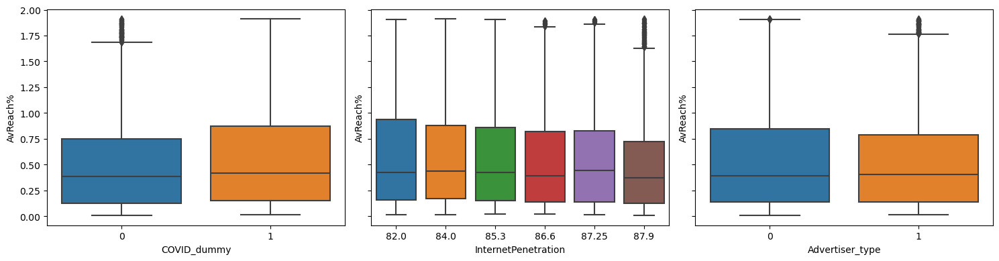

In [34]:
fig, axs = plt.subplots(1, 3, figsize=(15, 4), sharey=True)

sns.boxplot(x='COVID_dummy', y='AvReach%', data=df_new, ax=axs[0])
sns.boxplot(x='InternetPenetration', y='AvReach%', data=df_new, ax=axs[1])
sns.boxplot(x='Advertiser_type', y='AvReach%', data=df_new, ax=axs[2])

plt.tight_layout()
plt.savefig('graph12.png', dpi=300, bbox_inches='tight')
plt.show()

H1a

In [35]:
Y = df_new['ln_RTG']
X = df_new[['Time', 'HalfYear_1', 'COVID_dummy', 'ln_InternetPenetration','Advertiser_type']]
X = sm.add_constant(X)
model = sm.OLS(Y,X)
res = model.fit(cov_type='HAC', cov_kwds={'maxlags': 10})
print (res.summary())
coef = res.params['Time']
pval = res.pvalues['Time']
int = res.conf_int().loc['Time']
print(f"Коэффициент при Time: {coef:.4f}")
print(f"p-value: {pval:.4f}")
print(f"95% доверительный интервал: [{int[0]:.4f}, {int[1]:.4f}]")
alpha = 0.10
if coef < 0 and pval < alpha:
        print(f"\n Гипотеза подтверждена")
else:
        print(f"\n Гипотеза не подтверждена")

                            OLS Regression Results                            
Dep. Variable:                 ln_RTG   R-squared:                       0.010
Model:                            OLS   Adj. R-squared:                  0.010
Method:                 Least Squares   F-statistic:                     11.03
Date:                Mon, 11 May 2026   Prob (F-statistic):           1.29e-10
Time:                        13:53:18   Log-Likelihood:                -23040.
No. Observations:               13400   AIC:                         4.609e+04
Df Residuals:                   13394   BIC:                         4.614e+04
Df Model:                           5                                         
Covariance Type:                  HAC                                         
                             coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                    -38

In [36]:
from io import StringIO

summary_text = res.summary()

fig, ax = plt.subplots(figsize=(10, 6))
ax.axis('off') 
ax.text(0, 1, summary_text, fontsize=10, family='monospace', verticalalignment='top')

plt.savefig('graph49.png', bbox_inches='tight', dpi=300)
plt.close()

H1b

In [37]:
Y = df_new['ln_ATV']
X = df_new[['Time', 'HalfYear_1', 'COVID_dummy', 'ln_InternetPenetration','Advertiser_type']]
X = sm.add_constant(X)
model = sm.OLS(Y,X)
res = model.fit(cov_type='HAC', cov_kwds={'maxlags': 10})
print (res.summary())
coef = res.params['Time']
pval = res.pvalues['Time']
int = res.conf_int().loc['Time']
print(f"Коэффициент при Time: {coef:.4f}")
print(f"p-value: {pval:.4f}")
print(f"95% доверительный интервал: [{int[0]:.4f}, {int[1]:.4f}]")
alpha = 0.10
if coef < 0 and pval < alpha:
        print(f"\n Гипотеза подтверждена")
else:
        print(f"\n Гипотеза не подтверждена")

                            OLS Regression Results                            
Dep. Variable:                 ln_ATV   R-squared:                       0.010
Model:                            OLS   Adj. R-squared:                  0.010
Method:                 Least Squares   F-statistic:                     11.03
Date:                Mon, 11 May 2026   Prob (F-statistic):           1.29e-10
Time:                        13:54:11   Log-Likelihood:                -23041.
No. Observations:               13400   AIC:                         4.609e+04
Df Residuals:                   13394   BIC:                         4.614e+04
Df Model:                           5                                         
Covariance Type:                  HAC                                         
                             coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                    -43

In [38]:
from io import StringIO

summary_text = res.summary()

fig, ax = plt.subplots(figsize=(10, 6))
ax.axis('off') 
ax.text(0, 1, summary_text, fontsize=10, family='monospace', verticalalignment='top')

plt.savefig('graph50.png', bbox_inches='tight', dpi=300)
plt.close()

H1c

In [39]:
Y = df_new['ln_AvReach']
X = df_new[['Time', 'HalfYear_1', 'COVID_dummy', 'ln_InternetPenetration','Advertiser_type']]
X = sm.add_constant(X)
model = sm.OLS(Y,X)
res = model.fit(cov_type='HAC', cov_kwds={'maxlags': 10})
print (res.summary())
coef = res.params['Time']
pval = res.pvalues['Time']
int = res.conf_int().loc['Time']
print(f"Коэффициент при Time: {coef:.4f}")
print(f"p-value: {pval:.4f}")
print(f"95% доверительный интервал: [{int[0]:.4f}, {int[1]:.4f}]")
alpha = 0.10
if coef < 0 and pval < alpha:
        print(f"\n Гипотеза подтверждена")
else:
        print(f"\n Гипотеза не подтверждена")

                            OLS Regression Results                            
Dep. Variable:             ln_AvReach   R-squared:                       0.020
Model:                            OLS   Adj. R-squared:                  0.020
Method:                 Least Squares   F-statistic:                     8.688
Date:                Mon, 11 May 2026   Prob (F-statistic):           3.10e-08
Time:                        13:55:45   Log-Likelihood:                -19574.
No. Observations:               13400   AIC:                         3.916e+04
Df Residuals:                   13394   BIC:                         3.920e+04
Df Model:                           5                                         
Covariance Type:                  HAC                                         
                             coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                    -46

In [40]:
from io import StringIO

summary_text = res.summary()

fig, ax = plt.subplots(figsize=(10, 6))
ax.axis('off') 
ax.text(0, 1, summary_text, fontsize=10, family='monospace', verticalalignment='top')

plt.savefig('graph51.png', bbox_inches='tight', dpi=300)
plt.close()

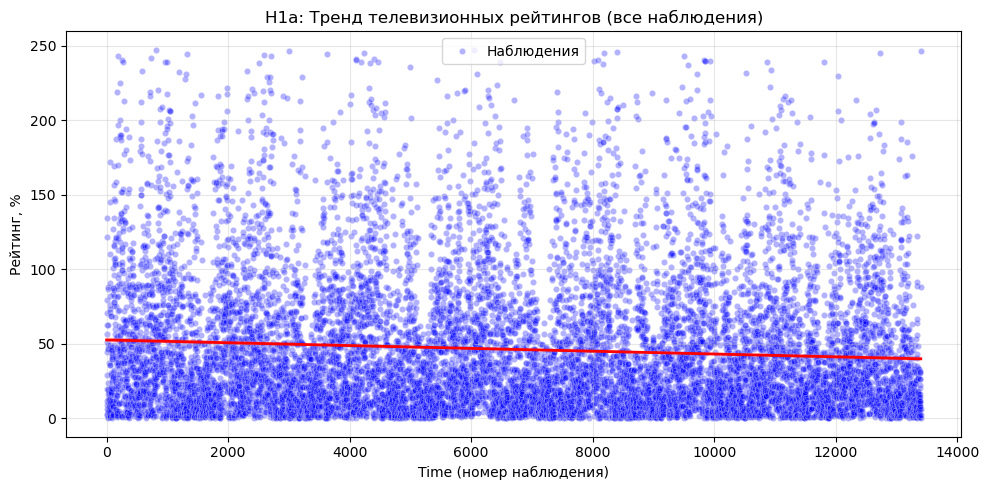

In [41]:
fig, axes = plt.subplots(1, 1, figsize=(10, 5))

ax1 = axes
sns.scatterplot(x='Time', y='Rtg%[Сумма]', data=df_new, alpha=0.3, s=20, ax=ax1, color='blue', label='Наблюдения')

sns.regplot(x='Time', y='Rtg%[Сумма]', data=df_new, scatter=False, ci=95, ax=ax1, line_kws={'color': 'red', 'lw': 2, 'label': 'Линейный тренд '})

ax1.set_title('H1a: Тренд телевизионных рейтингов (все наблюдения)', fontsize=12)
ax1.set_xlabel('Time (номер наблюдения)')
ax1.set_ylabel('Рейтинг, %')
ax1.legend()
ax1.grid(True, alpha=0.3)


plt.tight_layout()
plt.savefig('graph52.png', dpi=300, bbox_inches='tight')
plt.show()

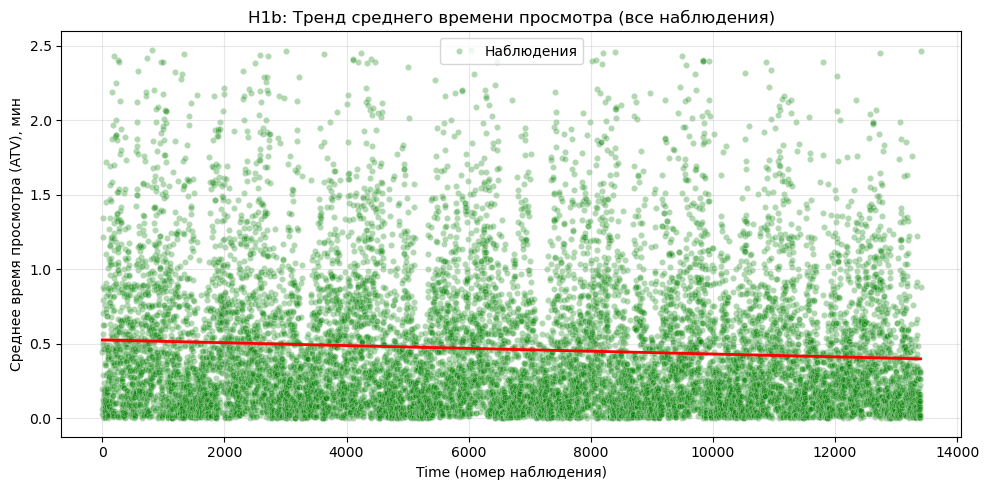

In [42]:
fig, axes = plt.subplots(1, 1, figsize=(10, 5))

ax1 = axes
sns.scatterplot(x='Time', y='ATV[Сумма]', data=df_new, alpha=0.3, s=20, ax=ax1, color='green', label='Наблюдения')

sns.regplot(x='Time', y='ATV[Сумма]', data=df_new, scatter=False, ci=95, ax=ax1, line_kws={'color': 'red', 'lw': 2, 'label': 'Линейный тренд'})

ax1.set_title('H1b: Тренд среднего времени просмотра (все наблюдения)', fontsize=12)
ax1.set_xlabel('Time (номер наблюдения)')
ax1.set_ylabel('Среднее время просмотра (ATV), мин')
ax1.legend()
ax1.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('graph53.png', dpi=300, bbox_inches='tight')
plt.show()

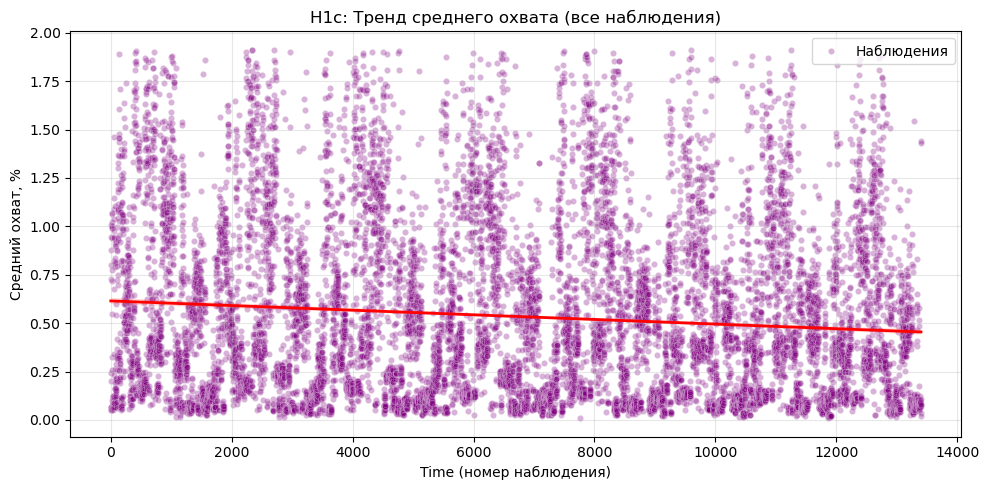

In [43]:
fig, axes = plt.subplots(1, 1, figsize=(10, 5))

ax1 = axes
sns.scatterplot(x='Time', y='AvReach%', data=df_new, alpha=0.3, s=20, ax=ax1, color='purple', label='Наблюдения')

sns.regplot(x='Time', y='AvReach%', data=df_new, scatter=False, ci=95, ax=ax1, line_kws={'color': 'red', 'lw': 2, 'label': 'Линейный тренд'})

ax1.set_title('H1c: Тренд среднего охвата (все наблюдения)', fontsize=12)
ax1.set_xlabel('Time (номер наблюдения)')
ax1.set_ylabel('Средний охват, %')
ax1.legend()
ax1.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('graph54.png', dpi=300, bbox_inches='tight')
plt.show()

H2

In [44]:
df_vvp = pd.read_excel('ВВП.xls')
df_vvp

,Наименования показателя,2020,2021,2022,2023
0,Валовой внутренний продукт текущих ценах (млрд...,107658.13103,134727.4674,157001.3938,174265.725757


In [45]:
df_new['Year'] = df_new['Период'].str[-4:]

gdp_dict = {'2020': df_vvp[2020].iloc[0],
    '2021': df_vvp[2021].iloc[0],
    '2022': df_vvp[2022].iloc[0],
    '2023': df_vvp[2023].iloc[0]}


df_new['GDP'] = df_new['Year'].map(gdp_dict)
df_new = df_new.drop(columns=['Year'])
df_new['ln_GDP'] = np.log(df_new['GDP'])

df_new.head()

,Канал,Рекламодатель,Rtg(000)[Сумма],Rtg%[Сумма],AvReach(000),AvReach%,CumReach(000),CumReach%,StandRtg%[Сумма],Universe(000),...,ln_RTG,ln_AvReach,Дата,Time,HalfYear_1,COVID_dummy,InternetPenetration,ln_InternetPenetration,GDP,ln_GDP
0,СОЛНЦЕ (СЕТЕВОЕ ВЕЩАНИЕ),ТАНДЕР,61086.86982,44.78713,331.81915,0.24328,11601.97936,8.50624,41.32295,136393.79299,...,3.801921,-1.413542,2020-06-30,1,1,1,82.0,4.406719,107658.13103,11.586716
1,ДЕТСКИЙ РЕКЛАМНЫЙ КАНАЛ (СЕТЕВОЕ ВЕЩАНИЕ),20TH CENTURY FOX FILM CORPORATION,8875.31985,6.50713,82.94691,0.06081,2098.36817,1.53846,3.70177,136393.79299,...,1.872898,-2.800001,2020-06-30,2,1,1,82.0,4.406719,107658.13103,11.586716
2,ДЕТСКИЙ РЕКЛАМНЫЙ КАНАЛ (СЕТЕВОЕ ВЕЩАНИЕ),GLORIA JEANS,26750.64327,19.61280,72.49497,0.05315,4415.64365,3.23742,12.26935,136393.79300,...,2.976182,-2.934637,2020-06-30,3,1,1,82.0,4.406719,107658.13103,11.586716
3,ДЕТСКИЙ РЕКЛАМНЫЙ КАНАЛ (СЕТЕВОЕ ВЕЩАНИЕ),UNIVERSAL PICTURES INTERNATIONAL RUSSIA,3933.00837,2.88357,89.38655,0.06554,1776.42790,1.30243,2.88357,136393.79303,...,1.059029,-2.725095,2020-06-30,4,1,1,82.0,4.406719,107658.13103,11.586716
4,ДЕТСКИЙ РЕКЛАМНЫЙ КАНАЛ (СЕТЕВОЕ ВЕЩАНИЕ),САКС,2903.04000,2.12843,93.64645,0.06866,1530.73774,1.12229,1.16773,136393.79301,...,0.755385,-2.678588,2020-06-30,5,1,1,82.0,4.406719,107658.13103,11.586716


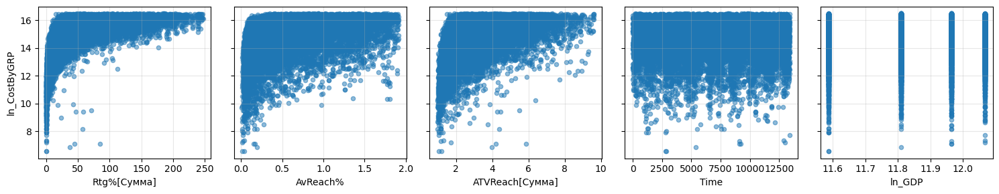

In [46]:
fig, axs = plt.subplots(1, 5, figsize=(15, 3), sharey=True)

axs[0].scatter(df_new['Rtg%[Сумма]'], df_new['ln_CostByGRP'], alpha=0.5, s=20)
axs[0].set_xlabel('Rtg%[Сумма]')
axs[0].set_ylabel('ln_CostByGRP')
axs[0].grid(True, alpha=0.3)

axs[1].scatter(df_new['AvReach%'], df_new['ln_CostByGRP'], alpha=0.5, s=20)
axs[1].set_xlabel('AvReach%')
axs[1].grid(True, alpha=0.3)

axs[2].scatter(df_new['ATVReach[Сумма]'], df_new['ln_CostByGRP'], alpha=0.5, s=20)
axs[2].set_xlabel('ATVReach[Сумма]')
axs[2].grid(True, alpha=0.3)

axs[3].scatter(df_new['Time'], df_new['ln_CostByGRP'], alpha=0.5, s=20)
axs[3].set_xlabel('Time')
axs[3].grid(True, alpha=0.3)

axs[4].scatter(df_new['ln_GDP'], df_new['ln_CostByGRP'], alpha=0.5, s=20)
axs[4].set_xlabel('ln_GDP')
axs[4].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('graph55.png', dpi=300, bbox_inches='tight')
plt.show()

In [47]:
Y = df_new['ln_CostByGRP']
X = df_new[['ln_RTG', 'Time','ln_GDP','Advertiser_type']]
X = sm.add_constant(X)
model = sm.OLS(Y,X)
res = model.fit()
print (res.summary())
coef = res.params['Time']
pval = res.pvalues['Time']
int = res.conf_int().loc['Time']
print(f"Коэффициент при Time: {coef:.4f}")
print(f"p-value: {pval:.4f}")
print(f"95% доверительный интервал: [{int[0]:.4f}, {int[1]:.4f}]")
alpha = 0.10
if coef < 0 and pval < alpha:
        print(f"\n Гипотеза подтверждена")
else:
        print(f"\n Гипотеза не подтверждена")

                            OLS Regression Results                            
Dep. Variable:           ln_CostByGRP   R-squared:                       0.732
Model:                            OLS   Adj. R-squared:                  0.732
Method:                 Least Squares   F-statistic:                     9158.
Date:                Mon, 11 May 2026   Prob (F-statistic):               0.00
Time:                        13:57:39   Log-Likelihood:                -14516.
No. Observations:               13400   AIC:                         2.904e+04
Df Residuals:                   13395   BIC:                         2.908e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const              26.3319      1.407     

In [48]:
from io import StringIO

summary_text = res.summary()

fig, ax = plt.subplots(figsize=(10, 6))
ax.axis('off') 
ax.text(0, 1, summary_text, fontsize=10, family='monospace', verticalalignment='top')

plt.savefig('graph56.png', bbox_inches='tight', dpi=300)
plt.close()

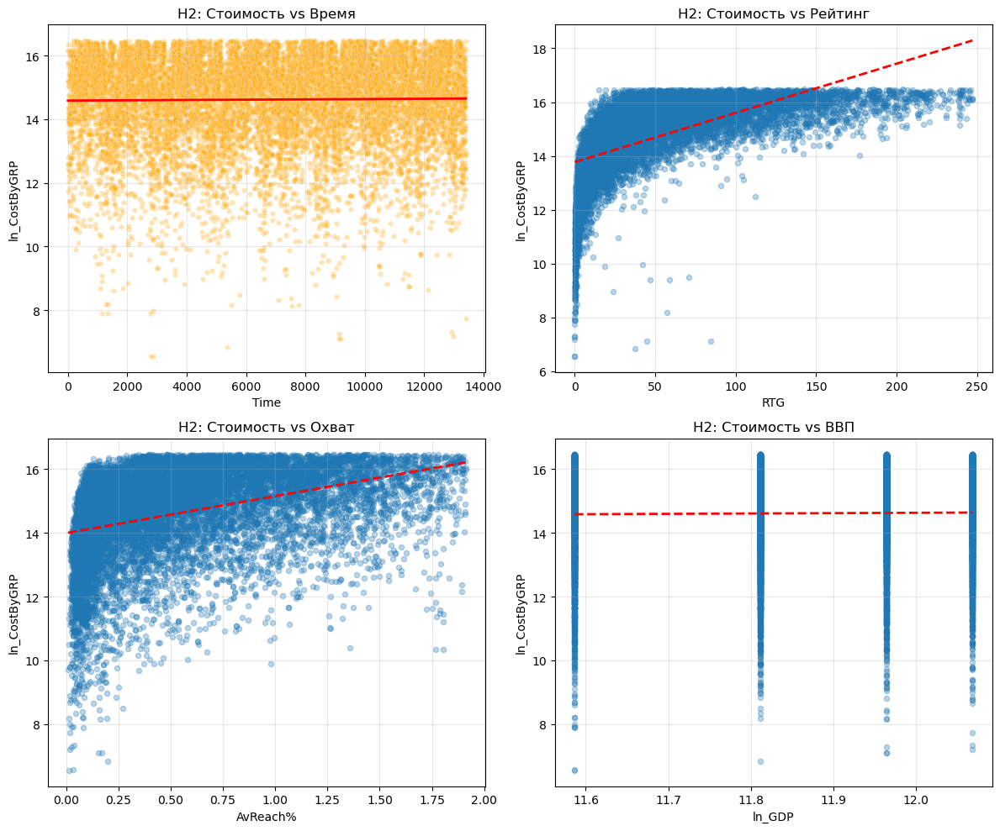

In [49]:
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

ax1 = axes[0, 0]
sns.scatterplot(x='Time', y='ln_CostByGRP', data=df_new, alpha=0.3, s=20, ax=ax1, color='orange')
sns.regplot(x='Time', y='ln_CostByGRP', data=df_new, scatter=False, ci=95, ax=ax1, line_kws={'color': 'red', 'lw': 2})
ax1.set_title('H2: Стоимость vs Время')
ax1.set_xlabel('Time')
ax1.set_ylabel('ln_CostByGRP')
ax1.grid(True, alpha=0.3)

ax2 = axes[0, 1]
ax2.scatter(df_new['Rtg%[Сумма]'], df_new['ln_CostByGRP'], alpha=0.3, s=20)
z = np.polyfit(df_new['Rtg%[Сумма]'], df_new['ln_CostByGRP'], 1)
p = np.poly1d(z)
x_range = np.linspace(df_new['Rtg%[Сумма]'].min(), df_new['Rtg%[Сумма]'].max(), 100)
ax2.plot(x_range, p(x_range), "r--", lw=2)
ax2.set_title('H2: Стоимость vs Рейтинг')
ax2.set_xlabel('RTG')
ax2.set_ylabel('ln_CostByGRP')
ax2.grid(True, alpha=0.3)

ax3 = axes[1, 0]
ax3.scatter(df_new['AvReach%'], df_new['ln_CostByGRP'], alpha=0.3, s=20)
z = np.polyfit(df_new['AvReach%'], df_new['ln_CostByGRP'], 1)
p = np.poly1d(z)
x_range = np.linspace(df_new['AvReach%'].min(), df_new['AvReach%'].max(), 100)
ax3.plot(x_range, p(x_range), "r--", lw=2)
ax3.set_title('H2: Стоимость vs Охват')
ax3.set_xlabel('AvReach%')
ax3.set_ylabel('ln_CostByGRP')
ax3.grid(True, alpha=0.3)

ax4 = axes[1, 1]
ax4.scatter(df_new['ln_GDP'], df_new['ln_CostByGRP'], alpha=0.3, s=20)
z = np.polyfit(df_new['ln_GDP'], df_new['ln_CostByGRP'], 1)
p = np.poly1d(z)
x_range = np.linspace(df_new['ln_GDP'].min(), df_new['ln_GDP'].max(), 100)
ax4.plot(x_range, p(x_range), "r--", lw=2)
ax4.set_title('H2: Стоимость vs ВВП')
ax4.set_xlabel('ln_GDP')
ax4.set_ylabel('ln_CostByGRP')
ax4.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('graph57.png', dpi=300, bbox_inches='tight')
plt.show()

H3

In [50]:
df_sales = pd.read_excel('доля продаж.xlsx')
df_sales

,Наименование показателя,2020,2021,2022,2023
0,Доля продаж через Интернет,3.9,5.1,6,8.1


In [51]:
yearly_data_2 = {2020: df_sales[2020].iloc[0],
    2021: df_sales[2021].iloc[0],
    2022: df_sales[2022].iloc[0],
    2023: df_sales[2023].iloc[0]}

def interpolate_sales(date_obj):
    year = date_obj.year
    month = date_obj.month
    half = 1 if month <= 6 else 2
    
    try:
        if year == 2020:
            if half == 1:
                return yearly_data_2[2020] + 0.5 * (yearly_data_2[2021] - yearly_data_2[2020])
            else:
                return yearly_data_2[2021]
        elif year == 2021:
            if half == 1:
                return yearly_data_2[2021] + 0.5 * (yearly_data_2[2022] - yearly_data_2[2021])
            else:
                return yearly_data_2[2022]
        elif year == 2022:
            if half == 1:
                return yearly_data_2[2022] + 0.5 * (yearly_data_2[2023] - yearly_data_2[2022])
            else:
                return yearly_data_2[2023]
        elif year == 2023:
            return yearly_data_2[2023]
    except Exception:
        return None

df_new['Internet_sales'] = df_new['Дата'].apply(interpolate_sales)
df_new['ln_Internet_sales'] = np.log(df_new['Internet_sales'])
df_new.head()

,Канал,Рекламодатель,Rtg(000)[Сумма],Rtg%[Сумма],AvReach(000),AvReach%,CumReach(000),CumReach%,StandRtg%[Сумма],Universe(000),...,Дата,Time,HalfYear_1,COVID_dummy,InternetPenetration,ln_InternetPenetration,GDP,ln_GDP,Internet_sales,ln_Internet_sales
0,СОЛНЦЕ (СЕТЕВОЕ ВЕЩАНИЕ),ТАНДЕР,61086.86982,44.78713,331.81915,0.24328,11601.97936,8.50624,41.32295,136393.79299,...,2020-06-30,1,1,1,82.0,4.406719,107658.13103,11.586716,4.5,1.504077
1,ДЕТСКИЙ РЕКЛАМНЫЙ КАНАЛ (СЕТЕВОЕ ВЕЩАНИЕ),20TH CENTURY FOX FILM CORPORATION,8875.31985,6.50713,82.94691,0.06081,2098.36817,1.53846,3.70177,136393.79299,...,2020-06-30,2,1,1,82.0,4.406719,107658.13103,11.586716,4.5,1.504077
2,ДЕТСКИЙ РЕКЛАМНЫЙ КАНАЛ (СЕТЕВОЕ ВЕЩАНИЕ),GLORIA JEANS,26750.64327,19.61280,72.49497,0.05315,4415.64365,3.23742,12.26935,136393.79300,...,2020-06-30,3,1,1,82.0,4.406719,107658.13103,11.586716,4.5,1.504077
3,ДЕТСКИЙ РЕКЛАМНЫЙ КАНАЛ (СЕТЕВОЕ ВЕЩАНИЕ),UNIVERSAL PICTURES INTERNATIONAL RUSSIA,3933.00837,2.88357,89.38655,0.06554,1776.42790,1.30243,2.88357,136393.79303,...,2020-06-30,4,1,1,82.0,4.406719,107658.13103,11.586716,4.5,1.504077
4,ДЕТСКИЙ РЕКЛАМНЫЙ КАНАЛ (СЕТЕВОЕ ВЕЩАНИЕ),САКС,2903.04000,2.12843,93.64645,0.06866,1530.73774,1.12229,1.16773,136393.79301,...,2020-06-30,5,1,1,82.0,4.406719,107658.13103,11.586716,4.5,1.504077


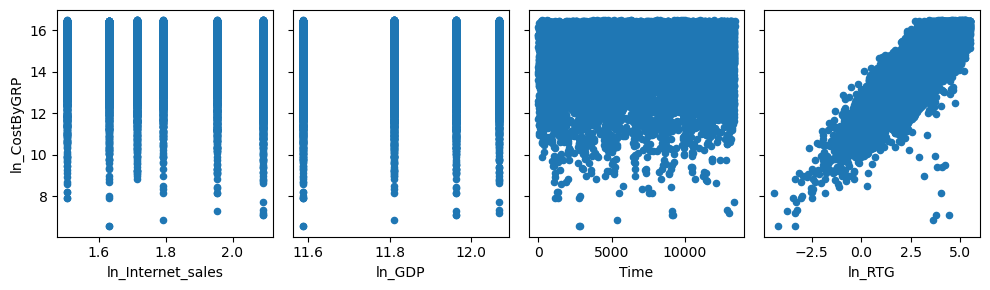

In [52]:
fig, axs = plt.subplots(1, 4, sharey=True)

df_new.plot(kind='scatter', x='ln_Internet_sales', y='ln_CostByGRP', ax=axs[0], figsize=(10, 3))
df_new.plot(kind='scatter', x='ln_GDP', y='ln_CostByGRP', ax=axs[1])
df_new.plot(kind='scatter', x='Time', y='ln_CostByGRP', ax=axs[2])
df_new.plot(kind='scatter', x='ln_RTG', y='ln_CostByGRP', ax=axs[3])

plt.tight_layout()
plt.savefig('graph58.png', dpi=300, bbox_inches='tight')
plt.show()

In [53]:
Y = df_new['ln_CostByGRP']
X = df_new[['ln_Internet_sales', 'ln_GDP', 'Time', 'ln_RTG']]
X = sm.add_constant(X)  
model = sm.OLS(Y, X)
res = model.fit() 
print(res.summary())

coef = res.params['ln_Internet_sales']
pval = res.pvalues['ln_Internet_sales']
conf_int = res.conf_int().loc['ln_Internet_sales']

print(f"Коэффициент при ln_Internet_sales: {coef:.4f}")
print(f"p-value: {pval:.4f}")
print(f"95% доверительный интервал: [{conf_int[0]:.4f}, {conf_int[1]:.4f}]")
alpha = 0.10  
if coef < 0 and pval < alpha:
    print("Гипотеза подтверждена")
    print(f"При росте интернет-продаж на 1%, стоимость за GRP снижается на {abs(coef):.1%}.")
    print("Это свидетельствует об эффекте замещения.")
else:
    print("Гипотеза не подтверждена")

                            OLS Regression Results                            
Dep. Variable:           ln_CostByGRP   R-squared:                       0.731
Model:                            OLS   Adj. R-squared:                  0.731
Method:                 Least Squares   F-statistic:                     9115.
Date:                Mon, 11 May 2026   Prob (F-statistic):               0.00
Time:                        13:59:08   Log-Likelihood:                -14539.
No. Observations:               13400   AIC:                         2.909e+04
Df Residuals:                   13395   BIC:                         2.913e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                24.8412      1.45

In [54]:
from io import StringIO

summary_text = res.summary()

fig, ax = plt.subplots(figsize=(10, 6))
ax.axis('off') 
ax.text(0, 1, summary_text, fontsize=10, family='monospace', verticalalignment='top')

plt.savefig('graph59.png', bbox_inches='tight', dpi=300)
plt.close()

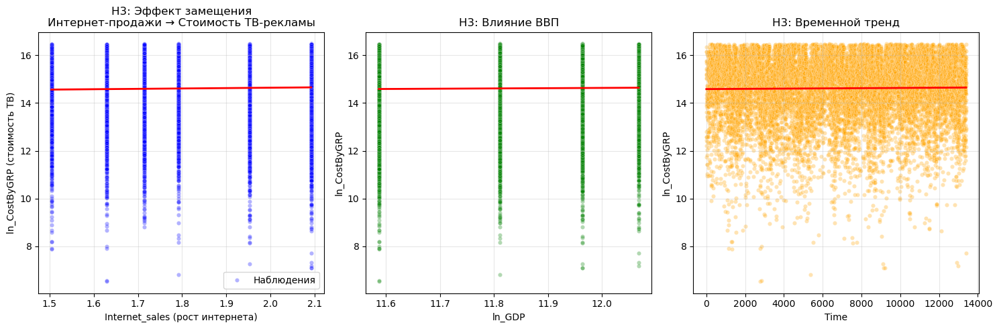

In [55]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

ax1 = axes[0]
sns.scatterplot(x='ln_Internet_sales', y='ln_CostByGRP', data=df_new, 
                alpha=0.3, s=20, ax=ax1, color='blue', label='Наблюдения')
sns.regplot(x='ln_Internet_sales', y='ln_CostByGRP', data=df_new, 
            scatter=False, ci=95, ax=ax1, line_kws={'color': 'red', 'lw': 2, 'label': 'Тренд'})
ax1.set_title('H3: Эффект замещения\nИнтернет-продажи → Стоимость ТВ-рекламы', fontsize=12)
ax1.set_xlabel('Internet_sales (рост интернета)')
ax1.set_ylabel('ln_CostByGRP (стоимость ТВ)')
ax1.legend()
ax1.grid(True, alpha=0.3)

ax2 = axes[1]
sns.scatterplot(x='ln_GDP', y='ln_CostByGRP', data=df_new, 
                alpha=0.3, s=20, ax=ax2, color='green')
sns.regplot(x='ln_GDP', y='ln_CostByGRP', data=df_new, 
            scatter=False, ci=95, ax=ax2, line_kws={'color': 'red', 'lw': 2})
ax2.set_title('H3: Влияние ВВП', fontsize=12)
ax2.set_xlabel('ln_GDP')
ax2.set_ylabel('ln_CostByGRP')
ax2.grid(True, alpha=0.3)

ax3 = axes[2]
sns.scatterplot(x='Time', y='ln_CostByGRP', data=df_new, 
                alpha=0.3, s=20, ax=ax3, color='orange')
sns.regplot(x='Time', y='ln_CostByGRP', data=df_new, 
            scatter=False, ci=95, ax=ax3, line_kws={'color': 'red', 'lw': 2})
ax3.set_title('H3: Временной тренд', fontsize=12)
ax3.set_xlabel('Time')
ax3.set_ylabel('ln_CostByGRP')
ax3.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('graph60.png', dpi=300, bbox_inches='tight')
plt.show()

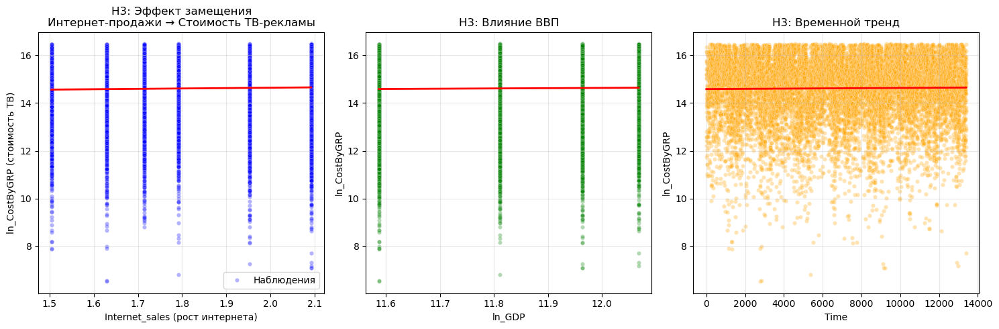

In [56]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

ax1 = axes[0]
sns.scatterplot(x='ln_Internet_sales', y='ln_CostByGRP', data=df_new, 
                alpha=0.3, s=20, ax=ax1, color='blue', label='Наблюдения')
sns.regplot(x='ln_Internet_sales', y='ln_CostByGRP', data=df_new, 
            scatter=False, ci=95, ax=ax1, line_kws={'color': 'red', 'lw': 2, 'label': 'Тренд'})
ax1.set_title('H3: Эффект замещения\nИнтернет-продажи → Стоимость ТВ-рекламы', fontsize=12)
ax1.set_xlabel('Internet_sales (рост интернета)')
ax1.set_ylabel('ln_CostByGRP (стоимость ТВ)')
ax1.legend()
ax1.grid(True, alpha=0.3)

ax2 = axes[1]
sns.scatterplot(x='ln_GDP', y='ln_CostByGRP', data=df_new, 
                alpha=0.3, s=20, ax=ax2, color='green')
sns.regplot(x='ln_GDP', y='ln_CostByGRP', data=df_new, 
            scatter=False, ci=95, ax=ax2, line_kws={'color': 'red', 'lw': 2})
ax2.set_title('H3: Влияние ВВП', fontsize=12)
ax2.set_xlabel('ln_GDP')
ax2.set_ylabel('ln_CostByGRP')
ax2.grid(True, alpha=0.3)

ax3 = axes[2]
sns.scatterplot(x='Time', y='ln_CostByGRP', data=df_new, 
                alpha=0.3, s=20, ax=ax3, color='orange')
sns.regplot(x='Time', y='ln_CostByGRP', data=df_new, 
            scatter=False, ci=95, ax=ax3, line_kws={'color': 'red', 'lw': 2})
ax3.set_title('H3: Временной тренд', fontsize=12)
ax3.set_xlabel('Time')
ax3.set_ylabel('ln_CostByGRP')
ax3.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('graph61.png', dpi=300, bbox_inches='tight')
plt.show()

In [58]:
df_agg = df_new.groupby('Период').agg({
    'ln_RTG': 'mean',
    'ln_ATV': 'mean',
    'ln_AvReach': 'mean',
    'ln_CostByGRP': 'mean',
    'ln_ATVReach[Сумма]': 'mean',
    'Advertiser_type':'mean'
}).reset_index()

def period_to_middate1(period):
    period = str(period)
    if '1 полугодие' in period:
        year = period.split()[-1]
        return pd.to_datetime(f"{year}-06-30")
    elif '2 полугодие' in period:
        year = period.split()[-1]
        return pd.to_datetime(f"{year}-12-31")

df_agg['Дата'] = df_agg['Период'].apply(period_to_middate1)
df_agg = df_agg.sort_values('Дата').reset_index(drop=True)
df_agg['Time'] = np.arange(1, len(df_agg) + 1) 
df_agg['HalfYear_1'] = (df_agg['Дата'].dt.month == 6).astype(np.int32)  
df_agg['COVID_dummy'] = df_agg['Дата'].dt.year.isin([2020, 2021]).astype(np.int32)

df_agg.head()

C:\Users\proho\AppData\Local\Temp\ipykernel_4720\1494013755.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_agg = df_new.groupby('Период').agg({


,Период,ln_RTG,ln_ATV,ln_AvReach,ln_CostByGRP,ln_ATVReach[Сумма],Advertiser_type,Дата,Time,HalfYear_1,COVID_dummy
0,1 полугодие 2020,3.293999,-1.311177,-0.975377,14.592380,1.080516,0.476813,2020-06-30,1,1,1
1,2 полугодие 2020,3.244066,-1.361110,-1.006459,14.603755,1.087305,0.500578,2020-12-31,2,0,1
2,1 полугодие 2021,3.219660,-1.385499,-1.050769,14.504263,1.086013,0.514166,2021-06-30,3,1,1
3,2 полугодие 2021,3.251875,-1.353290,-1.081880,14.675116,1.112594,0.530978,2021-12-31,4,0,1
4,1 полугодие 2022,3.105759,-1.499427,-1.060821,14.547424,1.050286,0.522138,2022-06-30,5,1,0


In [59]:
yearly_data_internet = {
    2020: df_internet[2020].iloc[0],
    2021: df_internet[2021].iloc[0],
    2022: df_internet[2022].iloc[0],
    2023: df_internet[2023].iloc[0]
}

def interpolate_internet(date_obj):
    year = date_obj.year
    month = date_obj.month
    half = 1 if month <= 6 else 2
    
    try:
        if year == 2020:
            if half == 1:
                return yearly_data_internet[2020] + 0.5 * (yearly_data_internet[2021] - yearly_data_internet[2020])
            else:
                return yearly_data_internet[2021]
        elif year == 2021:
            if half == 1:
                return yearly_data_internet[2021] + 0.5 * (yearly_data_internet[2022] - yearly_data_internet[2021])
            else:
                return yearly_data_internet[2022]
        elif year == 2022:
            if half == 1:
                return yearly_data_internet[2022] + 0.5 * (yearly_data_internet[2023] - yearly_data_internet[2022])
            else:
                return yearly_data_internet[2023]
        elif year == 2023:
            return yearly_data_internet[2023]
    except Exception:
        return None

df_agg['InternetPenetration'] = df_agg['Дата'].apply(interpolate_internet)
df_agg['ln_InternetPenetration'] = np.log(df_new['InternetPenetration'])
df_agg.head()

,Период,ln_RTG,ln_ATV,ln_AvReach,ln_CostByGRP,ln_ATVReach[Сумма],Advertiser_type,Дата,Time,HalfYear_1,COVID_dummy,InternetPenetration,ln_InternetPenetration
0,1 полугодие 2020,3.293999,-1.311177,-0.975377,14.592380,1.080516,0.476813,2020-06-30,1,1,1,82.00,4.406719
1,2 полугодие 2020,3.244066,-1.361110,-1.006459,14.603755,1.087305,0.500578,2020-12-31,2,0,1,84.00,4.406719
2,1 полугодие 2021,3.219660,-1.385499,-1.050769,14.504263,1.086013,0.514166,2021-06-30,3,1,1,85.30,4.406719
3,2 полугодие 2021,3.251875,-1.353290,-1.081880,14.675116,1.112594,0.530978,2021-12-31,4,0,1,86.60,4.406719
4,1 полугодие 2022,3.105759,-1.499427,-1.060821,14.547424,1.050286,0.522138,2022-06-30,5,1,0,87.25,4.406719


H1a

In [60]:
Y = df_agg['ln_RTG']
X = df_agg[['Time', 'HalfYear_1', 'COVID_dummy', 'ln_InternetPenetration','Advertiser_type']]
X = sm.add_constant(X)
model = sm.OLS(Y,X)
res = model.fit()
print (res.summary())
coef = res.params['Time']
pval = res.pvalues['Time']
int = res.conf_int().loc['Time']
print(f"Коэффициент при Time: {coef:.4f}")
print(f"p-value: {pval:.4f}")
print(f"95% доверительный интервал: [{int[0]:.4f}, {int[1]:.4f}]")
alpha = 0.10
if coef < 0 and pval < alpha:
        print(f"Гипотеза подтверждена")
else:
        print(f"Гипотеза не подтверждена")

                            OLS Regression Results                            
Dep. Variable:                 ln_RTG   R-squared:                       0.809
Model:                            OLS   Adj. R-squared:                  0.554
Method:                 Least Squares   F-statistic:                     3.173
Date:                Mon, 11 May 2026   Prob (F-statistic):              0.185
Time:                        14:01:52   Log-Likelihood:                 15.793
No. Observations:                   8   AIC:                            -21.59
Df Residuals:                       3   BIC:                            -21.19
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
Time                      -0

C:\Users\proho\anaconda3\an\Lib\site-packages\scipy\stats\_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


In [61]:
from io import StringIO

summary_text = res.summary()

fig, ax = plt.subplots(figsize=(10, 6))
ax.axis('off') 
ax.text(0, 1, summary_text, fontsize=10, family='monospace', verticalalignment='top')

plt.savefig('graph62.png', bbox_inches='tight', dpi=300)
plt.close()

C:\Users\proho\anaconda3\an\Lib\site-packages\scipy\stats\_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


H1b

In [62]:
Y = df_agg['ln_ATV']
X = df_agg[['Time', 'HalfYear_1', 'COVID_dummy', 'ln_InternetPenetration','Advertiser_type']]
X = sm.add_constant(X)
model = sm.OLS(Y,X)
res = model.fit()
print (res.summary())
coef = res.params['Time']
pval = res.pvalues['Time']
int = res.conf_int().loc['Time']
print(f"Коэффициент при Time: {coef:.4f}")
print(f"p-value: {pval:.4f}")
print(f"95% доверительный интервал: [{int[0]:.4f}, {int[1]:.4f}]")
alpha = 0.10
if coef < 0 and pval < alpha:
        print(f"\n Гипотеза подтверждена")
else:
        print(f"\n Гипотеза не подтверждена")

                            OLS Regression Results                            
Dep. Variable:                 ln_ATV   R-squared:                       0.809
Model:                            OLS   Adj. R-squared:                  0.554
Method:                 Least Squares   F-statistic:                     3.172
Date:                Mon, 11 May 2026   Prob (F-statistic):              0.185
Time:                        14:02:33   Log-Likelihood:                 15.792
No. Observations:                   8   AIC:                            -21.58
Df Residuals:                       3   BIC:                            -21.19
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
Time                      -0

C:\Users\proho\anaconda3\an\Lib\site-packages\scipy\stats\_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


In [63]:
from io import StringIO

summary_text = res.summary()

fig, ax = plt.subplots(figsize=(10, 6))
ax.axis('off') 
ax.text(0, 1, summary_text, fontsize=10, family='monospace', verticalalignment='top')

plt.savefig('graph63.png', bbox_inches='tight', dpi=300)
plt.close()

C:\Users\proho\anaconda3\an\Lib\site-packages\scipy\stats\_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


H1c

In [64]:
Y = df_agg['ln_AvReach']
X = df_agg[['Time', 'HalfYear_1', 'COVID_dummy', 'ln_InternetPenetration','Advertiser_type']]
X = sm.add_constant(X)
model = sm.OLS(Y,X)
res = model.fit()
print (res.summary())
coef = res.params['Time']
pval = res.pvalues['Time']
int = res.conf_int().loc['Time']
print(f"Коэффициент при Time: {coef:.4f}")
print(f"p-value: {pval:.4f}")
print(f"95% доверительный интервал: [{int[0]:.4f}, {int[1]:.4f}]")
alpha = 0.10
if coef < 0 and pval < alpha:
        print(f"\n Гипотеза подтверждена")
else:
        print(f"\n Гипотеза не подтверждена")

                            OLS Regression Results                            
Dep. Variable:             ln_AvReach   R-squared:                       0.929
Model:                            OLS   Adj. R-squared:                  0.833
Method:                 Least Squares   F-statistic:                     9.760
Date:                Mon, 11 May 2026   Prob (F-statistic):             0.0456
Time:                        14:03:08   Log-Likelihood:                 19.255
No. Observations:                   8   AIC:                            -28.51
Df Residuals:                       3   BIC:                            -28.11
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
Time                      -0

C:\Users\proho\anaconda3\an\Lib\site-packages\scipy\stats\_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


In [65]:
from io import StringIO

summary_text = res.summary()

fig, ax = plt.subplots(figsize=(10, 6))
ax.axis('off') 
ax.text(0, 1, summary_text, fontsize=10, family='monospace', verticalalignment='top')

plt.savefig('graph64.png', bbox_inches='tight', dpi=300)
plt.close()

C:\Users\proho\anaconda3\an\Lib\site-packages\scipy\stats\_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


H2

In [66]:
df_vvp = pd.read_excel('ВВП.xls')
df_vvp

,Наименования показателя,2020,2021,2022,2023
0,Валовой внутренний продукт текущих ценах (млрд...,107658.13103,134727.4674,157001.3938,174265.725757


In [67]:
df_agg['Year'] = df_agg['Период'].str[-4:]

gdp_dict = {'2020': df_vvp[2020].iloc[0],
    '2021': df_vvp[2021].iloc[0],
    '2022': df_vvp[2022].iloc[0],
    '2023': df_vvp[2023].iloc[0]}


df_agg['GDP'] = df_agg['Year'].map(gdp_dict)
df_agg = df_agg.drop(columns=['Year'])
df_agg['ln_GDP'] = np.log(df_agg['GDP'])

df_agg.head()

,Период,ln_RTG,ln_ATV,ln_AvReach,ln_CostByGRP,ln_ATVReach[Сумма],Advertiser_type,Дата,Time,HalfYear_1,COVID_dummy,InternetPenetration,ln_InternetPenetration,GDP,ln_GDP
0,1 полугодие 2020,3.293999,-1.311177,-0.975377,14.592380,1.080516,0.476813,2020-06-30,1,1,1,82.00,4.406719,107658.13103,11.586716
1,2 полугодие 2020,3.244066,-1.361110,-1.006459,14.603755,1.087305,0.500578,2020-12-31,2,0,1,84.00,4.406719,107658.13103,11.586716
2,1 полугодие 2021,3.219660,-1.385499,-1.050769,14.504263,1.086013,0.514166,2021-06-30,3,1,1,85.30,4.406719,134727.46740,11.811009
3,2 полугодие 2021,3.251875,-1.353290,-1.081880,14.675116,1.112594,0.530978,2021-12-31,4,0,1,86.60,4.406719,134727.46740,11.811009
4,1 полугодие 2022,3.105759,-1.499427,-1.060821,14.547424,1.050286,0.522138,2022-06-30,5,1,0,87.25,4.406719,157001.39380,11.964010


In [68]:
Y = df_agg['ln_CostByGRP']
X = df_agg[['ln_RTG', 'Time','ln_GDP','Advertiser_type']]
X = sm.add_constant(X)
model = sm.OLS(Y,X)
res = model.fit()
print (res.summary())
coef = res.params['Time']
pval = res.pvalues['Time']
int = res.conf_int().loc['Time']
print(f"Коэффициент при Time: {coef:.4f}")
print(f"p-value: {pval:.4f}")
print(f"95% доверительный интервал: [{int[0]:.4f}, {int[1]:.4f}]")
alpha = 0.10
if coef < 0 and pval < alpha:
        print(f"\n Гипотеза подтверждена")
else:
        print(f"\n Гипотеза не подтверждена")

                            OLS Regression Results                            
Dep. Variable:           ln_CostByGRP   R-squared:                       0.908
Model:                            OLS   Adj. R-squared:                  0.784
Method:                 Least Squares   F-statistic:                     7.358
Date:                Mon, 11 May 2026   Prob (F-statistic):             0.0664
Time:                        14:04:04   Log-Likelihood:                 19.021
No. Observations:                   8   AIC:                            -28.04
Df Residuals:                       3   BIC:                            -27.65
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const              16.7440      3.820     

C:\Users\proho\anaconda3\an\Lib\site-packages\scipy\stats\_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


In [69]:
from io import StringIO

summary_text = res.summary()

fig, ax = plt.subplots(figsize=(10, 6))
ax.axis('off') 
ax.text(0, 1, summary_text, fontsize=10, family='monospace', verticalalignment='top')

plt.savefig('graph65.png', bbox_inches='tight', dpi=300)
plt.close()

C:\Users\proho\anaconda3\an\Lib\site-packages\scipy\stats\_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


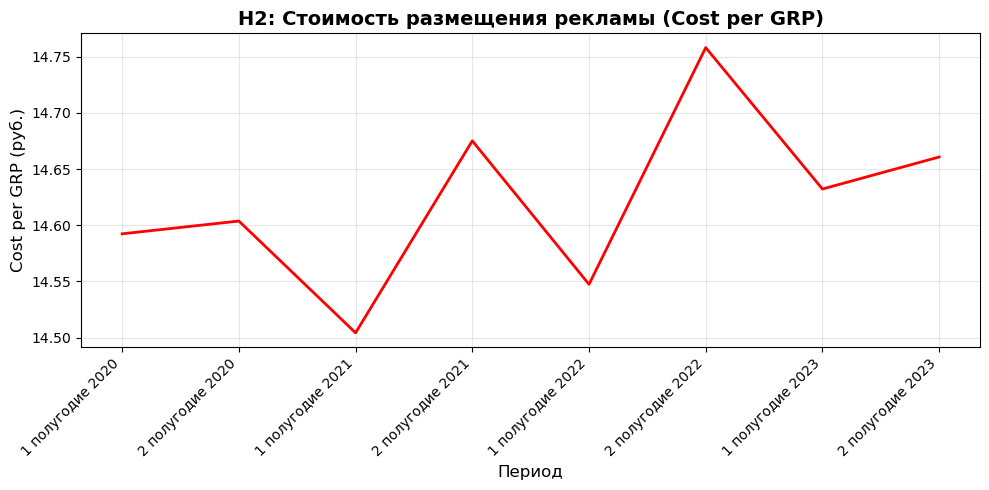

In [70]:
plt.figure(figsize=(10, 5))
period_labels = df_agg['Период'].values

plt.plot(period_labels, df_agg['ln_CostByGRP'], color='red', linewidth=2, markersize=8)
plt.title('H2: Стоимость размещения рекламы (Cost per GRP)', fontsize=14, fontweight='bold')
plt.ylabel('Cost per GRP (руб.)', fontsize=12)
plt.xlabel('Период', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('graph66.png', bbox_inches='tight', dpi=300)
plt.show()

H3

In [71]:
df_sales = pd.read_excel('доля продаж.xlsx')
df_sales

,Наименование показателя,2020,2021,2022,2023
0,Доля продаж через Интернет,3.9,5.1,6,8.1


In [72]:
yearly_data_2 = {2020: df_sales[2020].iloc[0],
    2021: df_sales[2021].iloc[0],
    2022: df_sales[2022].iloc[0],
    2023: df_sales[2023].iloc[0]}

def interpolate_sales(date_obj):
    year = date_obj.year
    month = date_obj.month
    half = 1 if month <= 6 else 2
    
    try:
        if year == 2020:
            if half == 1:
                return yearly_data_2[2020] + 0.5 * (yearly_data_2[2021] - yearly_data_2[2020])
            else:
                return yearly_data_2[2021]
        elif year == 2021:
            if half == 1:
                return yearly_data_2[2021] + 0.5 * (yearly_data_2[2022] - yearly_data_2[2021])
            else:
                return yearly_data_2[2022]
        elif year == 2022:
            if half == 1:
                return yearly_data_2[2022] + 0.5 * (yearly_data_2[2023] - yearly_data_2[2022])
            else:
                return yearly_data_2[2023]
        elif year == 2023:
            return yearly_data_2[2023]
    except Exception:
        return None

df_agg['Internet_sales'] = df_agg['Дата'].apply(interpolate_sales)
df_agg['ln_Internet_sales'] = df_agg['Дата'].apply(interpolate_sales)
df_agg.head()

,Период,ln_RTG,ln_ATV,ln_AvReach,ln_CostByGRP,ln_ATVReach[Сумма],Advertiser_type,Дата,Time,HalfYear_1,COVID_dummy,InternetPenetration,ln_InternetPenetration,GDP,ln_GDP,Internet_sales,ln_Internet_sales
0,1 полугодие 2020,3.293999,-1.311177,-0.975377,14.592380,1.080516,0.476813,2020-06-30,1,1,1,82.00,4.406719,107658.13103,11.586716,4.50,4.50
1,2 полугодие 2020,3.244066,-1.361110,-1.006459,14.603755,1.087305,0.500578,2020-12-31,2,0,1,84.00,4.406719,107658.13103,11.586716,5.10,5.10
2,1 полугодие 2021,3.219660,-1.385499,-1.050769,14.504263,1.086013,0.514166,2021-06-30,3,1,1,85.30,4.406719,134727.46740,11.811009,5.55,5.55
3,2 полугодие 2021,3.251875,-1.353290,-1.081880,14.675116,1.112594,0.530978,2021-12-31,4,0,1,86.60,4.406719,134727.46740,11.811009,6.00,6.00
4,1 полугодие 2022,3.105759,-1.499427,-1.060821,14.547424,1.050286,0.522138,2022-06-30,5,1,0,87.25,4.406719,157001.39380,11.964010,7.05,7.05


In [73]:
X = df_agg[['ln_Internet_sales', 'ln_GDP', 'Time', 'ln_RTG','Advertiser_type']]
X = sm.add_constant(X)  
model = sm.OLS(Y, X)
res = model.fit() 
print(res.summary())

coef = res.params['ln_Internet_sales']
pval = res.pvalues['ln_Internet_sales']
conf_int = res.conf_int().loc['ln_Internet_sales']

print(f"Коэффициент при ln_Internet_sales: {coef:.4f}")
print(f"p-value: {pval:.4f}")
print(f"95% доверительный интервал: [{conf_int[0]:.4f}, {conf_int[1]:.4f}]")
alpha = 0.10  
if coef < 0 and pval < alpha:
    print("Гипотеза подтверждена")
    print(f"При росте интернет-продаж на 1%, стоимость за GRP снижается на {abs(coef):.1%}.")
    print("Это свидетельствует об эффекте замещения.")
else:
    print("Гипотеза не подтверждена")

                            OLS Regression Results                            
Dep. Variable:           ln_CostByGRP   R-squared:                       0.946
Model:                            OLS   Adj. R-squared:                  0.811
Method:                 Least Squares   F-statistic:                     7.021
Date:                Mon, 11 May 2026   Prob (F-statistic):              0.129
Time:                        14:05:18   Log-Likelihood:                 21.181
No. Observations:                   8   AIC:                            -30.36
Df Residuals:                       2   BIC:                            -29.89
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                18.7639      3.95

C:\Users\proho\anaconda3\an\Lib\site-packages\scipy\stats\_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


In [74]:
from io import StringIO

summary_text = res.summary()

fig, ax = plt.subplots(figsize=(10, 6))
ax.axis('off') 
ax.text(0, 1, summary_text, fontsize=10, family='monospace', verticalalignment='top')

plt.savefig('graph67.png', bbox_inches='tight', dpi=300)
plt.close()

C:\Users\proho\anaconda3\an\Lib\site-packages\scipy\stats\_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


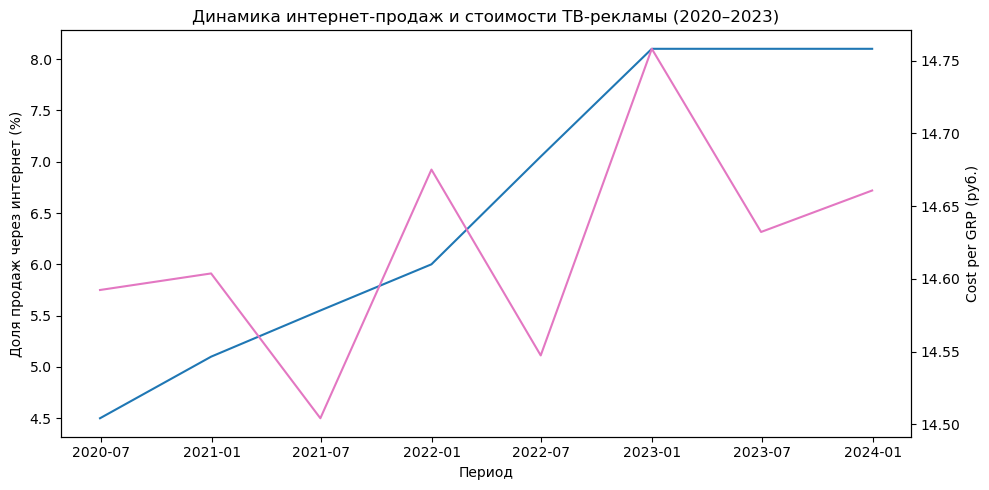

In [75]:
fig, ax1 = plt.subplots(figsize=(10, 5))
ax1.set_xlabel('Период')
ax1.set_ylabel('Доля продаж через интернет (%)')
ax1.plot(df_agg['Дата'], df_agg['ln_Internet_sales'], label='Интернет-продажи')
ax1.tick_params(axis='y')

ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Cost per GRP (руб.)')
ax2.plot(df_agg['Дата'], df_agg['ln_CostByGRP'],color = 'tab:pink',label='CostPerGRP')
ax2.tick_params(axis='y')

plt.title('Динамика интернет-продаж и стоимости ТВ-рекламы (2020–2023)', fontsize=12)
fig.tight_layout()
plt.savefig('graph68.png', bbox_inches='tight', dpi=300)
plt.show()

## Панельные данные (Panel Data) с фиксированными эффектами

In [76]:
from linearmodels import PanelOLS
import statsmodels.formula.api as smf

df_panel = df_new.copy()
results_summary = []

df_panel['Дата'] = df_panel['Дата'].apply(period_to_middate1)
df_panel['Дата'] = pd.to_datetime(df_panel['Дата'])
df_panel = df_panel.sort_values(['Канал', 'Дата'])
df_panel['time_num'] = df_panel.groupby('Канал').cumcount()
df_panel = df_panel.set_index(['Канал', 'time_num'])
df_panel = df_panel.sort_index()

model_h1a = PanelOLS.from_formula(
    'ln_RTG ~ Time + HalfYear_1 + COVID_dummy + ln_InternetPenetration + Advertiser_type + EntityEffects',
    data=df_panel).fit(cov_type='clustered', cluster_entity=True)

print("H1a: Тренд телевизионных рейтингов (фиксированные эффекты)")
print(model_h1a.summary)

coef_time = model_h1a.params['Time']
pval_time = model_h1a.pvalues['Time']
conf_int_time = model_h1a.conf_int().loc['Time'].values

print("Проверка гипотезы Н1а:")
print(f"Коэффициент при Time: {coef_time:.6f}")
print(f"p-value: {pval_time:.6f}")
print(f"95% доверительный интервал: [{conf_int_time[0]:.6f}, {conf_int_time[1]:.6f}]")

alpha = 0.10
if coef_time < 0 and pval_time < alpha:
    print(f"ГИПОТЕЗА H1a ПОДТВЕРЖДЕНА")
    print(f"Обнаружено статистически значимое снижение рейтингов во времени")
    h1a_result = "ПОДТВЕРЖДЕНА"
    h1a_conclusion = f"Рейтинги снижаются на {abs(coef_time):.4f} за единицу времени (p={pval_time:.4f})"
elif coef_time < 0 and pval_time >= alpha:
    print(f"ГИПОТЕЗА H1a НЕ ПОДТВЕРЖДЕНА")
    print(f"Отрицательный тренд есть, но статистически незначим (p={pval_time:.4f} > α={alpha})")
    h1a_result = "НЕ ПОДТВЕРЖДЕНА"
    h1a_conclusion = "Отрицательный тренд незначим"
else:
    print(f"ГИПОТЕЗА H1a ОПРОВЕРГНУТА")
    print(f"Обнаружен положительный или нулевой тренд")
    h1a_result = "ОПРОВЕРГНУТА"
    h1a_conclusion = f"Коэффициент положительный: {coef_time:.4f}"

results_summary.append({
    'Гипотеза': 'H1a: Снижение рейтингов',
    'Коэффициент': coef_time,
    'p-value': pval_time,
    'Результат': h1a_result,
    'Вывод': h1a_conclusion
})

H1a: Тренд телевизионных рейтингов (фиксированные эффекты)
                          PanelOLS Estimation Summary                           
Dep. Variable:                 ln_RTG   R-squared:                        0.0058
Estimator:                   PanelOLS   R-squared (Between):             -0.9121
No. Observations:               13400   R-squared (Within):               0.0058
Date:                Mon, May 11 2026   R-squared (Overall):             -0.5515
Time:                        14:06:04   Log-likelihood                -2.085e+04
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      15.566
Entities:                          34   P-value                           0.0000
Avg Obs:                       394.12   Distribution:                 F(5,13361)
Min Obs:                       19.000                                           
Max Obs:                       847.00   F-statisti

In [77]:
results_text = f"H1a: Тренд телевизионных рейтингов (фиксированные эффекты)\n{model_h1a.summary}"
size = 9
weight = 'normal'
color = 'black'
fig, ax = plt.subplots(figsize=(12, 14))
ax.axis('off')

lines = results_text.split('\n')
for i, line in enumerate(lines):
     ax.text(0.05, 0.98 - i*0.025, line, 
            fontsize=size,
            weight=weight,
            color=color,
            verticalalignment='top',
            transform=ax.transAxes,
            family='monospace')

plt.savefig('graph69.png', 
           dpi=300, 
           bbox_inches='tight', 
           facecolor='white',
           edgecolor='none')
plt.close()

In [78]:
model_h1b = PanelOLS.from_formula(
    'ln_ATV ~ Time + HalfYear_1 + COVID_dummy + ln_InternetPenetration + Advertiser_type + EntityEffects',
    data=df_panel
).fit(cov_type='clustered', cluster_entity=True)
print(model_h1b.summary)

coef_time_h1b = model_h1b.params['Time']
pval_time_h1b = model_h1b.pvalues['Time']
conf_int_time_h1b = model_h1b.conf_int().loc['Time'].values

print("Проверка гипотезы H1b:")
print(f"Коэффициент при Time: {coef_time_h1b:.6f}")
print(f"p-value: {pval_time_h1b:.6f}")
print(f"95% доверительный интервал: [{conf_int_time_h1b[0]:.6f}, {conf_int_time_h1b[1]:.6f}]")

if coef_time_h1b < 0 and pval_time_h1b < alpha:
    print(f"ГИПОТЕЗА H1b ПОДТВЕРЖДЕНА")
    print(f"Обнаружено статистически значимое снижение среднего времени просмотра")
    h1b_result = "ПОДТВЕРЖДЕНА"
    h1b_conclusion = f"Время просмотра снижается на {abs(coef_time_h1b):.4f} за единицу времени (p={pval_time_h1b:.4f})"
elif coef_time_h1b < 0 and pval_time_h1b >= alpha:
    print(f"ГИПОТЕЗА H1b НЕ ПОДТВЕРЖДЕНА")
    print(f"Отрицательный тренд есть, но статистически незначим (p={pval_time_h1b:.4f} > α={alpha})")
    h1b_result = "НЕ ПОДТВЕРЖДЕНА"
    h1b_conclusion = "Отрицательный тренд незначим"
else:
    print(f"ГИПОТЕЗА H1b ОПРОВЕРГНУТА")
    print(f"Обнаружен положительный или нулевой тренд")
    h1b_result = "ОПРОВЕРГНУТА"
    h1b_conclusion = f"Коэффициент положительный: {coef_time_h1b:.4f}"

results_summary.append({
    'Гипотеза': 'H1b: Снижение времени просмотра',
    'Коэффициент': coef_time_h1b,
    'p-value': pval_time_h1b,
    'Результат': h1b_result,
    'Вывод': h1b_conclusion
})

                          PanelOLS Estimation Summary                           
Dep. Variable:                 ln_ATV   R-squared:                        0.0058
Estimator:                   PanelOLS   R-squared (Between):             -24.291
No. Observations:               13400   R-squared (Within):               0.0058
Date:                Mon, May 11 2026   R-squared (Overall):             -19.289
Time:                        14:06:37   Log-likelihood                -2.085e+04
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      15.567
Entities:                          34   P-value                           0.0000
Avg Obs:                       394.12   Distribution:                 F(5,13361)
Min Obs:                       19.000                                           
Max Obs:                       847.00   F-statistic (robust):             7.3199
                            

In [79]:
results_text = f"H1b: Тренд среднего времени просмотра (фиксированные эффекты)\n{model_h1b.summary}"

fig, ax = plt.subplots(figsize=(12, 14))
ax.axis('off')

lines = results_text.split('\n')
for i, line in enumerate(lines):
     ax.text(0.05, 0.98 - i*0.025, line, 
            fontsize=size,
            weight=weight,
            color=color,
            verticalalignment='top',
            transform=ax.transAxes,
            family='monospace')

plt.savefig('graph70.png', 
           dpi=300, 
           bbox_inches='tight', 
           facecolor='white',
           edgecolor='none')
plt.close()

In [80]:
model_h1c = PanelOLS.from_formula(
    'ln_AvReach ~ Time + HalfYear_1 + COVID_dummy + ln_InternetPenetration + Advertiser_type + EntityEffects',
    data=df_panel
).fit(cov_type='clustered', cluster_entity=True)
print(model_h1c.summary)

coef_time_h1c = model_h1c.params['Time']
pval_time_h1c = model_h1c.pvalues['Time']
conf_int_time_h1c = model_h1c.conf_int().loc['Time'].values

print("Проверка гипотезы H1c:")
print(f"Коэффициент при Time: {coef_time_h1c:.6f}")
print(f"p-value: {pval_time_h1c:.6f}")
print(f"95% доверительный интервал: [{conf_int_time_h1c[0]:.6f}, {conf_int_time_h1c[1]:.6f}]")

if coef_time_h1c < 0 and pval_time_h1c < alpha:
    print(f"ГИПОТЕЗА H1c ПОДТВЕРЖДЕНА")
    print(f"Обнаружено статистически значимое снижение охвата аудитории")
    h1c_result = "ПОДТВЕРЖДЕНА"
    h1c_conclusion = f"Охват снижается на {abs(coef_time_h1c):.4f} за единицу времени (p={pval_time_h1c:.4f})"
elif coef_time_h1c < 0 and pval_time_h1c >= alpha:
    print(f"ГИПОТЕЗА H1c НЕ ПОДТВЕРЖДЕНА")
    print(f"Отрицательный тренд есть, но статистически незначим (p={pval_time_h1c:.4f} > α={alpha})")
    h1c_result = "НЕ ПОДТВЕРЖДЕНА"
    h1c_conclusion = "Отрицательный тренд незначим"
else:
    print(f"ГИПОТЕЗА H1c ОПРОВЕРГНУТА")
    print(f"Обнаружен положительный или нулевой тренд")
    h1c_result = "ОПРОВЕРГНУТА"
    h1c_conclusion = f"Коэффициент положительный: {coef_time_h1c:.4f}"

results_summary.append({
    'Гипотеза': 'H1c: Снижение охвата',
    'Коэффициент': coef_time_h1c,
    'p-value': pval_time_h1c,
    'Результат': h1c_result,
    'Вывод': h1c_conclusion
})

                          PanelOLS Estimation Summary                           
Dep. Variable:             ln_AvReach   R-squared:                        0.0467
Estimator:                   PanelOLS   R-squared (Between):             -63.247
No. Observations:               13400   R-squared (Within):               0.0467
Date:                Mon, May 11 2026   R-squared (Overall):             -79.288
Time:                        14:07:02   Log-likelihood                   -4884.6
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      131.02
Entities:                          34   P-value                           0.0000
Avg Obs:                       394.12   Distribution:                 F(5,13361)
Min Obs:                       19.000                                           
Max Obs:                       847.00   F-statistic (robust):             18.227
                            

In [81]:
results_text = f"H1c: Тренд охвата аудитории (фиксированные эффекты)\n{model_h1c.summary}"

fig, ax = plt.subplots(figsize=(12, 14))
ax.axis('off')

lines = results_text.split('\n')
for i, line in enumerate(lines):
     ax.text(0.05, 0.98 - i*0.025, line, 
            fontsize=size,
            weight=weight,
            color=color,
            verticalalignment='top',
            transform=ax.transAxes,
            family='monospace')

plt.savefig('graph71.png', 
           dpi=300, 
           bbox_inches='tight', 
           facecolor='white',
           edgecolor='none')
plt.close()

In [82]:
model_h2 = PanelOLS.from_formula(
    'ln_CostByGRP ~ Time + ln_RTG + ln_GDP + Advertiser_type + EntityEffects',
    data=df_panel
).fit(cov_type='clustered', cluster_entity=True)

print(model_h2.summary)

coef_time_h2 = model_h2.params['Time']
pval_time_h2 = model_h2.pvalues['Time']
conf_int_time_h2 = model_h2.conf_int().loc['Time'].values

print("Проверка гипотезы H2:")
print(f"Коэффициент при Time: {coef_time_h2:.6f}")
print(f"p-value: {pval_time_h2:.6f}")
print(f"95% доверительный интервал: [{conf_int_time_h2[0]:.6f}, {conf_int_time_h2[1]:.6f}]")

alpha = 0.10
if coef_time_h2 < 0 and pval_time_h2 < alpha:
    print(f"ГИПОТЕЗА H2 ПОДТВЕРЖДЕНА")
    print(f"Обнаружено статистически значимое снижение стоимости рекламы во времени")
    h2_result = "ПОДТВЕРЖДЕНА"
    h2_conclusion = f"Стоимость снижается на {abs(coef_time_h2):.4f} за единицу времени (p={pval_time_h2:.4f})"
elif coef_time_h2 > 0 and pval_time_h2 >= alpha:
    print(f"ГИПОТЕЗА H2 НЕ ПОДТВЕРЖДЕНА")
    print(f"Отрицательный тренд есть, но статистически незначим (p={pval_time_h2:.4f} > α={alpha})")
    h2_result = "НЕ ПОДТВЕРЖДЕНА"
    h2_conclusion = "Отрицательный тренд незначим"
else:
    print(f"ГИПОТЕЗА H2 ОПРОВЕРГНУТА")
    print(f"Обнаружен положительный или нулевой тренд стоимости")
    h2_result = "ОПРОВЕРГНУТА"
    h2_conclusion = f"Коэффициент положительный: {coef_time_h2:.4f}"

results_summary.append({
    'Гипотеза': 'H2: Снижение стоимости',
    'Коэффициент': coef_time_h2,
    'p-value': pval_time_h2,
    'Результат': h2_result,
    'Вывод': h2_conclusion
})

                          PanelOLS Estimation Summary                           
Dep. Variable:           ln_CostByGRP   R-squared:                        0.7333
Estimator:                   PanelOLS   R-squared (Between):             -0.9535
No. Observations:               13400   R-squared (Within):               0.7333
Date:                Mon, May 11 2026   R-squared (Overall):             -0.9033
Time:                        14:07:22   Log-likelihood                -1.257e+04
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      9183.2
Entities:                          34   P-value                           0.0000
Avg Obs:                       394.12   Distribution:                 F(4,13362)
Min Obs:                       19.000                                           
Max Obs:                       847.00   F-statistic (robust):             1450.9
                            

In [83]:
results_text = f"H2: Тренд стоимости (фиксированные эффекты)\n{model_h2.summary}"
fig, ax = plt.subplots(figsize=(12, 14))
ax.axis('off')

lines = results_text.split('\n')
for i, line in enumerate(lines):
     ax.text(0.05, 0.98 - i*0.025, line, 
            fontsize=size,
            weight=weight,
            color=color,
            verticalalignment='top',
            transform=ax.transAxes,
            family='monospace')

plt.savefig('graph72.png', 
           dpi=300, 
           bbox_inches='tight', 
           facecolor='white',
           edgecolor='none')
plt.close()

In [85]:
model_h3 = PanelOLS.from_formula(
    'ln_CostByGRP ~ ln_Internet_sales + ln_GDP + Time + ln_RTG + Advertiser_type + EntityEffects',
    data=df_panel
).fit(cov_type='clustered', cluster_entity=True)
print(model_h3.summary)

coef_internet = model_h3.params['ln_Internet_sales']
pval_internet = model_h3.pvalues['ln_Internet_sales']
conf_int_internet = model_h3.conf_int().loc['ln_Internet_sales'].values

print("Проверка гипотезы H3:")
print(f"Коэффициент при Internet_sales: {coef_internet:.6f}")
print(f"p-value: {pval_internet:.6f}")
print(f"95% доверительный интервал: [{conf_int_internet[0]:.6f}, {conf_int_internet[1]:.6f}]")

alpha = 0.10
if coef_internet < 0 and pval_internet < alpha:
    print(f"ГИПОТЕЗА H3a ПОДТВЕРЖДЕНА")
    print(f"Обнаружена статистически значимая отрицательная связь")
    h3a_result = "ПОДТВЕРЖДЕНА"
    h3a_conclusion = f"Рост интернет-продаж на 1% снижает стоимость ТВ-рекламы на {abs(coef_internet):.2%} (p={pval_internet:.4f})"
elif coef_internet < 0 and pval_internet >= alpha:
    print(f"ГИПОТЕЗА H3a НЕ ПОДТВЕРЖДЕНА")
    print(f"Отрицательная связь есть, но статистически незначима (p={pval_internet:.4f} > α={alpha})")
    h3a_result = "НЕ ПОДТВЕРЖДЕНА"
    h3a_conclusion = "Отрицательная связь незначима"
else:
    print(f"ГИПОТЕЗА H3a ОПРОВЕРГНУТА")
    print(f"Обнаружена положительная или нулевая связь")
    h3a_result = "ОПРОВЕРГНУТА"
    h3a_conclusion = f"Коэффициент положительный: {coef_internet:.4f}"

results_summary.append({
    'Гипотеза': 'H3: Эффект замещения (интернет-продажи)',
    'Коэффициент': coef_internet,
    'p-value': pval_internet,
    'Результат': h3a_result,
    'Вывод': h3a_conclusion
})

                          PanelOLS Estimation Summary                           
Dep. Variable:           ln_CostByGRP   R-squared:                        0.7333
Estimator:                   PanelOLS   R-squared (Between):             -0.9717
No. Observations:               13400   R-squared (Within):               0.7333
Date:                Mon, May 11 2026   R-squared (Overall):             -0.9210
Time:                        14:08:16   Log-likelihood                -1.257e+04
Cov. Estimator:             Clustered                                           
                                        F-statistic:                      7346.6
Entities:                          34   P-value                           0.0000
Avg Obs:                       394.12   Distribution:                 F(5,13361)
Min Obs:                       19.000                                           
Max Obs:                       847.00   F-statistic (robust):             1188.9
                            

In [ ]:
results_text = f"H3:Эффект замещения (интернет-продажи)\n{model_h3a.summary}"
fig, ax = plt.subplots(figsize=(12, 14))
ax.axis('off')

lines = results_text.split('\n')
for i, line in enumerate(lines):
     ax.text(0.05, 0.98 - i*0.025, line, 
            fontsize=size,
            weight=weight,
            color=color,
            verticalalignment='top',
            transform=ax.transAxes,
            family='monospace')

plt.savefig('graph73.png', 
           dpi=300, 
           bbox_inches='tight', 
           facecolor='white',
           edgecolor='none')
plt.close()

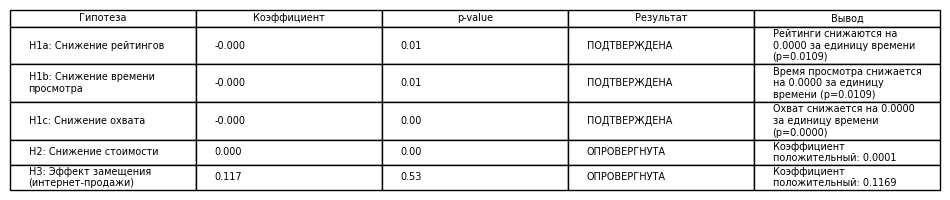

In [86]:
import textwrap

results_df = pd.DataFrame(results_summary)

for col in results_df.columns:
    if results_df[col].dtype in ['float64', 'float32']:
        if 'p' in col.lower() or 'p-value' in col.lower():
            results_df[col] = results_df[col].apply(lambda x: f'{x:.2f}')
        elif 'коэф' in col or 'коэффициент' in col.lower():
            results_df[col] = results_df[col].apply(lambda x: f'{x:.3f}')
        else:
            results_df[col] = results_df[col].apply(lambda x: round(x, 3))
            
def wrap_text(text, width=20):
    if isinstance(text, str) and len(text) > width:
        return '\n'.join(textwrap.wrap(text, width=width))
    return str(text)

wrapped_data = []
for i in range(len(results_df)):
    row = []
    for col in results_df.columns:
        row.append(wrap_text(str(results_df.iloc[i][col]), width=25))
    wrapped_data.append(row)

wrapped_headers = [wrap_text(str(col), width=25) for col in results_df.columns]

max_lines_per_row = [max(cell.count('\n') + 1 for cell in row) for row in wrapped_data]
row_heights = [0.1 * max(1, lines * 0.8) for lines in max_lines_per_row]

fig_height = sum(row_heights) + 0.5  + 0.5  

fig, ax = plt.subplots(figsize=(12, fig_height))
ax.axis('tight')
ax.axis('off')

table = ax.table(cellText=wrapped_data,
                 colLabels=wrapped_headers,
                 cellLoc='left',
                 loc='center',
                 colWidths=[0.2] * len(results_df.columns))

for (row, col), cell in table.get_celld().items():
    if row > 0:
        cell.set_height(row_heights[row-1])

    cell.set_text_props(va='center')

    text = cell.get_text().get_text()
    if text.count('\n') > 1:
        cell.set_fontsize(8)
    else:
        cell.set_fontsize(10)

plt.savefig('graph74.png', dpi=300, bbox_inches='tight', pad_inches=0.3)

## Тесты на выборках по группам поставщиков

In [87]:
df_russian = df_panel[df_panel['Advertiser_type'] == 1].copy()
df_foreign = df_panel[df_panel['Advertiser_type'] == 0].copy()

print(f"Российские рекламодатели: {len(df_russian)} наблюдений ({len(df_russian)/len(df_panel)*100:.1f}%)")
print(f"Зарубежные рекламодатели: {len(df_foreign)} наблюдений ({len(df_foreign)/len(df_panel)*100:.1f}%)")

Российские рекламодатели: 7665 наблюдений (57.2%)
Зарубежные рекламодатели: 5735 наблюдений (42.8%)


Сравнительная статистика по группам:
              Российские  Зарубежные   Разница
ln_RTG          3.153289    3.250344 -0.097055
ln_ATV         -1.451884   -1.354829 -0.097055
ln_AvReach     -1.088972   -1.076746 -0.012227
ln_CostByGRP   14.555070   14.696032 -0.140962


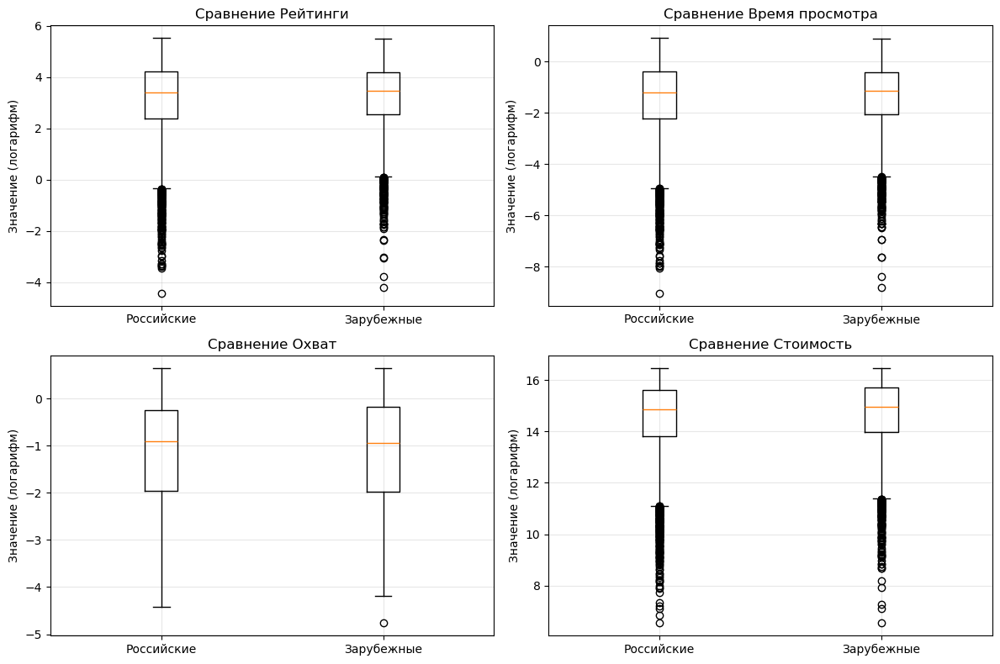

In [88]:
comparison_stats = pd.DataFrame({
    'Российские': df_russian[['ln_RTG', 'ln_ATV', 'ln_AvReach', 'ln_CostByGRP']].mean(),
    'Зарубежные': df_foreign[['ln_RTG', 'ln_ATV', 'ln_AvReach', 'ln_CostByGRP']].mean(),
    'Разница': df_russian[['ln_RTG', 'ln_ATV', 'ln_AvReach', 'ln_CostByGRP']].mean() - 
               df_foreign[['ln_RTG', 'ln_ATV', 'ln_AvReach', 'ln_CostByGRP']].mean()
})

print("Сравнительная статистика по группам:")
print(comparison_stats)

fig, axes = plt.subplots(2, 2, figsize=(12, 8))
metrics = ['ln_RTG', 'ln_ATV', 'ln_AvReach', 'ln_CostByGRP']
titles = ['Рейтинги', 'Время просмотра', 'Охват', 'Стоимость']

for idx, (ax, metric, title) in enumerate(zip(axes.flatten(), metrics, titles)):
    data_to_plot = []
    data_to_plot.append(df_russian[metric].dropna().values)
    data_to_plot.append(df_foreign[metric].dropna().values)
    
    ax.boxplot(data_to_plot, labels=['Российские', 'Зарубежные'])
    ax.set_title(f'Сравнение {title}')
    ax.set_ylabel('Значение (логарифм)')
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('graph75.png', dpi=300, bbox_inches='tight')
plt.show()

In [89]:
results = []

print("H1a: СНИЖЕНИЕ ТЕЛЕВИЗИОННЫХ РЕЙТИНГОВ")

model_h1a_rus = PanelOLS.from_formula(
    'ln_RTG ~ Time + HalfYear_1 + COVID_dummy + ln_InternetPenetration + EntityEffects',
    data=df_russian
).fit(cov_type='clustered', cluster_entity=True)

coef_time_rus = model_h1a_rus.params['Time']
pval_time_rus = model_h1a_rus.pvalues['Time']
print(f"Российские: Коэф. = {coef_time_rus:.6f}, p = {pval_time_rus:.6f}")

model_h1a_for = PanelOLS.from_formula(
    'ln_RTG ~ Time + HalfYear_1 + COVID_dummy + ln_InternetPenetration + EntityEffects',
    data=df_foreign
).fit(cov_type='clustered', cluster_entity=True)

coef_time_for = model_h1a_for.params['Time']
pval_time_for = model_h1a_for.pvalues['Time']
print(f"Зарубежные: Коэф. = {coef_time_for:.6f}, p = {pval_time_for:.6f}")

alpha = 0.10

if coef_time_rus < 0 and pval_time_rus < alpha:
    print(f"Для российских брендов: ГИПОТЕЗА H1a ПОДТВЕРЖДЕНА")
    print(f"Обнаружено статистически значимое снижение рейтингов во времени")
    h1a_conclusion_rus = f"Рейтинги снижаются на {abs(coef_time_rus):.4f} за единицу времени (p={pval_time_rus:.4f})"
elif coef_time_rus < 0 and pval_time_rus >= alpha:
    print(f"Для российских брендов: ГИПОТЕЗА H1a НЕ ПОДТВЕРЖДЕНА")
    print(f"Отрицательный тренд есть, но статистически незначим (p={pval_time_rus:.4f} > α={alpha})")
    h1a_conclusion_rus = "Отрицательный тренд незначим"
else:
    print(f"Для российских брендов: ГИПОТЕЗА H1a ОПРОВЕРГНУТА")
    print(f"Обнаружен положительный или нулевой тренд")
    h1a_conclusion_rus = f"Коэффициент положительный: {coef_time_rus:.4f}"

if coef_time_for < 0 and pval_time_for < alpha:
    print(f"Для зарубежных брендов: ГИПОТЕЗА H1a ПОДТВЕРЖДЕНА")
    print(f"Обнаружено статистически значимое снижение рейтингов во времени")
    h1a_conclusion_for = f"Рейтинги снижаются на {abs(coef_time_for):.4f} за единицу времени (p={pval_time_for:.4f})"
elif coef_time_for < 0 and pval_time_for >= alpha:
    print(f"Для зарубежных брендов: ГИПОТЕЗА H1a НЕ ПОДТВЕРЖДЕНА")
    print(f"Отрицательный тренд есть, но статистически незначим (p={pval_time_for:.4f} > α={alpha})")
    h1a_conclusion_for = "Отрицательный тренд незначим"
else:
    print(f"Для зарубежных брендов: ГИПОТЕЗА H1a ОПРОВЕРГНУТА")
    print(f"Обнаружен положительный или нулевой тренд")
    h1a_conclusion_for = f"Коэффициент положительный: {coef_time_for:.4f}"

results.append({    
    'Гипотеза': 'H1a: Снижение рейтингов',
    'Группа': 'Российские',
    'Коэффициент': coef_time_rus,
    'p-value': pval_time_rus,
    'Значимость': 'Да' if pval_time_rus < alpha else 'Нет',
    'Направление': 'Отрицательный' if coef_time_rus < 0 else 'Положительный',
    'Вывод': h1a_conclusion_rus
})

results.append({
    'Гипотеза': 'H1a: Снижение рейтингов',
    'Группа': 'Зарубежные',
    'Коэффициент': coef_time_for,
    'p-value': pval_time_for,
    'Значимость': 'Да' if pval_time_for < alpha else 'Нет',
    'Направление': 'Отрицательный' if coef_time_for < 0 else 'Положительный',
    'Вывод': h1a_conclusion_for
})

H1a: СНИЖЕНИЕ ТЕЛЕВИЗИОННЫХ РЕЙТИНГОВ
Российские: Коэф. = -0.000034, p = 0.003742
Зарубежные: Коэф. = -0.000015, p = 0.306959
Для российских брендов: ГИПОТЕЗА H1a ПОДТВЕРЖДЕНА
Обнаружено статистически значимое снижение рейтингов во времени
Для зарубежных брендов: ГИПОТЕЗА H1a НЕ ПОДТВЕРЖДЕНА
Отрицательный тренд есть, но статистически незначим (p=0.3070 > α=0.1)


In [90]:
print("H1b: СОКРАЩЕНИЕ СРЕДНЕГО ВРЕМЕНИ ПРОСМОТРА")

model_h1b_rus = PanelOLS.from_formula(
    'ln_ATV ~ Time + HalfYear_1 + COVID_dummy + ln_InternetPenetration + EntityEffects',
    data=df_russian
).fit(cov_type='clustered', cluster_entity=True)

coef_time_h1b_rus = model_h1b_rus.params['Time']
pval_time_h1b_rus = model_h1b_rus.pvalues['Time']
print(f"Российские: Коэф. = {coef_time_h1b_rus:.6f}, p = {pval_time_h1b_rus:.6f}")

model_h1b_for = PanelOLS.from_formula(
    'ln_ATV ~ Time + HalfYear_1 + COVID_dummy + ln_InternetPenetration + EntityEffects',
    data=df_foreign
).fit(cov_type='clustered', cluster_entity=True)

coef_time_h1b_for = model_h1b_for.params['Time']
pval_time_h1b_for = model_h1b_for.pvalues['Time']
print(f"Зарубежные: Коэф. = {coef_time_h1b_for:.6f}, p = {pval_time_h1b_for:.6f}")

alpha = 0.10

if coef_time_h1b_rus < 0 and pval_time_h1b_rus < alpha:
    print(f"Для российских брендов: ГИПОТЕЗА H1b ПОДТВЕРЖДЕНА")
    print(f"Обнаружено статистически значимое снижение среднего времени просмотра")
    h1b_conclusion_rus = f"Время просмотра снижается на {abs(coef_time_h1b_rus):.4f} за единицу времени (p={pval_time_h1b_rus:.4f})"
elif coef_time_h1b_rus < 0 and pval_time_h1b_rus >= alpha:
    print(f"Для российских брендов: ГИПОТЕЗА H1b НЕ ПОДТВЕРЖДЕНА")
    print(f" Отрицательный тренд есть, но статистически незначим (p={pval_time_h1b_rus:.4f} > α={alpha})")
    h1b_conclusion_rus = f"Отрицательный тренд незначим (p={pval_time_h1b_rus:.4f})"
else:
    print(f"Для российских брендов: ГИПОТЕЗА H1b ОПРОВЕРГНУТА")
    print(f"Обнаружен положительный или нулевой тренд")
    h1b_conclusion_rus = f"Коэффициент положительный: {coef_time_h1b_rus:.4f} (p={pval_time_h1b_rus:.4f})"

if coef_time_h1b_for < 0 and pval_time_h1b_for < alpha:
    print(f"Для зарубежных брендов: ГИПОТЕЗА H1b ПОДТВЕРЖДЕНА")
    print(f"Обнаружено статистически значимое снижение среднего времени просмотра")
    h1b_conclusion_for = f"Время просмотра снижается на {abs(coef_time_h1b_for):.4f} за единицу времени (p={pval_time_h1b_for:.4f})"
elif coef_time_h1b_for < 0 and pval_time_h1b_for >= alpha:
    print(f"Для зарубежных брендов: ГИПОТЕЗА H1b НЕ ПОДТВЕРЖДЕНА")
    print(f"Отрицательный тренд есть, но статистически незначим (p={pval_time_h1b_for:.4f} > α={alpha})")
    h1b_conclusion_for = f"Отрицательный тренд незначим (p={pval_time_h1b_for:.4f})"
else:
    print(f"Для зарубежных брендов: ГИПОТЕЗА H1b ОПРОВЕРГНУТА")
    print(f"Обнаружен положительный или нулевой тренд")
    h1b_conclusion_for = f"Коэффициент положительный: {coef_time_h1b_for:.4f} (p={pval_time_h1b_for:.4f})"

results.append({
    'Гипотеза': 'H1b: Снижение времени просмотра',
    'Группа': 'Российские',
    'Коэффициент': coef_time_h1b_rus,
    'p-value': pval_time_h1b_rus,
    'Значимость': 'Да' if pval_time_h1b_rus < alpha else 'Нет',
    'Направление': 'Отрицательный' if coef_time_h1b_rus < 0 else 'Положительный',
    'Вывод': h1b_conclusion_rus
})

results.append({
    'Гипотеза': 'H1b: Снижение времени просмотра',
    'Группа': 'Зарубежные',
    'Коэффициент': coef_time_h1b_for,
    'p-value': pval_time_h1b_for,
    'Значимость': 'Да' if pval_time_h1b_for < alpha else 'Нет',
    'Направление': 'Отрицательный' if coef_time_h1b_for < 0 else 'Положительный',
    'Вывод': h1b_conclusion_for
})

H1b: СОКРАЩЕНИЕ СРЕДНЕГО ВРЕМЕНИ ПРОСМОТРА
Российские: Коэф. = -0.000034, p = 0.003737
Зарубежные: Коэф. = -0.000015, p = 0.307116
Для российских брендов: ГИПОТЕЗА H1b ПОДТВЕРЖДЕНА
Обнаружено статистически значимое снижение среднего времени просмотра
Для зарубежных брендов: ГИПОТЕЗА H1b НЕ ПОДТВЕРЖДЕНА
Отрицательный тренд есть, но статистически незначим (p=0.3071 > α=0.1)


In [91]:
print("H1c: СНИЖЕНИЕ ОХВАТА ТЕЛЕВИЗИОННОЙ АУДИТОРИИ")

model_h1c_rus = PanelOLS.from_formula(
    'ln_AvReach ~ Time + HalfYear_1 + COVID_dummy + ln_InternetPenetration + EntityEffects',
    data=df_russian
).fit(cov_type='clustered', cluster_entity=True)

coef_time_h1c_rus = model_h1c_rus.params['Time']
pval_time_h1c_rus = model_h1c_rus.pvalues['Time']
print(f"Российские: Коэф. = {coef_time_h1c_rus:.6f}, p = {pval_time_h1c_rus:.6f}")

model_h1c_for = PanelOLS.from_formula(
    'ln_AvReach ~ Time + HalfYear_1 + COVID_dummy + ln_InternetPenetration + EntityEffects',
    data=df_foreign
).fit(cov_type='clustered', cluster_entity=True)

coef_time_h1c_for = model_h1c_for.params['Time']
pval_time_h1c_for = model_h1c_for.pvalues['Time']
print(f"Зарубежные: Коэф. = {coef_time_h1c_for:.6f}, p = {pval_time_h1c_for:.6f}")

alpha = 0.10

if coef_time_h1c_rus < 0 and pval_time_h1c_rus < alpha:
    print(f"Для российских брендов: ГИПОТЕЗА H1c ПОДТВЕРЖДЕНА")
    print(f"Обнаружено статистически значимое снижение охвата аудитории")
    h1c_conclusion_rus = f"Охват снижается на {abs(coef_time_h1c_rus):.4f} за единицу времени (p={pval_time_h1c_rus:.4f})"
elif coef_time_h1c_rus < 0 and pval_time_h1c_rus >= alpha:
    print(f"Для российских брендов: ГИПОТЕЗА H1c НЕ ПОДТВЕРЖДЕНА")
    print(f"Отрицательный тренд есть, но статистически незначим (p={pval_time_h1c_rus:.4f} > α={alpha})")
    h1c_conclusion_rus = f"Отрицательный тренд незначим (p={pval_time_h1c_rus:.4f})"
else:
    print(f"Для российских брендов: ГИПОТЕЗА H1c ОПРОВЕРГНУТА")
    print(f"Обнаружен положительный или нулевой тренд")
    h1c_conclusion_rus = f"Коэффициент положительный: {coef_time_h1c_rus:.4f} (p={pval_time_h1c_rus:.4f})"

if coef_time_h1c_for < 0 and pval_time_h1c_for < alpha:
    print(f"Для зарубежных брендов: ГИПОТЕЗА H1c ПОДТВЕРЖДЕНА")
    print(f"Обнаружено статистически значимое снижение охвата аудитории")
    h1c_conclusion_for = f"Охват снижается на {abs(coef_time_h1c_for):.4f} за единицу времени (p={pval_time_h1c_for:.4f})"
elif coef_time_h1c_for < 0 and pval_time_h1c_for >= alpha:
    print(f"Для зарубежных брендов: ГИПОТЕЗА H1c НЕ ПОДТВЕРЖДЕНА")
    print(f"Отрицательный тренд есть, но статистически незначим (p={pval_time_h1c_for:.4f} > α={alpha})")
    h1c_conclusion_for = f"Отрицательный тренд незначим (p={pval_time_h1c_for:.4f})"
else:
    print(f"Для зарубежных брендов: ГИПОТЕЗА H1c ОПРОВЕРГНУТА")
    print(f"Обнаружен положительный или нулевой тренд")
    h1c_conclusion_for = f"Коэффициент положительный: {coef_time_h1c_for:.4f} (p={pval_time_h1c_for:.4f})"
    
results.append({
    'Гипотеза': 'H1c: Снижение охвата',
    'Группа': 'Российские',
    'Коэффициент': coef_time_h1c_rus,
    'p-value': pval_time_h1c_rus,
    'Значимость': 'Да' if pval_time_h1c_rus < alpha else 'Нет',
    'Направление': 'Отрицательный' if coef_time_h1c_rus < 0 else 'Положительный',
    'Вывод': h1c_conclusion_rus
})

results.append({
    'Гипотеза': 'H1c: Снижение охвата',
    'Группа': 'Зарубежные',
    'Коэффициент': coef_time_h1c_for,
    'p-value': pval_time_h1c_for,
    'Значимость': 'Да' if pval_time_h1c_for < alpha else 'Нет',
    'Направление': 'Отрицательный' if coef_time_h1c_for < 0 else 'Положительный',
    'Вывод': h1c_conclusion_for
})

H1c: СНИЖЕНИЕ ОХВАТА ТЕЛЕВИЗИОННОЙ АУДИТОРИИ
Российские: Коэф. = -0.000042, p = 0.000009
Зарубежные: Коэф. = -0.000043, p = 0.000033
Для российских брендов: ГИПОТЕЗА H1c ПОДТВЕРЖДЕНА
Обнаружено статистически значимое снижение охвата аудитории
Для зарубежных брендов: ГИПОТЕЗА H1c ПОДТВЕРЖДЕНА
Обнаружено статистически значимое снижение охвата аудитории


In [92]:
print("H2: СНИЖЕНИЕ ЭКОНОМИЧЕСКОЙ ЭФФЕКТИВНОСТИ ТЕЛЕВИЗИОННОЙ РЕКЛАМЫ")

model_h2_rus = PanelOLS.from_formula(
    'ln_CostByGRP ~ Time + ln_RTG + ln_GDP + EntityEffects',
    data=df_russian
).fit(cov_type='clustered', cluster_entity=True)

coef_time_rus = model_h2_rus.params['Time']
pval_time_rus = model_h2_rus.pvalues['Time']
print(f"Российские: Коэф. = {coef_time_rus:.6f}, p = {pval_time_rus:.6f}")

model_h2_for = PanelOLS.from_formula(
    'ln_CostByGRP ~ Time +  ln_RTG + ln_GDP + EntityEffects',
    data=df_foreign
).fit(cov_type='clustered', cluster_entity=True)

coef_time_for = model_h2_for.params['Time']
pval_time_for = model_h2_for.pvalues['Time']
print(f"Зарубежные: Коэф. = {coef_time_for:.6f}, p = {pval_time_for:.6f}")

alpha = 0.10

if coef_time_rus < 0 and pval_time_rus < alpha:
    print(f"Для российских брендов: ГИПОТЕЗА H2 ПОДТВЕРЖДЕНА")
    print(f"Обнаружено статистически значимое снижение стоимости GRP во времени")
    h2_conclusion_rus = f"Стоимость снижается на {abs(coef_time_rus):.4f} за единицу времени (p={pval_time_rus:.4f})"
else:
    print(f"Для российских брендов: ГИПОТЕЗА H2 НЕ ПОДТВЕРЖДЕНА")
    print(f"Отрицательный тренд есть, но статистически незначим (p={pval_time_rus:.4f} > α={alpha})")
    h2_conclusion_rus = f"Отрицательный тренд незначим (p={pval_time_rus:.4f})"


if coef_time_for < 0 and pval_time_for < alpha:
    print(f"Для зарубежных брендов: ГИПОТЕЗА H2 ПОДТВЕРЖДЕНА")
    print(f"Обнаружено статистически значимое снижение стоимости GRP во времени")
    h2_conclusion_for = f"Стоимость снижается на {abs(coef_time_rus):.4f} за единицу времени (p={pval_time_rus:.4f})"
else:
    print(f"Для иностранных брендов: ГИПОТЕЗА H2 НЕ ПОДТВЕРЖДЕНА")
    print(f"Отрицательный тренд есть, но статистически незначим (p={pval_time_rus:.4f} > α={alpha})")
    h2_conclusion_for = f"Отрицательный тренд незначим (p={pval_time_rus:.4f})"  
    



results.append({
    'Гипотеза': 'H2: Снижение стоимости GRP',
    'Группа': 'Российские',
    'Коэффициент': coef_time_rus,
    'p-value': pval_time_rus,
    'Значимость': 'Да' if pval_time_rus < alpha else 'Нет',
    'Направление': 'Отрицательный' if coef_time_rus < 0 else 'Положительный',
    'Вывод': h2_conclusion_rus
})

results.append({
    'Гипотеза': 'H2: Снижение стоимости GRP',
    'Группа': 'Зарубежные',
    'Коэффициент': coef_time_for,
    'p-value': pval_time_for,
    'Значимость': 'Да' if pval_time_for < alpha else 'Нет',
    'Направление': 'Отрицательный' if coef_time_for < 0 else 'Положительный',
    'Вывод': h2_conclusion_for
})

H2: СНИЖЕНИЕ ЭКОНОМИЧЕСКОЙ ЭФФЕКТИВНОСТИ ТЕЛЕВИЗИОННОЙ РЕКЛАМЫ
Российские: Коэф. = 0.000060, p = 0.000000
Зарубежные: Коэф. = 0.000052, p = 0.000000
Для российских брендов: ГИПОТЕЗА H2 НЕ ПОДТВЕРЖДЕНА
Отрицательный тренд есть, но статистически незначим (p=0.0000 > α=0.1)
Для иностранных брендов: ГИПОТЕЗА H2 НЕ ПОДТВЕРЖДЕНА
Отрицательный тренд есть, но статистически незначим (p=0.0000 > α=0.1)


In [93]:
print("H3: ОТРИЦАТЕЛЬНАЯ СВЯЗЬ С ИНТЕРНЕТ-ПРОДАЖАМИ")

model_h3a_rus = PanelOLS.from_formula(
    'ln_CostByGRP ~ ln_Internet_sales + ln_GDP + Time + ln_RTG + EntityEffects',
    data=df_russian
).fit(cov_type='clustered', cluster_entity=True)

coef_internet_rus = model_h3a_rus.params['ln_Internet_sales']
pval_internet_rus = model_h3a_rus.pvalues['ln_Internet_sales']
print(f"Российские: Коэф. = {coef_internet_rus:.6f}, p = {pval_internet_rus:.6f}")

model_h3a_for = PanelOLS.from_formula(
    'ln_CostByGRP ~ ln_Internet_sales + ln_GDP + Time + ln_RTG + EntityEffects',
    data=df_foreign
).fit(cov_type='clustered', cluster_entity=True)

coef_internet_for = model_h3a_for.params['ln_Internet_sales']
pval_internet_for = model_h3a_for.pvalues['ln_Internet_sales']
print(f"Зарубежные: Коэф. = {coef_internet_for:.6f}, p = {pval_internet_for:.6f}")

alpha = 0.10

if coef_internet_rus < 0 and pval_internet_rus < alpha:
    print(f"Для российских брендов: ГИПОТЕЗА H3a ПОДТВЕРЖДЕНА")
    print(f"Обнаружена статистически значимая отрицательная связь")
    print(f"Рост интернет-продаж связан со снижением стоимости рекламы")
    h3a_conclusion_rus = f"Стоимость снижается на {abs(coef_internet_rus):.4f} при росте интернет-продаж на 1% (p={pval_internet_rus:.4f})"
elif coef_internet_rus < 0 and pval_internet_rus >= alpha:
    print(f"Для российских брендов: ГИПОТЕЗА H3a НЕ ПОДТВЕРЖДЕНА")
    print(f"Отрицательная связь есть, но статистически незначима (p={pval_internet_rus:.4f} > α={alpha})")
    h3a_conclusion_rus = f"Отрицательная связь незначима (p={pval_internet_rus:.4f})"
elif coef_internet_rus > 0 and pval_internet_rus < alpha:
    print(f"Для российских брендов: ГИПОТЕЗА H3a ОПРОВЕРГНУТА")
    print(f"Обнаружена статистически значимая положительная связь")
    print(f"Рост интернет-продаж связан с ростом стоимости рекламы")
    h3a_conclusion_rus = f"Положительная связь: рост на {coef_internet_rus:.4f} при росте интернет-продаж на 1% (p={pval_internet_rus:.4f})"
else:
    print(f"Для российских брендов: ГИПОТЕЗА H3a НЕ ПОДТВЕРЖДЕНА")
    print(f"Связь не обнаружена или незначима")
    h3a_conclusion_rus = f"Связь незначима (p={pval_internet_rus:.4f})"

if coef_internet_for < 0 and pval_internet_for < alpha:
    print(f"Для зарубежных брендов: ГИПОТЕЗА H3a ПОДТВЕРЖДЕНА")
    print(f"Обнаружена статистически значимая отрицательная связь")
    print(f"Рост интернет-продаж связан со снижением стоимости рекламы")
    h3a_conclusion_for = f"Стоимость снижается на {abs(coef_internet_for):.4f} при росте интернет-продаж на 1% (p={pval_internet_for:.4f})"
elif coef_internet_for < 0 and pval_internet_for >= alpha:
    print(f"Для зарубежных брендов: ГИПОТЕЗА H3a НЕ ПОДТВЕРЖДЕНА")
    print(f"Отрицательная связь есть, но статистически незначима (p={pval_internet_for:.4f} > α={alpha})")
    h3a_conclusion_for = f"Отрицательная связь незначима (p={pval_internet_for:.4f})"
elif coef_internet_for > 0 and pval_internet_for < alpha:
    print(f"Для зарубежных брендов: ГИПОТЕЗА H3a ОПРОВЕРГНУТА")
    print(f"Обнаружена статистически значимая положительная связь")
    print(f"Рост интернет-продаж связан с ростом стоимости рекламы")
    h3a_conclusion_for = f"Положительная связь: рост на {coef_internet_for:.4f} при росте интернет-продаж на 1% (p={pval_internet_for:.4f})"
else:
    print(f"Для зарубежных брендов: ГИПОТЕЗА H3a НЕ ПОДТВЕРЖДЕНА")
    print(f"Связь не обнаружена или незначима")
    h3a_conclusion_for = f"Связь незначима (p={pval_internet_for:.4f})"

results.append({
    'Гипотеза': 'H3: Эффект замещения',
    'Группа': 'Российские',
    'Коэффициент': coef_internet_rus,
    'p-value': pval_internet_rus,
    'Значимость': 'Да' if pval_internet_rus < alpha else 'Нет',
    'Направление': 'Отрицательный' if coef_internet_rus < 0 else 'Положительный',
    'Вывод': h3a_conclusion_rus
})

results.append({
    'Гипотеза': 'H3: Эффект замещения',
    'Группа': 'Зарубежные',
    'Коэффициент': coef_internet_for,
    'p-value': pval_internet_for,
    'Значимость': 'Да' if pval_internet_for < alpha else 'Нет',
    'Направление': 'Отрицательный' if coef_internet_for < 0 else 'Положительный',
    'Вывод': h3a_conclusion_for
})

H3: ОТРИЦАТЕЛЬНАЯ СВЯЗЬ С ИНТЕРНЕТ-ПРОДАЖАМИ
Российские: Коэф. = 0.388614, p = 0.071259
Зарубежные: Коэф. = -0.280498, p = 0.174329
Для российских брендов: ГИПОТЕЗА H3a ОПРОВЕРГНУТА
Обнаружена статистически значимая положительная связь
Рост интернет-продаж связан с ростом стоимости рекламы
Для зарубежных брендов: ГИПОТЕЗА H3a НЕ ПОДТВЕРЖДЕНА
Отрицательная связь есть, но статистически незначима (p=0.1743 > α=0.1)


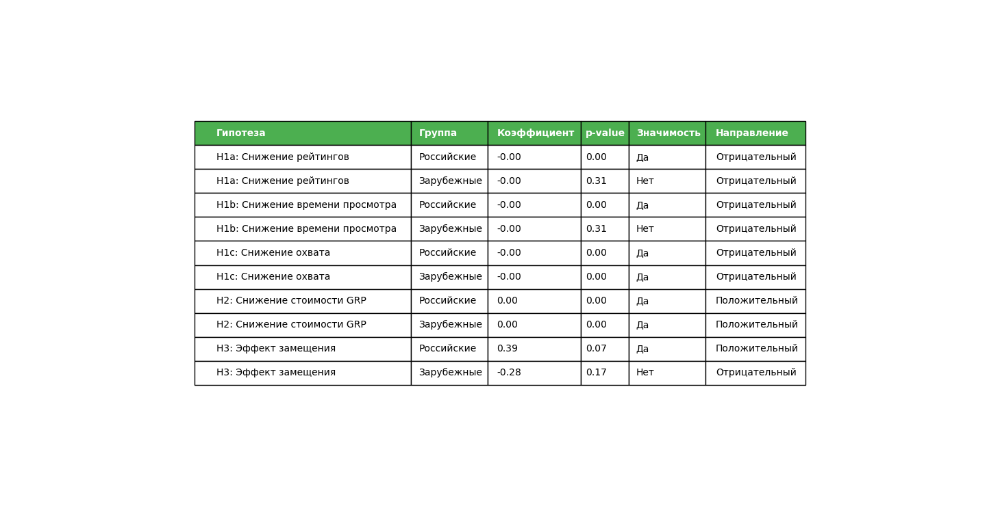

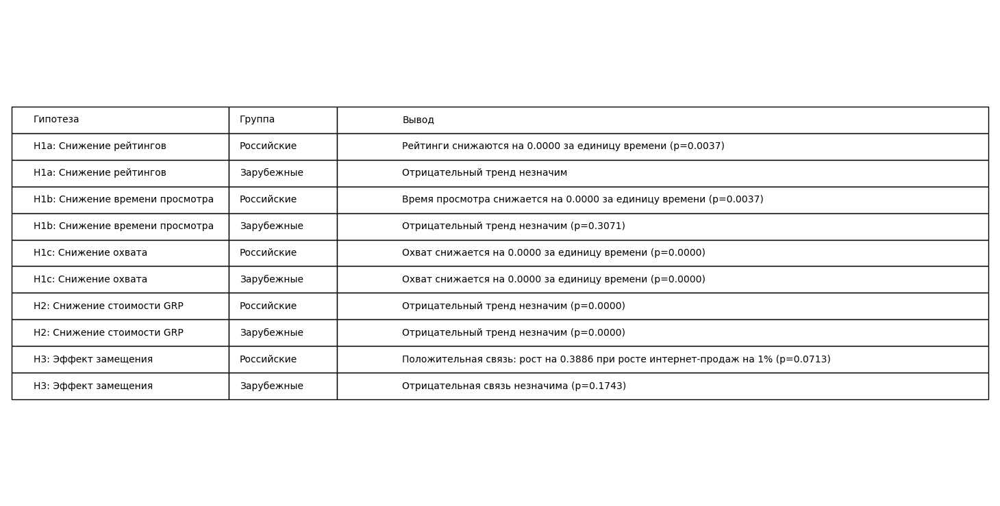

In [95]:
main_columns = ['Гипотеза', 'Группа', 'Коэффициент', 'p-value', 'Значимость', 'Направление']
main_df = pd.DataFrame([{k: r[k] for k in main_columns if k in r} for r in results])

conclusion_columns = ['Гипотеза', 'Группа', 'Вывод']
conclusion_df = pd.DataFrame([{k: r[k] for k in conclusion_columns if k in r} for r in results])

if 'Коэффициент' in main_df.columns:
    main_df['Коэффициент'] = main_df['Коэффициент'].apply(
        lambda x: f"{float(x):.2f}" if pd.notnull(x) else "N/A"  
    )

if 'p-value' in main_df.columns:
    main_df['p-value'] = main_df['p-value'].apply(
        lambda x: f"{float(x):.2f}" if pd.notnull(x) else "N/A" 
    )

fig1, ax1 = plt.subplots(figsize=(16, max(8, len(main_df) * 0.5 + 2))) 
ax1.axis('tight')
ax1.axis('off')

table1 = ax1.table(
    cellText=[main_df.columns.tolist()] + main_df.values.tolist(),
    cellLoc='left',  
    loc='center'
)

table1.auto_set_font_size(False)
table1.set_fontsize(10)  
table1.scale(1.1, 1.8)  

if len(main_df.columns) == 6:
    col_widths = [0.25, 0.1, 0.12, 0.12, 0.15, 0.12] 
    for i, width in enumerate(col_widths):
        table1.auto_set_column_width(i)
else:
    
    table1.auto_set_column_width(col=list(range(len(main_df.columns))))

for j in range(len(main_df.columns)):
    table1[(0, j)].set_facecolor('#4CAF50')
    table1[(0, j)].set_text_props(weight='bold', color='white')

for i in range(1, len(main_df) + 1):
    table1[(i, 0)].get_text().set_wrap(True) 

plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)
plt.savefig('graph76.png', dpi=300, bbox_inches='tight')

fig2, ax2 = plt.subplots(figsize=(16, max(8, len(conclusion_df) * 0.6 + 2))) 
ax2.axis('tight')
ax2.axis('off')

table2 = ax2.table(
    cellText=[conclusion_df.columns.tolist()] + conclusion_df.values.tolist(),
    cellLoc='left',
    loc='center',
    colWidths=[0.2, 0.1, 0.6]  
)

table2.auto_set_font_size(False)
table2.set_fontsize(10)
table2.scale(1.1, 2.0) 

for i in range(1, len(conclusion_df) + 1):
    text = table2[(i, 2)].get_text()
    text.set_wrap(True)  
    
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)
plt.savefig('graph77.png', dpi=300, bbox_inches='tight')

## Тесты на робастность гиотпезы

In [96]:
robustness_results = []

In [97]:
Y = df_new['ln_RTG']
X_base = df_new[['Time', 'HalfYear_1', 'COVID_dummy', 'ln_InternetPenetration', 'Advertiser_type']]
X_base = sm.add_constant(X_base)

# Базовая модель
model_base = sm.OLS(Y, X_base).fit()
coef_base = model_base.params['Time']
pval_base = model_base.pvalues['Time']
print(f"   Базовая модель:")
print(f"   Коэффициент при Time: {coef_base:.6f}")
print(f"   p-value: {pval_base:.4f}")
print(f"   Значимость (α=0.1): {'Да' if pval_base < 0.1 else 'Нет'}\n")

# Без InternetPenetration 
X_no_internet = X_base[['const', 'Time', 'HalfYear_1', 'COVID_dummy', 'Advertiser_type']]
model_no_internet = sm.OLS(Y, X_no_internet).fit()
coef_no_internet = model_no_internet.params['Time']
pval_no_internet = model_no_internet.pvalues['Time']
print(f"   Без InternetPenetration:")
print(f"   Коэффициент: {coef_no_internet:.6f}, p = {pval_no_internet:.4f}")

# Без COVID_dummy
X_no_covid = X_base[['const', 'Time', 'HalfYear_1', 'ln_InternetPenetration', 'Advertiser_type']]
model_no_covid = sm.OLS(Y, X_no_covid).fit()
coef_no_covid = model_no_covid.params['Time']
pval_no_covid = model_no_covid.pvalues['Time']
print(f"   Без COVID_dummy:")
print(f"   Коэффициент: {coef_no_covid:.6f}, p = {pval_no_covid:.4f}")

# Проверка мультиколлинеарности (VIF)
from statsmodels.stats.outliers_influence import variance_inflation_factor
X_vif = X_base.drop(columns=['const'])
vif_data = pd.DataFrame()
vif_data["Переменная"] = X_vif.columns
vif_data["VIF"] = [variance_inflation_factor(X_vif.values, i) for i in range(X_vif.shape[1])]
max_vif = vif_data["VIF"].max()
print(f"\n Максимальный VIF: {max_vif:.2f}")

sign_stable = all([
    coef_base < 0,
    coef_no_internet < 0,
    coef_no_covid < 0,
])

any_significant = any([
    pval_base < 0.10,
    pval_no_internet < 0.10,
    pval_no_covid < 0.10,
])

vif_ok = (max_vif < 5)

if sign_stable and any_significant and vif_ok:
    robust_status = "Да"
else:
    reasons = []
    if not sign_stable:
        reasons.append("знак нестабилен")
    if not any_significant:
        reasons.append("нет значимости")
    if not vif_ok:
        reasons.append("VIF ≥ 5")
    robust_status = "Частично (" + ", ".join(reasons) + ")"

print("ВЫВОД ПО РОБАСТНОСТИ:")
if robust_status == "Да":
    print("     Результат по H1a является РОБАСТНЫМ:")
    print("   - Знак коэффициента устойчив (всегда отрицательный)")
    print("   - Есть статистическая значимость хотя бы в одной модели (α=0.1)")
    print("   - Мультиколлинеарность отсутствует (VIF < 5)")
else:
    print("    Результат частично робастен:")
    if not sign_stable:
        print("   - Знак коэффициента нестабилен")
    if not any_significant:
        print("   - Значимость отсутствует во всех моделях (α=0.1)")
    if not vif_ok:
        print("   - Обнаружена мультиколлинеарность (VIF ≥ 5)")

robustness_results.append({
    'Гипотеза': "H1a (снижение рейтингов)",
    'Базовая (коэф.)': round(coef_base, 6),
    'Базовая (p)': round(pval_base, 4),
    'Без Internet (коэф.)': round(coef_no_internet, 6),
    'Без Internet (p)': round(pval_no_internet, 4),
    'Без COVID (коэф.)': round(coef_no_covid, 6),
    'Без COVID (p)': round(pval_no_covid, 4),
    'Макс. VIF': round(max_vif, 2),
    'Робастна?': robust_status  
})

   Базовая модель:
   Коэффициент при Time: -0.000108
   p-value: 0.0000
   Значимость (α=0.1): Да

   Без InternetPenetration:
   Коэффициент: -0.000049, p = 0.0000
   Без COVID_dummy:
   Коэффициент: -0.000072, p = 0.0000

 Максимальный VIF: 47.91
ВЫВОД ПО РОБАСТНОСТИ:
    Результат частично робастен:
   - Обнаружена мультиколлинеарность (VIF ≥ 5)


In [98]:
Y = df_new['ln_ATV']
X_base = df_new[['Time', 'HalfYear_1', 'COVID_dummy', 'ln_InternetPenetration', 'Advertiser_type']]
X_base = sm.add_constant(X_base)

# Базовая модель
model_base = sm.OLS(Y, X_base).fit()
coef_base = model_base.params['Time']
pval_base = model_base.pvalues['Time']
print(f"   Базовая модель:")
print(f"   Коэффициент при Time: {coef_base:.6f}")
print(f"   p-value: {pval_base:.4f}")
print(f"   Значимость (α=0.1): {'Да' if pval_base < 0.1 else 'Нет'}\n")

# Без InternetPenetration 
X_no_internet = X_base[['const', 'Time', 'HalfYear_1', 'COVID_dummy', 'Advertiser_type']]
model_no_internet = sm.OLS(Y, X_no_internet).fit()
coef_no_internet = model_no_internet.params['Time']
pval_no_internet = model_no_internet.pvalues['Time']
print(f"   Без InternetPenetration:")
print(f"   Коэффициент: {coef_no_internet:.6f}, p = {pval_no_internet:.4f}")

# Без COVID_dummy
X_no_covid = X_base[['const', 'Time', 'HalfYear_1', 'ln_InternetPenetration', 'Advertiser_type']]
model_no_covid = sm.OLS(Y, X_no_covid).fit()
coef_no_covid = model_no_covid.params['Time']
pval_no_covid = model_no_covid.pvalues['Time']
print(f"   Без COVID_dummy:")
print(f"   Коэффициент: {coef_no_covid:.6f}, p = {pval_no_covid:.4f}")

# Проверка мультиколлинеарности (VIF)
from statsmodels.stats.outliers_influence import variance_inflation_factor
X_vif = X_base.drop(columns=['const'])
vif_data = pd.DataFrame()
vif_data["Переменная"] = X_vif.columns
vif_data["VIF"] = [variance_inflation_factor(X_vif.values, i) for i in range(X_vif.shape[1])]
max_vif = vif_data["VIF"].max()
print(f"\n Максимальный VIF: {max_vif:.2f}")

sign_stable = all([
    coef_base < 0,
    coef_no_internet < 0,
    coef_no_covid < 0,
])

any_significant = any([
    pval_base < 0.10,
    pval_no_internet < 0.10,
    pval_no_covid < 0.10,
])

vif_ok = (max_vif < 5)

if sign_stable and any_significant and vif_ok:
    robust_status = "Да"
else:
    reasons = []
    if not sign_stable:
        reasons.append("знак нестабилен")
    if not any_significant:
        reasons.append("нет значимости")
    if not vif_ok:
        reasons.append("VIF ≥ 5")
    robust_status = "Частично (" + ", ".join(reasons) + ")"

print("ВЫВОД ПО РОБАСТНОСТИ:")
if robust_status == "Да":
    print("     Результат по H1b является РОБАСТНЫМ:")
    print("   - Знак коэффициента устойчив (всегда отрицательный)")
    print("   - Есть статистическая значимость хотя бы в одной модели (α=0.1)")
    print("   - Мультиколлинеарность отсутствует (VIF < 5)")
else:
    print("    Результат частично робастен:")
    if not sign_stable:
        print("   - Знак коэффициента нестабилен")
    if not any_significant:
        print("   - Значимость отсутствует во всех моделях (α=0.1)")
    if not vif_ok:
        print("   - Обнаружена мультиколлинеарность (VIF ≥ 5)")

robustness_results.append({
    'Гипотеза': "H1b (снижение времени просмотра)",
    'Базовая (коэф.)': round(coef_base, 6),
    'Базовая (p)': round(pval_base, 4),
    'Без Internet (коэф.)': round(coef_no_internet, 6),
    'Без Internet (p)': round(pval_no_internet, 4),
    'Без COVID (коэф.)': round(coef_no_covid, 6),
    'Без COVID (p)': round(pval_no_covid, 4),
    'Макс. VIF': round(max_vif, 2),
    'Робастна?': robust_status  
})

   Базовая модель:
   Коэффициент при Time: -0.000108
   p-value: 0.0000
   Значимость (α=0.1): Да

   Без InternetPenetration:
   Коэффициент: -0.000049, p = 0.0000
   Без COVID_dummy:
   Коэффициент: -0.000072, p = 0.0000

 Максимальный VIF: 47.91
ВЫВОД ПО РОБАСТНОСТИ:
    Результат частично робастен:
   - Обнаружена мультиколлинеарность (VIF ≥ 5)


In [99]:
Y = df_new['ln_AvReach']
X_base = df_new[['Time', 'HalfYear_1', 'COVID_dummy', 'ln_InternetPenetration', 'Advertiser_type']]
X_base = sm.add_constant(X_base)

# Базовая модель
model_base = sm.OLS(Y, X_base).fit()
coef_base = model_base.params['Time']
pval_base = model_base.pvalues['Time']
print(f"   Базовая модель:")
print(f"   Коэффициент при Time: {coef_base:.6f}")
print(f"   p-value: {pval_base:.4f}")
print(f"   Значимость (α=0.1): {'Да' if pval_base < 0.1 else 'Нет'}\n")

# Без InternetPenetration 
X_no_internet = X_base[['const', 'Time', 'HalfYear_1', 'COVID_dummy', 'Advertiser_type']]
model_no_internet = sm.OLS(Y, X_no_internet).fit()
coef_no_internet = model_no_internet.params['Time']
pval_no_internet = model_no_internet.pvalues['Time']
print(f"   Без InternetPenetration:")
print(f"   Коэффициент: {coef_no_internet:.6f}, p = {pval_no_internet:.4f}")

# Без COVID_dummy
X_no_covid = X_base[['const', 'Time', 'HalfYear_1', 'ln_InternetPenetration', 'Advertiser_type']]
model_no_covid = sm.OLS(Y, X_no_covid).fit()
coef_no_covid = model_no_covid.params['Time']
pval_no_covid = model_no_covid.pvalues['Time']
print(f"   Без COVID_dummy:")
print(f"   Коэффициент: {coef_no_covid:.6f}, p = {pval_no_covid:.4f}")

from statsmodels.stats.outliers_influence import variance_inflation_factor
X_vif = X_base.drop(columns=['const'])
vif_data = pd.DataFrame()
vif_data["Переменная"] = X_vif.columns
vif_data["VIF"] = [variance_inflation_factor(X_vif.values, i) for i in range(X_vif.shape[1])]
max_vif = vif_data["VIF"].max()
print(f"\n Максимальный VIF: {max_vif:.2f}")

sign_stable = all([
    coef_base < 0,
    coef_no_internet < 0,
    coef_no_covid < 0,
])

any_significant = any([
    pval_base < 0.10,
    pval_no_internet < 0.10,
    pval_no_covid < 0.10,
])

vif_ok = (max_vif < 5)

if sign_stable and any_significant and vif_ok:
    robust_status = "Да"
else:
    reasons = []
    if not sign_stable:
        reasons.append("знак нестабилен")
    if not any_significant:
        reasons.append("нет значимости")
    if not vif_ok:
        reasons.append("VIF ≥ 5")
    robust_status = "Частично (" + ", ".join(reasons) + ")"

print("ВЫВОД ПО РОБАСТНОСТИ:")
if robust_status == "Да":
    print("     Результат по H1c является РОБАСТНЫМ:")
    print("   - Знак коэффициента устойчив (всегда отрицательный)")
    print("   - Есть статистическая значимость хотя бы в одной модели (α=0.1)")
    print("   - Мультиколлинеарность отсутствует (VIF < 5)")
else:
    print("    Результат частично робастен:")
    if not sign_stable:
        print("   - Знак коэффициента нестабилен")
    if not any_significant:
        print("   - Значимость отсутствует во всех моделях (α=0.1)")
    if not vif_ok:
        print("   - Обнаружена мультиколлинеарность (VIF ≥ 5)")

robustness_results.append({
    'Гипотеза': "H1c (снижение охвата)",
    'Базовая (коэф.)': round(coef_base, 6),
    'Базовая (p)': round(pval_base, 4),
    'Без Internet (коэф.)': round(coef_no_internet, 6),
    'Без Internet (p)': round(pval_no_internet, 4),
    'Без COVID (коэф.)': round(coef_no_covid, 6),
    'Без COVID (p)': round(pval_no_covid, 4),
    'Макс. VIF': round(max_vif, 2),
    'Робастна?': robust_status
})

   Базовая модель:
   Коэффициент при Time: -0.000122
   p-value: 0.0000
   Значимость (α=0.1): Да

   Без InternetPenetration:
   Коэффициент: -0.000057, p = 0.0000
   Без COVID_dummy:
   Коэффициент: -0.000079, p = 0.0000

 Максимальный VIF: 47.91
ВЫВОД ПО РОБАСТНОСТИ:
    Результат частично робастен:
   - Обнаружена мультиколлинеарность (VIF ≥ 5)


In [100]:
Y = df_new['ln_CostByGRP']
X_base = df_new[['Time', 'ln_RTG', 'ln_GDP', 'Advertiser_type']]
X_base = sm.add_constant(X_base)

# Базовая модель
model_base = sm.OLS(Y, X_base).fit()
coef_base = model_base.params['Time']
pval_base = model_base.pvalues['Time']
print(f"\n Базовая модель:")
print(f"   Коэффициент при Time: {coef_base:.6f}")
print(f"   p-value: {pval_base:.4f}")
print(f"   Значимость (α=0.1): {'Да' if pval_base < 0.1 else 'Нет'}")

# Без ln_GDP (макроэкономическая переменная)
X_no_gdp = X_base[['const', 'Time', 'ln_RTG' , 'Advertiser_type']]
model_no_gdp = sm.OLS(Y, X_no_gdp).fit()
coef_no_gdp = model_no_gdp.params['Time']
pval_no_gdp = model_no_gdp.pvalues['Time']
print(f"\n Без ln_GDP:")
print(f"   Коэффициент: {coef_no_gdp:.6f}, p = {pval_no_gdp:.4f}")

# Без Advertiser_type
X_no_advertiser = X_base[['const', 'Time', 'ln_RTG', 'ln_GDP']]
model_no_advertiser = sm.OLS(Y, X_no_advertiser).fit()
coef_no_advertiser = model_no_advertiser.params['Time']
pval_no_advertiser = model_no_advertiser.pvalues['Time']
print(f"\n Без Advertiser_type:")
print(f"   Коэффициент: {coef_no_advertiser:.6f}, p = {pval_no_advertiser:.4f}")

# Без Rtg% (рейтинг)
X_no_rating = X_base[['const', 'Time', 'ln_GDP', 'Advertiser_type']]
model_no_rating = sm.OLS(Y, X_no_rating).fit()
coef_no_rating = model_no_rating.params['Time']
pval_no_rating = model_no_rating.pvalues['Time']
print(f"\n Без Rtg%[Сумма]:")
print(f"   Коэффициент: {coef_no_rating:.6f}, p = {pval_no_rating:.4f}")

# Проверка мультиколлинеарности (VIF)
from statsmodels.stats.outliers_influence import variance_inflation_factor
X_vif = X_base.drop(columns=['const'])
vif_data = pd.DataFrame()
vif_data["Переменная"] = X_vif.columns
vif_data["VIF"] = [variance_inflation_factor(X_vif.values, i) for i in range(X_vif.shape[1])]
max_vif = vif_data["VIF"].max()
print(f"\n Максимальный VIF: {max_vif:.2f}")

sign_stable = all([
    coef_base > 0,
    coef_no_gdp > 0,
    coef_no_advertiser > 0,
    coef_no_rating > 0
])

any_significant = any([
    pval_base < 0.10,
    pval_no_gdp < 0.10,
    pval_no_advertiser < 0.10,
    pval_no_rating < 0.10
])

vif_ok = (max_vif < 5)

if sign_stable and any_significant and vif_ok:
    robust_status = "Да"
else:
    reasons = []
    if not sign_stable:
        reasons.append("знак нестабилен")
    if not any_significant:
        reasons.append("нет значимости")
    if not vif_ok:
        reasons.append("VIF ≥ 5")
    robust_status = "Частично (" + ", ".join(reasons) + ")"

print("\n" + "=" * 70)
print("ВЫВОД ПО РОБАСТНОСТИ ДЛЯ H2")
print("=" * 70)

if robust_status == "Да":
    print("   Результат по H2 является РОБАСТНЫМ:")
    print("   - Знак коэффициента устойчив (всегда положительный)")
    print("   - Есть статистическая значимость хотя бы в одной модели (α=0.1)")
    print("   - Мультиколлинеарность отсутствует (VIF < 5)")
else:
    print("   Результат частично робастен:")
    if not sign_stable:
        print("   - Знак коэффициента нестабилен")
    if not any_significant:
        print("   - Значимость отсутствует во всех моделях (α=0.1)")
    if not vif_ok:
        print(f"   - Обнаружена мультиколлинеарность (VIF = {max_vif:.2f} ≥ 5)")

robustness_results.append({
    'Гипотеза': "H2 (снижение стоимости GRP)",
    'Базовая (коэф.)': round(coef_base, 6),
    'Базовая (p)': round(pval_base, 4),
    'Без GDP (коэф.)': round(coef_no_gdp, 6),
    'Без GDP (p)': round(pval_no_gdp, 4),
    'Без Advertiser (коэф.)': round(coef_no_advertiser, 6),
    'Без Advertiser (p)': round(pval_no_advertiser, 4),
    'Без Rating (коэф.)': round(coef_no_rating, 6),
    'Без Rating (p)': round(pval_no_rating, 4),
    'Макс. VIF': round(max_vif, 2),
    'Робастна?': robust_status
})



 Базовая модель:
   Коэффициент при Time: 0.000083
   p-value: 0.0000
   Значимость (α=0.1): Да

 Без ln_GDP:
   Коэффициент: 0.000027, p = 0.0000

 Без Advertiser_type:
   Коэффициент: 0.000080, p = 0.0000

 Без Rtg%[Сумма]:
   Коэффициент: 0.000004, p = 0.7229

 Максимальный VIF: 11.58

ВЫВОД ПО РОБАСТНОСТИ ДЛЯ H2
   Результат частично робастен:
   - Обнаружена мультиколлинеарность (VIF = 11.58 ≥ 5)


In [101]:
Y = df_new['ln_CostByGRP']
X_base = df_new[['ln_Internet_sales', 'ln_GDP', 'Time', 'ln_RTG', 'Advertiser_type']]
X_base = sm.add_constant(X_base)

# Базовая модель
model_base = sm.OLS(Y, X_base).fit()
coef_base = model_base.params['ln_Internet_sales']
pval_base = model_base.pvalues['ln_Internet_sales']
print(f"\n Базовая модель:")
print(f"   Коэффициент при ln_Internet_sales: {coef_base:.6f}")
print(f"   p-value: {pval_base:.4f}")
print(f"   Значимость (α=0.1): {'Да' if pval_base < 0.1 else 'Нет'}")

# Без ln_GDP
X_no_gdp = X_base[['const', 'ln_Internet_sales', 'Time', 'ln_RTG', 'Advertiser_type']]
model_no_gdp = sm.OLS(Y, X_no_gdp).fit()
coef_no_gdp = model_no_gdp.params['ln_Internet_sales']
pval_no_gdp = model_no_gdp.pvalues['ln_Internet_sales']
print(f"\n Без ln_GDP:")
print(f"   Коэффициент: {coef_no_gdp:.6f}, p = {pval_no_gdp:.4f}")

# Без Time
X_no_time = X_base[['const', 'ln_Internet_sales', 'ln_GDP', 'ln_RTG', 'Advertiser_type']]
model_no_time = sm.OLS(Y, X_no_time).fit()
coef_no_time = model_no_time.params['ln_Internet_sales']
pval_no_time = model_no_time.pvalues['ln_Internet_sales']
print(f"\n Без Time:")
print(f"   Коэффициент: {coef_no_time:.6f}, p = {pval_no_time:.4f}")

# Без Rtg%
X_no_rating = X_base[['const', 'ln_Internet_sales', 'ln_GDP', 'Time', 'Advertiser_type']]
model_no_rating = sm.OLS(Y, X_no_rating).fit()
coef_no_rating = model_no_rating.params['ln_Internet_sales']
pval_no_rating = model_no_rating.pvalues['ln_Internet_sales']
print(f"\n Без Rtg%[Сумма]:")
print(f"   Коэффициент: {coef_no_rating:.6f}, p = {pval_no_rating:.4f}")

# Без Advertiser_type
X_no_advertiser = X_base[['const', 'ln_Internet_sales', 'ln_GDP', 'Time', 'ln_RTG']]
model_no_advertiser = sm.OLS(Y, X_no_advertiser).fit()
coef_no_advertiser = model_no_advertiser.params['ln_Internet_sales']
pval_no_advertiser = model_no_advertiser.pvalues['ln_Internet_sales']
print(f"\n Без Advertiser_type:")
print(f"   Коэффициент: {coef_no_advertiser:.6f}, p = {pval_no_advertiser:.4f}")

# Проверка мультиколлинеарности (VIF)
from statsmodels.stats.outliers_influence import variance_inflation_factor
X_vif = X_base.drop(columns=['const'])
vif_data = pd.DataFrame()
vif_data["Переменная"] = X_vif.columns
vif_data["VIF"] = [variance_inflation_factor(X_vif.values, i) for i in range(X_vif.shape[1])]
max_vif = vif_data["VIF"].max()
print(f"\n Максимальный VIF: {max_vif:.2f}")

sign_stable = all([
    coef_base > 0,
    coef_no_gdp > 0,
    coef_no_time > 0,
    coef_no_rating > 0,
    coef_no_advertiser > 0
])

any_significant = any([
    pval_base < 0.10,
    pval_no_gdp < 0.10,
    pval_no_time < 0.10,
    pval_no_rating < 0.10,
    pval_no_advertiser < 0.10
])

vif_ok = (max_vif < 5)

if sign_stable and any_significant and vif_ok:
    robust_status = "Да"
else:
    reasons = []
    if not sign_stable:
        reasons.append("знак нестабилен")
    if not any_significant:
        reasons.append("нет значимости")
    if not vif_ok:
        reasons.append("VIF ≥ 5")
    robust_status = "Частично (" + ", ".join(reasons) + ")"

print("\n" + "=" * 70)
print("ВЫВОД ПО РОБАСТНОСТИ ДЛЯ H3a")
print("=" * 70)

if robust_status == "Да":
    print("   Результат по H3a является РОБАСТНЫМ:")
    print("   - Знак коэффициента устойчив (всегда положительный)")
    print("   - Есть статистическая значимость хотя бы в одной модели (α=0.1)")
    print("   - Мультиколлинеарность отсутствует (VIF < 5)")
else:
    print("   Результат частично робастен:")
    if not sign_stable:
        print("   - Знак коэффициента нестабилен")
    if not any_significant:
        print("   - Значимость отсутствует во всех моделях (α=0.1)")
    if not vif_ok:
        print(f"   - Обнаружена мультиколлинеарность (VIF = {max_vif:.2f} ≥ 5)")

robustness_results.append({
    'Гипотеза': "H3 (эффект замещения)",
    'Базовая (коэф.)': round(coef_base, 6),
    'Базовая (p)': round(pval_base, 4),
    'Без GDP (коэф.)': round(coef_no_gdp, 6),
    'Без GDP (p)': round(pval_no_gdp, 4),
    'Без Time (коэф.)': round(coef_no_time, 6),
    'Без Time (p)': round(pval_no_time, 4),
    'Без Rating (коэф.)': round(coef_no_rating, 6),
    'Без Rating (p)': round(pval_no_rating, 4),
    'Без Advertiser (коэф.)': round(coef_no_advertiser, 6),
    'Без Advertiser (p)': round(pval_no_advertiser, 4),
    'Макс. VIF': round(max_vif, 2),
    'Робастна?': robust_status
})


 Базовая модель:
   Коэффициент при ln_Internet_sales: -0.437290
   p-value: 0.0019
   Значимость (α=0.1): Да

 Без ln_GDP:
   Коэффициент: -0.892104, p = 0.0000

 Без Time:
   Коэффициент: 0.799061, p = 0.0000

 Без Rtg%[Сумма]:
   Коэффициент: 1.644515, p = 0.0000

 Без Advertiser_type:
   Коэффициент: -0.450612, p = 0.0014

 Максимальный VIF: 1659.74

ВЫВОД ПО РОБАСТНОСТИ ДЛЯ H3a
   Результат частично робастен:
   - Знак коэффициента нестабилен
   - Обнаружена мультиколлинеарность (VIF = 1659.74 ≥ 5)


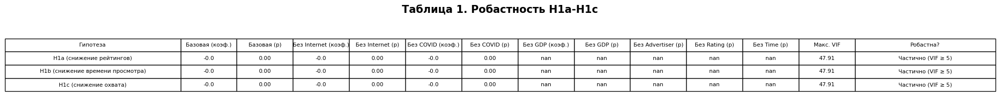

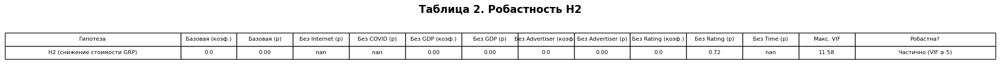

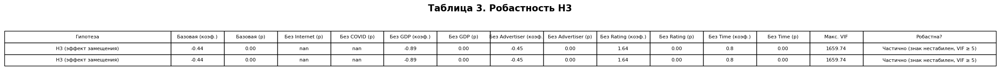

In [103]:
df_summary = pd.DataFrame(robustness_results)
df_summary = df_summary.dropna(axis=1, how='all')

for col in df_summary.columns:
    if df_summary[col].dtype in ['float64', 'float32']:
        if 'p' in col.lower():
            df_summary[col] = df_summary[col].apply(lambda x: f'{x:.2f}')
        else:
            df_summary[col] = df_summary[col].apply(lambda x: round(x, 2))

df_h1 = df_summary[df_summary['Гипотеза'].str.contains('H1')]
df_h2 = df_summary[df_summary['Гипотеза'].str.contains('H2')]
df_h3 = df_summary[df_summary['Гипотеза'].str.contains('H3')]

def save_table_as_image(data, title, filename):
    if len(data) == 0:
        return
    
    data_clean = data.dropna(axis=1, how='any')
    
    cols_order = []
    for col in data_clean.columns:
        if col != 'Макс. VIF' and col != 'Робастна?':
            cols_order.append(col)
    
    if 'Макс. VIF' in data_clean.columns:
        cols_order.append('Макс. VIF')
    if 'Робастна?' in data_clean.columns:
        cols_order.append('Робастна?')
    
    data_clean = data_clean[cols_order]
    
    n_rows = len(data_clean) + 1
    n_cols = len(data_clean.columns)
    
    fig_width = n_cols * 1.0
    fig_height = n_rows * 0.5
    
    fig, ax = plt.subplots(figsize=(fig_width, fig_height))
    ax.axis('tight')
    ax.axis('off')
    
    cell_text = data_clean.astype(str).values.tolist()
    cell_text.insert(0, data_clean.columns.tolist())
    
    col_widths = [0.08] * n_cols
    col_widths[0] = 0.25
    col_widths[-1] = 0.20
    
    table = ax.table(cellText=cell_text, cellLoc='center', loc='center', colWidths=col_widths)
    table.auto_set_font_size(False)
    table.set_fontsize(8)
    table.scale(1.3, 1.6)
    
    ax.set_title(title, fontsize=15, fontweight='bold', pad=20, loc='center')
    
    plt.savefig(filename, dpi=300, bbox_inches='tight')
    plt.show()

save_table_as_image(df_h1, "Таблица 1. Робастность H1a-H1c", "graph78.png")
save_table_as_image(df_h2, "Таблица 2. Робастность H2", "graph79.png")
save_table_as_image(df_h3, "Таблица 3. Робастность H3", "graph80.png")

 ## Коррекция моделей с использованием методов регуляризации

In [105]:
results_list = []

In [106]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge, RidgeCV
from sklearn.metrics import mean_squared_error
import statsmodels.api as sm

Y = df_new['ln_RTG']
X = df_new[['Time', 'HalfYear_1', 'COVID_dummy', 'ln_InternetPenetration', 'Advertiser_type']]

X_vif = X.copy()
vif_data = pd.DataFrame()
vif_data["Переменная"] = X_vif.columns
vif_data["VIF"] = [variance_inflation_factor(X_vif.values, i) for i in range(X_vif.shape[1])]
max_vif_before = vif_data["VIF"].max()

X_centered = X.copy()
for col in X.columns:
    X_centered[col] = X[col] - X[col].mean()

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_centered)
X_scaled_with_const = sm.add_constant(X_scaled)

ridge_cv = RidgeCV(alphas=[0.01, 0.1, 1.0, 5.0, 10.0, 50.0, 100.0, 500.0], 
                   scoring='neg_mean_squared_error', 
                   cv=5)
ridge_cv.fit(X_scaled_with_const, Y)
optimal_alpha = ridge_cv.alpha_

ridge = Ridge(alpha=optimal_alpha)
ridge.fit(X_scaled_with_const, Y)

model_ols = sm.OLS(Y, sm.add_constant(X_centered)).fit()

np.random.seed(42)
n_bootstrap = 200
ols_coefs_list = []
ridge_coefs_list = []

for _ in range(n_bootstrap):
    idx = np.random.choice(len(Y), len(Y), replace=True)
    X_boot = X_centered.iloc[idx]
    Y_boot = Y.iloc[idx]
    
    ols_boot = sm.OLS(Y_boot, sm.add_constant(X_boot)).fit()
    ols_coefs_list.append(ols_boot.params.values)
    
    scaler_boot = StandardScaler()
    X_scaled_boot = scaler_boot.fit_transform(X_boot)
    X_scaled_boot_const = sm.add_constant(X_scaled_boot)
    ridge_boot = Ridge(alpha=optimal_alpha)
    ridge_boot.fit(X_scaled_boot_const, Y_boot)
    ridge_coefs_list.append(ridge_boot.coef_)

ols_coefs_array = np.array(ols_coefs_list)
ridge_coefs_array = np.array(ridge_coefs_list)

ols_std = ols_coefs_array.std(axis=0)
ridge_std = ridge_coefs_array.std(axis=0)
stability_improvement = (1 - ridge_std.mean() / ols_std.mean()) * 100

X_scaled_for_cond = StandardScaler().fit_transform(X_centered)
cond_before = np.linalg.cond(X_scaled_for_cond)

XtX = X_scaled_for_cond.T @ X_scaled_for_cond
XtX_ridge = XtX + optimal_alpha * np.eye(XtX.shape[0])
cond_after = np.linalg.cond(XtX_ridge)
cond_improvement = (1 - cond_after / cond_before) * 100

time_index = list(X.columns).index('Time') + 1
ridge_time_coef = ridge.coef_[time_index]
ols_time_coef = model_ols.params['Time']

if cond_after < cond_before * 0.7:
    multicollinearity_status = "Значительно снижена (Ridge)"
elif cond_after < cond_before * 0.9:
    multicollinearity_status = "Частично снижена (Ridge)"
else:
    multicollinearity_status = "Сохраняется"

hypothesis_confirmed = "Гипотеза подтверждена" if ridge_time_coef < 0 else "Гипотеза не подтверждена"

results_list.append({
    'Гипотеза': 'H1a',
    'Зависимая переменная': 'ln_RTG',
    'R² (OLS)': model_ols.rsquared,
    'R² (Ridge)': ridge.score(X_scaled_with_const, Y),
    'MSE (OLS)': mean_squared_error(Y, model_ols.predict(sm.add_constant(X_centered))),
    'MSE (Ridge)': mean_squared_error(Y, ridge.predict(X_scaled_with_const)),
    'Оптимальный α': optimal_alpha,
    'Направление': 'отрицательный' if ridge_time_coef < 0 else 'положительный',
    'Вывод': hypothesis_confirmed,
    'Мультиколлинеарность': multicollinearity_status,
    'VIF_max (до)': max_vif_before,
    'Condition_Number (OLS)': cond_before,
    'Condition_Number (Ridge)': cond_after,
    'Снижение Condition Number%': f"{cond_improvement:.1f}%",
    'Стабильность_коэф_(Ridge)': f"Выше на {stability_improvement:.1f}%"
})


In [107]:
Y = df_new['ln_ATV']
X = df_new[['Time', 'HalfYear_1', 'COVID_dummy', 'ln_InternetPenetration', 'Advertiser_type']]

X_vif = X.copy()
vif_data = pd.DataFrame()
vif_data["Переменная"] = X_vif.columns
vif_data["VIF"] = [variance_inflation_factor(X_vif.values, i) for i in range(X_vif.shape[1])]
max_vif_before = vif_data["VIF"].max()

X_centered = X.copy()
for col in X.columns:
    X_centered[col] = X[col] - X[col].mean()

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_centered)
X_scaled_with_const = sm.add_constant(X_scaled)

ridge_cv = RidgeCV(alphas=[0.01, 0.1, 1.0, 5.0, 10.0, 50.0, 100.0, 500.0], 
                   scoring='neg_mean_squared_error', 
                   cv=5)
ridge_cv.fit(X_scaled_with_const, Y)
optimal_alpha = ridge_cv.alpha_

ridge = Ridge(alpha=optimal_alpha)
ridge.fit(X_scaled_with_const, Y)

model_ols = sm.OLS(Y, sm.add_constant(X_centered)).fit()

np.random.seed(42)
n_bootstrap = 200
ols_coefs_list = []
ridge_coefs_list = []

for _ in range(n_bootstrap):
    idx = np.random.choice(len(Y), len(Y), replace=True)
    X_boot = X_centered.iloc[idx]
    Y_boot = Y.iloc[idx]
    
    ols_boot = sm.OLS(Y_boot, sm.add_constant(X_boot)).fit()
    ols_coefs_list.append(ols_boot.params.values)
    
    scaler_boot = StandardScaler()
    X_scaled_boot = scaler_boot.fit_transform(X_boot)
    X_scaled_boot_const = sm.add_constant(X_scaled_boot)
    ridge_boot = Ridge(alpha=optimal_alpha)
    ridge_boot.fit(X_scaled_boot_const, Y_boot)
    ridge_coefs_list.append(ridge_boot.coef_)

ols_coefs_array = np.array(ols_coefs_list)
ridge_coefs_array = np.array(ridge_coefs_list)

ols_std = ols_coefs_array.std(axis=0)
ridge_std = ridge_coefs_array.std(axis=0)
stability_improvement = (1 - ridge_std.mean() / ols_std.mean()) * 100

X_scaled_for_cond = StandardScaler().fit_transform(X_centered)
cond_before = np.linalg.cond(X_scaled_for_cond)

XtX = X_scaled_for_cond.T @ X_scaled_for_cond
XtX_ridge = XtX + optimal_alpha * np.eye(XtX.shape[0])
cond_after = np.linalg.cond(XtX_ridge)
cond_improvement = (1 - cond_after / cond_before) * 100

time_index = list(X.columns).index('Time') + 1
ridge_time_coef = ridge.coef_[time_index]
ols_time_coef = model_ols.params['Time']

if cond_after < cond_before * 0.7:
    multicollinearity_status = "Значительно снижена (Ridge)"
elif cond_after < cond_before * 0.9:
    multicollinearity_status = "Частично снижена (Ridge)"
else:
    multicollinearity_status = "Сохраняется"

hypothesis_confirmed = "Гипотеза подтверждена" if ridge_time_coef < 0 else "Гипотеза не подтверждена"

results_list.append({
    'Гипотеза': 'H1b',
    'Зависимая переменная': 'ln_ATV',
    'R² (OLS)': model_ols.rsquared,
    'R² (Ridge)': ridge.score(X_scaled_with_const, Y),
    'MSE (OLS)': mean_squared_error(Y, model_ols.predict(sm.add_constant(X_centered))),
    'MSE (Ridge)': mean_squared_error(Y, ridge.predict(X_scaled_with_const)),
    'Оптимальный α': optimal_alpha,
    'Направление': 'отрицательный' if ridge_time_coef < 0 else 'положительный',
    'Вывод': hypothesis_confirmed,
    'Мультиколлинеарность': multicollinearity_status,
    'VIF_max (до)': max_vif_before,
    'Condition_Number (OLS)': cond_before,
    'Condition_Number (Ridge)': cond_after,
    'Снижение Condition Number%': f"{cond_improvement:.1f}%",
    'Стабильность_коэф_(Ridge)': f"Выше на {stability_improvement:.1f}%"
})


In [108]:
Y = df_new['ln_AvReach']
X = df_new[['Time', 'HalfYear_1', 'COVID_dummy', 'ln_InternetPenetration', 'Advertiser_type']]

X_vif = X.copy()
vif_data = pd.DataFrame()
vif_data["Переменная"] = X_vif.columns
vif_data["VIF"] = [variance_inflation_factor(X_vif.values, i) for i in range(X_vif.shape[1])]
max_vif_before = vif_data["VIF"].max()

X_centered = X.copy()
for col in X.columns:
    X_centered[col] = X[col] - X[col].mean()

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_centered)
X_scaled_with_const = sm.add_constant(X_scaled)

ridge_cv = RidgeCV(alphas=[0.01, 0.1, 1.0, 5.0, 10.0, 50.0, 100.0, 500.0], 
                   scoring='neg_mean_squared_error', 
                   cv=5)
ridge_cv.fit(X_scaled_with_const, Y)
optimal_alpha = ridge_cv.alpha_

ridge = Ridge(alpha=optimal_alpha)
ridge.fit(X_scaled_with_const, Y)

model_ols = sm.OLS(Y, sm.add_constant(X_centered)).fit()

np.random.seed(42)
n_bootstrap = 200
ols_coefs_list = []
ridge_coefs_list = []

for _ in range(n_bootstrap):
    idx = np.random.choice(len(Y), len(Y), replace=True)
    X_boot = X_centered.iloc[idx]
    Y_boot = Y.iloc[idx]
    
    ols_boot = sm.OLS(Y_boot, sm.add_constant(X_boot)).fit()
    ols_coefs_list.append(ols_boot.params.values)
    
    scaler_boot = StandardScaler()
    X_scaled_boot = scaler_boot.fit_transform(X_boot)
    X_scaled_boot_const = sm.add_constant(X_scaled_boot)
    ridge_boot = Ridge(alpha=optimal_alpha)
    ridge_boot.fit(X_scaled_boot_const, Y_boot)
    ridge_coefs_list.append(ridge_boot.coef_)

ols_coefs_array = np.array(ols_coefs_list)
ridge_coefs_array = np.array(ridge_coefs_list)

ols_std = ols_coefs_array.std(axis=0)
ridge_std = ridge_coefs_array.std(axis=0)
stability_improvement = (1 - ridge_std.mean() / ols_std.mean()) * 100

X_scaled_for_cond = StandardScaler().fit_transform(X_centered)
cond_before = np.linalg.cond(X_scaled_for_cond)

XtX = X_scaled_for_cond.T @ X_scaled_for_cond
XtX_ridge = XtX + optimal_alpha * np.eye(XtX.shape[0])
cond_after = np.linalg.cond(XtX_ridge)
cond_improvement = (1 - cond_after / cond_before) * 100

time_index = list(X.columns).index('Time') + 1
ridge_time_coef = ridge.coef_[time_index]
ols_time_coef = model_ols.params['Time']

if cond_after < cond_before * 0.7:
    multicollinearity_status = "Значительно снижена (Ridge)"
elif cond_after < cond_before * 0.9:
    multicollinearity_status = "Частично снижена (Ridge)"
else:
    multicollinearity_status = "Сохраняется"

hypothesis_confirmed = "Гипотеза подтверждена" if ridge_time_coef < 0 else "Гипотеза не подтверждена"

results_list.append({
    'Гипотеза': 'H1c',
    'Зависимая переменная': 'ln_AvReach',
    'R² (OLS)': model_ols.rsquared,
    'R² (Ridge)': ridge.score(X_scaled_with_const, Y),
    'MSE (OLS)': mean_squared_error(Y, model_ols.predict(sm.add_constant(X_centered))),
    'MSE (Ridge)': mean_squared_error(Y, ridge.predict(X_scaled_with_const)),
    'Оптимальный α': optimal_alpha,
    'Направление': 'отрицательный' if ridge_time_coef < 0 else 'положительный',
    'Вывод': hypothesis_confirmed,
    'Мультиколлинеарность': multicollinearity_status,
    'VIF_max (до)': max_vif_before,
    'Condition_Number (OLS)': cond_before,
    'Condition_Number (Ridge)': cond_after,
    'Снижение Condition Number%': f"{cond_improvement:.1f}%",
    'Стабильность_коэф_(Ridge)': f"Выше на {stability_improvement:.1f}%"
})


In [109]:
Y = df_new['ln_CostByGRP']
X = df_new[['Time', 'ln_RTG', 'ln_GDP', 'Advertiser_type']]

X_vif = X.copy()
vif_data = pd.DataFrame()
vif_data["Переменная"] = X_vif.columns
vif_data["VIF"] = [variance_inflation_factor(X_vif.values, i) for i in range(X_vif.shape[1])]
max_vif_before = vif_data["VIF"].max()

X_centered = X.copy()
for col in X.columns:
    X_centered[col] = X[col] - X[col].mean()

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_centered)
X_scaled_with_const = sm.add_constant(X_scaled)

ridge_cv = RidgeCV(alphas=[0.01, 0.1, 1.0, 5.0, 10.0, 50.0, 100.0, 500.0], 
                   scoring='neg_mean_squared_error', 
                   cv=5)
ridge_cv.fit(X_scaled_with_const, Y)
optimal_alpha = ridge_cv.alpha_

ridge = Ridge(alpha=optimal_alpha)
ridge.fit(X_scaled_with_const, Y)

model_ols = sm.OLS(Y, sm.add_constant(X_centered)).fit()

np.random.seed(42)
n_bootstrap = 200
ols_coefs_list = []
ridge_coefs_list = []

for _ in range(n_bootstrap):
    idx = np.random.choice(len(Y), len(Y), replace=True)
    X_boot = X_centered.iloc[idx]
    Y_boot = Y.iloc[idx]
    
    ols_boot = sm.OLS(Y_boot, sm.add_constant(X_boot)).fit()
    ols_coefs_list.append(ols_boot.params.values)
    
    scaler_boot = StandardScaler()
    X_scaled_boot = scaler_boot.fit_transform(X_boot)
    X_scaled_boot_const = sm.add_constant(X_scaled_boot)
    ridge_boot = Ridge(alpha=optimal_alpha)
    ridge_boot.fit(X_scaled_boot_const, Y_boot)
    ridge_coefs_list.append(ridge_boot.coef_)

ols_coefs_array = np.array(ols_coefs_list)
ridge_coefs_array = np.array(ridge_coefs_list)

ols_std = ols_coefs_array.std(axis=0)
ridge_std = ridge_coefs_array.std(axis=0)
stability_improvement = (1 - ridge_std.mean() / ols_std.mean()) * 100

X_scaled_for_cond = StandardScaler().fit_transform(X_centered)
cond_before = np.linalg.cond(X_scaled_for_cond)

XtX = X_scaled_for_cond.T @ X_scaled_for_cond
XtX_ridge = XtX + optimal_alpha * np.eye(XtX.shape[0])
cond_after = np.linalg.cond(XtX_ridge)
cond_improvement = (1 - cond_after / cond_before) * 100

time_index = list(X.columns).index('Time') + 1
ridge_time_coef = ridge.coef_[time_index]
ols_time_coef = model_ols.params['Time']

if cond_after < cond_before * 0.7:
    multicollinearity_status = "Значительно снижена (Ridge)"
elif cond_after < cond_before * 0.9:
    multicollinearity_status = "Частично снижена (Ridge)"
else:
    multicollinearity_status = "Сохраняется"

hypothesis_confirmed = "Гипотеза подтверждена" if ridge_time_coef < 0 else "Гипотеза не подтверждена"

results_list.append({
    'Гипотеза': 'H2',
    'Зависимая переменная': 'ln_CostByGRP',
    'R² (OLS)': model_ols.rsquared,
    'R² (Ridge)': ridge.score(X_scaled_with_const, Y),
    'MSE (OLS)': mean_squared_error(Y, model_ols.predict(sm.add_constant(X_centered))),
    'MSE (Ridge)': mean_squared_error(Y, ridge.predict(X_scaled_with_const)),
    'Оптимальный α': optimal_alpha,
    'Направление': 'отрицательный' if ridge_time_coef < 0 else 'положительный',
    'Вывод': hypothesis_confirmed,
    'Мультиколлинеарность': multicollinearity_status,
    'VIF_max (до)': max_vif_before,
    'Condition_Number (OLS)': cond_before,
    'Condition_Number (Ridge)': cond_after,
    'Снижение Condition Number%': f"{cond_improvement:.1f}%",
    'Стабильность_коэф_(Ridge)': f"Выше на {stability_improvement:.1f}%"
})


In [110]:
Y = df_new['ln_CostByGRP']
X = df_new[['ln_Internet_sales', 'ln_GDP', 'Time', 'ln_RTG', 'Advertiser_type']]

X_vif = X.copy()
vif_data = pd.DataFrame()
vif_data["Переменная"] = X_vif.columns
vif_data["VIF"] = [variance_inflation_factor(X_vif.values, i) for i in range(X_vif.shape[1])]
max_vif_before = vif_data["VIF"].max()

X_centered = X.copy()
for col in X.columns:
    X_centered[col] = X[col] - X[col].mean()

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_centered)
X_scaled_with_const = sm.add_constant(X_scaled)

ridge_cv = RidgeCV(alphas=[0.01, 0.1, 1.0, 5.0, 10.0, 50.0, 100.0, 500.0], 
                   scoring='neg_mean_squared_error', 
                   cv=5)
ridge_cv.fit(X_scaled_with_const, Y)
optimal_alpha = ridge_cv.alpha_

ridge = Ridge(alpha=optimal_alpha)
ridge.fit(X_scaled_with_const, Y)

model_ols = sm.OLS(Y, sm.add_constant(X_centered)).fit()

np.random.seed(42)
n_bootstrap = 200
ols_coefs_list = []
ridge_coefs_list = []

for _ in range(n_bootstrap):
    idx = np.random.choice(len(Y), len(Y), replace=True)
    X_boot = X_centered.iloc[idx]
    Y_boot = Y.iloc[idx]
    
    ols_boot = sm.OLS(Y_boot, sm.add_constant(X_boot)).fit()
    ols_coefs_list.append(ols_boot.params.values)
    
    scaler_boot = StandardScaler()
    X_scaled_boot = scaler_boot.fit_transform(X_boot)
    X_scaled_boot_const = sm.add_constant(X_scaled_boot)
    ridge_boot = Ridge(alpha=optimal_alpha)
    ridge_boot.fit(X_scaled_boot_const, Y_boot)
    ridge_coefs_list.append(ridge_boot.coef_)

ols_coefs_array = np.array(ols_coefs_list)
ridge_coefs_array = np.array(ridge_coefs_list)

ols_std = ols_coefs_array.std(axis=0)
ridge_std = ridge_coefs_array.std(axis=0)
stability_improvement = (1 - ridge_std.mean() / ols_std.mean()) * 100

X_scaled_for_cond = StandardScaler().fit_transform(X_centered)
cond_before = np.linalg.cond(X_scaled_for_cond)

XtX = X_scaled_for_cond.T @ X_scaled_for_cond
XtX_ridge = XtX + optimal_alpha * np.eye(XtX.shape[0])
cond_after = np.linalg.cond(XtX_ridge)
cond_improvement = (1 - cond_after / cond_before) * 100

internet_sales_index = list(X.columns).index('ln_Internet_sales') + 1
ridge_internet_sales_coef = ridge.coef_[internet_sales_index]
ols_internet_sales_coef = model_ols.params['ln_Internet_sales']

if cond_after < cond_before * 0.7:
    multicollinearity_status = "Значительно снижена (Ridge)"
elif cond_after < cond_before * 0.9:
    multicollinearity_status = "Частично снижена (Ridge)"
else:
    multicollinearity_status = "Сохраняется"

hypothesis_confirmed = "Гипотеза подтверждена" if ridge_internet_sales_coef < 0 else "Гипотеза не подтверждена"

results_list.append({
    'Гипотеза': 'H3',
    'Зависимая переменная': 'ln_CostByGRP',
    'R² (OLS)': model_ols.rsquared,
    'R² (Ridge)': ridge.score(X_scaled_with_const, Y),
    'MSE (OLS)': mean_squared_error(Y, model_ols.predict(sm.add_constant(X_centered))),
    'MSE (Ridge)': mean_squared_error(Y, ridge.predict(X_scaled_with_const)),
    'Оптимальный α': optimal_alpha,
    'Направление': 'отрицательный' if ridge_internet_sales_coef < 0 else 'положительный',
    'Вывод': hypothesis_confirmed,
    'Мультиколлинеарность': multicollinearity_status,
    'VIF_max (до)': max_vif_before,
    'Condition_Number (OLS)': cond_before,
    'Condition_Number (Ridge)': cond_after,
    'Снижение Condition Number%': f"{cond_improvement:.1f}%",
    'Стабильность_коэф_(Ridge)': f"Выше на {stability_improvement:.1f}%"
})

In [111]:
results_df = pd.DataFrame(results_list)
results_df

,Гипотеза,Зависимая переменная,R² (OLS),R² (Ridge),MSE (OLS),MSE (Ridge),Оптимальный α,Направление,Вывод,Мультиколлинеарность,VIF_max (до),Condition_Number (OLS),Condition_Number (Ridge),Снижение Condition Number%,Стабильность_коэф_(Ridge)
0,H1a,ln_RTG,0.010440,0.009231,1.823932,1.826161,500.0,отрицательный,Гипотеза подтверждена,Сохраняется,47.913568,7.489634,32.439450,-333.1%,Выше на 94.1%
1,H1b,ln_ATV,0.010440,0.009231,1.823967,1.826195,500.0,отрицательный,Гипотеза подтверждена,Сохраняется,47.913568,7.489634,32.439450,-333.1%,Выше на 94.1%
2,H1c,ln_AvReach,0.020058,0.017532,1.087195,1.089997,500.0,отрицательный,Гипотеза подтверждена,Сохраняется,47.913568,7.489634,32.439450,-333.1%,Выше на 94.3%
3,H2,ln_CostByGRP,0.732246,0.732244,0.511071,0.511074,10.0,положительный,Гипотеза не подтверждена,Сохраняется,11.580869,6.994790,48.075104,-587.3%,Выше на 57.1%
4,H3,ln_CostByGRP,0.732439,0.732273,0.510702,0.511018,100.0,отрицательный,Гипотеза подтверждена,Сохраняется,1659.743762,10.745967,89.745239,-735.2%,Выше на 70.9%
